<h1><center>The Process of Data Science - Summer 2022</h1></center>
<h1><center>Assignment 3 Amazon book reivew</h1></center>

<b>Zesheng Jia</b>  



# Table of Contents<a class="anchor" id="top"></a>

* # [Initialization](#initialization)
    * ### [Import packages](#packages)
    * ### [Jupyter notebook setting](#book_setting)
    * ### [Utility function](#func_task1)
* # [Chapter 1. Task 1: Data understanding](#task1_top)
* # [Chapter 2. Task 2. Text normalization and feature engineering (0.2)](#task2_top) 
* # [Chapter 3. Task 3. Build a model to predict overall score (0.3)](#task3_top)    
* # [Chapter 4. Task 4. Perform part-of-speech tagging (0.35)](#task3_top)   
* # [Reference](#ref)   
             

## Initialization <a class="anchor" id="initialization" name="initialization"></a>

#### Download dataset and files

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!wget http://deepyeti.ucsd.edu/jianmo/amazon/categoryFilesSmall/Books_5.json.gz

### Import some packages<a class="anchor" name="packages"></a>
> Hidden Cell: You may unfold this section for code details

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.model_selection import train_test_split
# import all related libraries
import pandas as pd
import warnings
import seaborn as sns
from datetime import datetime
from datetime import timedelta
import joblib
import datetime
import math
from sklearn.base import BaseEstimator, TransformerMixin

# PyTorch
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader

# For data preprocess
import numpy as np
import csv
import os

# For plotting
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure

# get basemap for geographical plot
# from mpl_toolkits.basemap import Basemap

myseed = 42069  # set a random seed for reproducibility
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False
np.random.seed(myseed)
torch.manual_seed(myseed)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(myseed)

# Numerical Operations
import math
import numpy as np

# Reading/Writing Data
import pandas as pd
import os
import csv

# For Progress Bar
from tqdm import tqdm

# Pytorch
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader, random_split

# For plotting learning curve
from torch.utils.tensorboard import SummaryWriter

# for matplotlib ploting
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure

from sklearn.model_selection import learning_curve
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import validation_curve
from sklearn.pipeline import make_pipeline
import matplotlib.pyplot as plt
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import f1_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import recall_score
from sklearn.metrics import precision_score
from sklearn.metrics import fbeta_score
from sklearn.metrics import classification_report
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report
import matplotlib.pyplot as plt
import numpy
from sklearn import metrics

from sklearn.preprocessing import normalize
from sklearn.metrics import confusion_matrix

import nltk
# download the basic list of data and models
nltk.download('popular')

# download "book" collection of datasets from NLTK website
nltk.download("book")

from nltk.book import *
from nltk.corpus import stopwords    
stop_words = set(stopwords.words('english'))

[nltk_data] Downloading collection 'popular'
[nltk_data]    | 
[nltk_data]    | Downloading package cmudict to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/cmudict.zip.
[nltk_data]    | Downloading package gazetteers to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/gazetteers.zip.
[nltk_data]    | Downloading package genesis to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/genesis.zip.
[nltk_data]    | Downloading package gutenberg to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/gutenberg.zip.
[nltk_data]    | Downloading package inaugural to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/inaugural.zip.
[nltk_data]    | Downloading package movie_reviews to
[nltk_data]    |     /root/nltk_data...
[nltk_data]    |   Unzipping corpora/movie_reviews.zip.
[nltk_data]    | Downloading package names to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/names.zip.
[nltk_data]    | Downloading package shakespeare to /root/nltk_data...
[nlt

*** Introductory Examples for the NLTK Book ***
Loading text1, ..., text9 and sent1, ..., sent9
Type the name of the text or sentence to view it.
Type: 'texts()' or 'sents()' to list the materials.
text1: Moby Dick by Herman Melville 1851
text2: Sense and Sensibility by Jane Austen 1811
text3: The Book of Genesis
text4: Inaugural Address Corpus
text5: Chat Corpus
text6: Monty Python and the Holy Grail
text7: Wall Street Journal
text8: Personals Corpus
text9: The Man Who Was Thursday by G . K . Chesterton 1908


### Jupyer notebook setting<a class="anchor" name="book_setting"></a>
> Hidden Cell: You may unfold this section for code details

In [ ]:
sns.set()
# Set up with a higher resolution screen (useful on Mac)
%config InlineBackend.figure_format = 'retina'

###############################################
def max_print_out(pattern=False):
    '''It will maximize print out line and set float format with .2f'''
    number = None if pattern else 10
    # Set options to avoid truncation when displaying a dataframe
    pd.set_option("display.max_rows", number)
    pd.set_option("display.max_columns", 50)
    # Set floating point numbers to be displayed with 2 decimal places
    pd.set_option('display.float_format', '{:.2f}'.format)
    # for showing all entities 
    

### Utility Function <a class="anchor" name="func_task1"></a>
> Hidden Cell: You may unfold this section for code details

In [ ]:
################################  NEW FUNCTION IN AS3 ################################
#--------------remove_stop_words-------------
def remove_stop_words(data, stop_words):
  feature = data.select_dtypes(exclude="number").columns
  for i in range(len(feature)):
      print("Now it's removing stop words from ", feature[i])
      # remove stop words
      # first change all character to lower case
      data[feature[i]] = data[feature[i]].str.lower()
      data[feature[i]] = data[feature[i]].apply(lambda x: ' '.join([word for word in x.split() if word not in (stop_words)]))
  return data 

#-----------get_model_set-------------
def get_model_set(data):
  # get our data set into features and labels
  X = data.iloc[:,:-1]
  y = data.iloc[:,-1:].values.ravel()
  y = y.astype(int)
  return X, y

#---------words_importance_plot---------------------
def words_importance_barplot(results, fig_size = (8,8)):
  fig, ax = plt.subplots(figsize = fig_size)
  results.boxplot(ax=ax)
  ax.set_ylabel('Importance')
  ax.set_title("Barplot of words' importance")

  
#--------------remove_num_non_letters-------------
def remove_num_non_letters(data):
  feature = data.select_dtypes(exclude="number").columns
  for i in range(len(feature)):
      print("Now it's removing num_non_letters from ", feature[i])
      # remove stop words
      # first change all character to lower case
      data[feature[i]] = data[feature[i]].str.replace('[^\w\s]+', '')
      data[feature[i]] = data[feature[i]].str.replace('[0-9]+', '')
  return data     



# def a function to draw the Bar plot
#----------------plot_frequenct_words_bar-------------------
def plot_frequenct_words_bar(data, figsize = (15,10), name = 'style'):
  fig, ax = plt.subplots(figsize = figsize)
  data.plot.barh(ax = ax)
  ax.set_title("Most frequent 50 words' distribution of " + str(name))
  ax.set_ylabel('Counts')

# def a function to get the report
#------------------frequent_words_reports---------------------
def frequent_words_reports(data, feature = 'style'):
  max_print_out(True)
  frequent_words = data[feature].str.split(expand=True).stack().value_counts().head(50) # get value accounts for words
  frequent_words = pd.DataFrame(frequent_words)
  plot_frequenct_words_bar(frequent_words)
  return frequent_words



#--------------- get_words_reports-------------
from tqdm.notebook import tqdm
def get_words_dictionary(data, column_number = 3):
  # initialize dictionary
  words_dictionary = {}
  # loop all instances 
  for i in tqdm(range(len(data))):
    # get text from each instances
    text_array  = data.iloc[i, column_number]
    # get words
    for text in text_array.split():
      # if the word doesn't exits in dictionary then set number to 1
      if words_dictionary.get(text) == None:
        words_dictionary[text] = 1
      # if the word alreadt exits, then add number 1
      else:
        words_dictionary[text] = words_dictionary.get(text) + 1 
  return words_dictionary


#-------------words_frequency_report--------------
def words_frequency_report(data, feature = 'reviewText',show_all=False,fig_size = (15,10)):
  # get column number
  column_number = data.columns.get_loc(feature)
  print("Start getting word reports by ", feature)
  words_dictionary = get_words_dictionary(data, column_number)
  print("### Finish get the words report")
  # get report 
  report = pd.DataFrame.from_dict(words_dictionary, orient='index')
  report.columns = ['counts']
  print("Load into Pandas dataFrame")
  # sort report
  report = report.sort_values(by=['counts'],  ascending=False)
  print("Sorting DataFrame")
  # decide if print all
  if show_all:
    report_head = report
  else:    
    # get first 50 columns
    report_head = report.head(50)

  print("Get report's top words\nStart plotting")
  # plot setting
  fig, ax = plt.subplots(figsize = fig_size)
  report_head.plot.barh(ax = ax)

  if show_all:
      ax.set_title("Distribution of " + str(feature))
  else:  
    ax.set_title("Most frequent 50 words' distribution of " + str(feature))
  ax.set_xlabel('Counts')
  ax.set_ylabel('Words')
  plt.gca().invert_yaxis()
  return report

from sklearn.feature_selection import SelectKBest

# ------------------feature selection-------------------------
def select_features_prompt(X_train, y_train, X_test,function):
    # configure to select all features
    fs = SelectKBest(score_func=function, k='all')
    # learn relationship from training data
    fs.fit(X_train, y_train)
    # transform train input data
    X_train_fs = fs.transform(X_train)
    # transform test input data
    X_test_fs = fs.transform(X_test)
    # what are scores for the features

    # print features' name and score
    for i in range(len(fs.scores_)):
        print(f'Feature {i}  {features_name[i]}: { fs.scores_[i]}' )
    return fs.scores_

#---------words_importance_plot---------------------
def words_importance_plot(results, fig_size = (15,10)):
  fig, ax = plt.subplots(figsize = fig_size)
  results.plot.barh(ax=ax)
  plt.gca().invert_yaxis()
  ax.set_ylabel('Importance')
  ax.set_title("Barplot of words' importance")


#--------------text_item_properties---------------#
'''We want to save all the results to a new dataframe'''
def text_item_properties(data):
  result = pd.DataFrame()
  data = data.copy()
  # we just fill na with 0 here. Without doing so, there will be an error
  data = data.fillna('0')
  for i in range(len(data.columns)):
    # get character length
    result['Text_length'] = data[str(data.columns[i])].str.len() 
    # get number of words
    result['num_of_words'] = data[str(data.columns[i])].str.split().str.len()
    # get non alphanumeric number
    result['presence_non_alphanumeric'] = data[str(data.columns[i])].str.replace('[a-zA-Z0-9 ]', '').str.len()
    # get stop words account
    result['stop_words_count'] = data[str(data.columns[i])].str.split().apply(lambda x: len(set(x) & stop_words)) 
  return result 
#---------------clean_useless_information---------------

def clean_useless_information(data_df, columns = ['reviewText']):
  data = data_df.copy()
  for i in range(len(columns)):
    # clean html tag
    data[columns[i]] = data[(columns[i])].str.replace('<[^<]+?>', '')
    # clean &nbsp
    data[(columns[i])] = data[(columns[i])].str.replace('&nbsp', '')
    # clean http URL
    data[(columns[i])] = data[(columns[i])].str.replace('http\S+', '')
    # clean line breaker
    data[(columns[i])] = data[(columns[i])].str.replace('\n', '')
    return data
    
#----------------TDIDF_Data_generator---------------
def TDIDF_Data_generator(data, max_features = 500):
  from sklearn.feature_extraction.text import TfidfVectorizer
  from sklearn.feature_extraction.text import TfidfTransformer
  # we set for max_features: as most words we saved for 500 words
  # in order to not exceed our memory
  v_test = TfidfVectorizer(stop_words='english', max_features = max_features)
  v_style = TfidfVectorizer(stop_words='english', max_features = 8)
  # get TDIDF array from token_text
  x_token_text = v_test.fit_transform(data['token_text'])
  # save it into a pandas dataframe
  tdidf_data = pd.DataFrame(x_token_text.toarray())
  # get TDIDF array from style
  x_style = v_style.fit_transform(data['style'])
  tdidf_data = pd.concat([tdidf_data, pd.DataFrame(x_style.toarray())], axis = 1)
  tdidf_data['verified'] = data['verified']
  tdidf_data['score'] = data['score']
  return tdidf_data
  

#----------------TDIDF_Data_generator_pos---------------
def TDIDF_Data_generator_pos(data, max_features = 1000, feature_name='only_noun'):
  from sklearn.feature_extraction.text import TfidfVectorizer
  from sklearn.feature_extraction.text import TfidfTransformer
  # we set for max_features: as most words we saved for 500 words
  # in order to not exceed our memory
  v_test = TfidfVectorizer(stop_words='english', max_features = max_features)
  # get TDIDF array from token_text
  x_token_text = v_test.fit_transform(data[feature_name])
  # save it into a pandas dataframe
  tdidf_data = pd.DataFrame(x_token_text.toarray(), columns = v_test.get_feature_names() )

  data_copy = data.copy()
  data_copy = data_copy.reset_index() # need to reset index for matching the results

  tdidf_data['verified'] = data_copy['verified']
  tdidf_data['score'] = data_copy['score']
  return tdidf_data


#-------------find_outliers-----------------
def find_outliers(data_df, parameter,* , drop=False, set_threshold=False, threshold_value = 350): # deal with outliers    
    '''detect and delete outliers '''
    # same with previous find_outliers function
    Q1 = data_df[parameter].quantile(0.25)
    Q3 = data_df[parameter].quantile(0.75)
    IQR = Q3-Q1
    
    print(f"IQR = {Q3} - {Q1} = {IQR}")
    print(f"MAX = {(Q3 + 1.5 * IQR)}")
    
    if Q1 > 1.5*IQR :
        print("Min: ", (Q1 - 1.5 * IQR))
    else:
        print("Min is 0")

    cut_out_value =  (Q3 + 1.5 * IQR) # normal outliers deleted
    # override the value if we set threshold
    if set_threshold == True:
        cut_out_value = threshold_value
    
    # get min outliers' index 
    # get max outliers' index
    min_outliers_df = data_df[(data_df[parameter] < (Q1 - 1.5 * IQR))]
    max_outliers_df = data_df[(data_df[parameter] > cut_out_value)]
    # get negtive outliers' index  
    negative_outliers_df = data_df[(data_df[parameter] <= 0)]         
    print("Num of min outliers: ", len(min_outliers_df))
    print("Num of max outliers: ", len(max_outliers_df))
    print("Num of negative outliers: ", len(negative_outliers_df))
    print("Num of the original data set's whole instance", len(data_df))
    print("Rate of purged data/total data", len(max_outliers_df)/ len(data_df))

    # It's pretty hard to drop multiple indexes at the same time
    # Because after one drop action, their index are changed from then
    # We need to alter the order of aboving codes. 
    # And it's pretty unnecessary for us to do this in our assignemnt
    # Since we don't have min outliers in this dataset
    # And negative values are not outliers
    # I decided to purge negative values in transformer instead of here
    return max_outliers_df.index


#---------------clean_useless_information---------------
def show_purged_reports(data_df, parameter = ['reviewText'], output_type = 'num_of_words'):
  data = data_df.copy() # get the copy
  # get our reports
  reports = text_item_properties( data.loc[:, parameter]);
  # find outliers
  index = find_outliers(reports, output_type);
  # plot the results
  ax = mulitple_function_plots(data=reports.drop(index), kde_type = False, plot_type="histogram",data_type="number", fig_size=(15,7),tight_layout=False)
  ax = mulitple_function_plots(data=reports.drop(index), kde_type= False , plot_type="boxplot",data_type="number", fig_size=(15,7) , tight_layout=False);
  return reports, index

#------------------------learning_curve------------------
def learning_curve(N, train_lc, val_lc):
  # set the figure size
  fig, ax = plt.subplots(figsize=(16, 6))
  # get the training score
  ax.plot(N, np.mean(train_lc, 1), color='blue', label='training score')
  # get the validation score
  ax.plot(N, np.mean(val_lc, 1), color='red', label='validation score')
  # draw the grid line
  ax.hlines(np.mean([train_lc[-1], val_lc[-1]]), N[0], N[-1],
                color='gray', linestyle='dashed')
  # graph setting up
  ax.set_ylim(0.5, 1.2)
  ax.set_xlim(N[0], N[-1])
  ax.set_xlabel('training size')
  ax.set_ylabel('Accuracy')
  ax.set_title("Random forest Accuracy Train/Valid of our final model")
  ax.legend(loc='best')
  fig.show()

#------------------------valid_score_curve------------------
def valid_score_curve(train_score, val_score, n_estimators = np.arange(1, 50)):
  fig, ax = plt.subplots(figsize=(16, 6))
  # get mean of 5 cv of values
  ax.plot(n_estimators, np.median(train_score, 1), color='blue', label='training score')
  ax.plot(n_estimators, np.median(val_score, 1), color='red', label='validation score')
  # matplot setting
  ax.legend(loc='best')
  ax.set_ylim(0.1, 1.2)
  ax.set_xlim(0, 50)
  ax.set_title("Train/Valid ACCURACY loss of different random forest models")
  ax.set_xlabel('number of trees')
  ax.set_ylabel('ACCURACY');
  plt.show()

#---------------clean_useless_information---------------
def show_reports(data_df, parameter = ['reviewText'], output_type = 'num_of_words'):
  data = data_df.copy() # get the copy
  # get our reports
  reports = text_item_properties( data.loc[:, parameter]);
  # plot the results
  ax = mulitple_function_plots(data=reports, kde_type = False, plot_type="histogram",data_type="number", fig_size=(15,7),tight_layout=False)
  ax = mulitple_function_plots(data=reports, kde_type= False , plot_type="boxplot",data_type="number", fig_size=(15,7) , tight_layout=False);
  return reports



################################  FUNCTION  ################################


    

#--------------------------Describe columns----------------------------------------

def describe_columns(data, features_name=[]):
    '''This function will help u print out features value counts'''
    if len(features_name) > 1:
        for i in range(len(features_name)):
            print("----------", data[features_name[i]].name,"---------")
            print(data[features_name[i]].value_counts())
    else:
        print("----------", data[features_name[0]].name,"---------")
        print(data[features_name[0]].value_counts())
        

#-------------Function from tutorial 2-----------------------------

def build_continuous_features_report(data_df):
    
    """Build tabular report for continuous features"""

    stats = {
        "Count": len,
        "Miss %": lambda df: df.isna().sum() / len(df) * 100,
        "Card.": lambda df: df.nunique(),
        "Min": lambda df: df.min(),
        "1st Qrt.": lambda df: df.quantile(0.25),
        "Mean": lambda df: df.mean(),
        "Median": lambda df: df.median(),
        "3rd Qrt": lambda df: df.quantile(0.75),
        "Max": lambda df: df.max(),
        "Std. Dev.": lambda df: df.std(),
    }

    contin_feat_names = data_df.select_dtypes("number").columns
    continuous_data_df = data_df[contin_feat_names]

    report_df = pd.DataFrame(index=contin_feat_names, columns=stats.keys())

    for stat_name, fn in stats.items():
        # NOTE: ignore warnings for empty features
        with warnings.catch_warnings():
            warnings.simplefilter("ignore", category=RuntimeWarning)
            report_df[stat_name] = fn(continuous_data_df)

    return report_df
    
#-------------Function from tutorial 2---------------------------

def build_categorical_features_report(data_df):

    """Build tabular report for categorical features"""

    def _mode(df):
        return df.apply(lambda ft: ft.mode().to_list()).T

    def _mode_freq(df):
        return df.apply(lambda ft: ft.value_counts()[ft.mode()].sum())

    def _second_mode(df):
        return df.apply(lambda ft: ft[~ft.isin(ft.mode())].mode().to_list())

    def _second_mode_freq(df):
        return df.apply(
            lambda ft: ft[~ft.isin(ft.mode())]
            .value_counts()[ft[~ft.isin(ft.mode())].mode()]
            .sum()
        )

    stats = {
        "Count": len,
        "Miss %": lambda df: df.isna().sum() / len(df) * 100,
        "Card.": lambda df: df.nunique(),
        "Mode": _mode,
        "Mode Freq": _mode_freq,
        "Mode %": lambda df: _mode_freq(df) / len(df) * 100,
        "2nd Mode": _second_mode,
        "2nd Mode Freq": _second_mode_freq,
        "2nd Mode %": lambda df: _second_mode_freq(df) / len(df) * 100,
    }

    cat_feat_names = data_df.select_dtypes(exclude="number").columns
    continuous_data_df = data_df[cat_feat_names]

    report_df = pd.DataFrame(index=cat_feat_names, columns=stats.keys())

    for stat_name, fn in stats.items():
        # NOTE: ignore warnings for empty features
        with warnings.catch_warnings():
            warnings.simplefilter("ignore", category=RuntimeWarning)
            report_df[stat_name] = fn(continuous_data_df)

    return report_df


#-------------One function to plot multiple kinds of graph ---------------------------

# All codes were written by myself

# set keyword only parameter. Since we have 3 options to plot. plot function and data type must be indentified before ploting

def mulitple_function_plots(tight_layout = True, h_space = 0.4,w_space=0.3, columns = 2,  fig_size = (10,15) , kde_type = True,
                            *,data,plot_type="histogram",data_type="number"):
    
    '''Plot all features from the dataset, you must specified your dataset by, data = '''
    if data_type == "number":
        feat_names = data.select_dtypes("number").columns 
    elif data_type == "categorical":
        feat_names = data.select_dtypes(exclude="number").columns
        
    # seperate those features into 2 columns
    rows_number = math.ceil(len(feat_names)/columns)
    
    print("Those features will be plotted in ", rows_number, " rows and ", columns , "columns")
    # print continuous features name
    print(feat_names)
    
    #initialize figure
    fig, axs = plt.subplots(rows_number, columns, figsize=fig_size)
    index = 0
    start = datetime.datetime.now()
    
    #print
    for i in range(rows_number):
        for j in range(columns):
            if index < len(feat_names):
                if plot_type == 'histogram': # shortcut for histogram plot
                    sns.histplot(data=data, x=feat_names[index], bins = 30,kde=kde_type, ax=axs[i][j])
                elif plot_type == 'boxplot': # boxplot
                    data.boxplot(column=feat_names[index],ax=axs[i][j], vert=False)
                elif plot_type == 'barplot': # barplot
                    data[feat_names[index]].value_counts().plot.bar(ax=axs[i][j],rot=0);
                # set corresponded name of selected features
                axs[i][j].set_xlabel(feat_names[index])
                # end of calculating the time
                end = datetime.datetime.now()
                # print info
                print(index+1, ". Finish Rendering :", feat_names[index],", used",  
                      (end - start).seconds, "millseconds")
                index += 1
            else:
                break
    #adjust pictures
    plt.subplots_adjust(hspace = h_space,wspace=w_space)
    # add figure title
    fig.suptitle(str(plot_type.title() + " of all " + data_type.title() + " features"), fontweight ="bold")
    # set whether we want to plot a tight_layout figure
    if tight_layout:
        fig.tight_layout()
        fig.subplots_adjust(top=0.95)
    return axs


#------------- draw heatmap -----------------------------------------------------

def heatmap_draw(data):
    # Correlation between different variables
    corr = data.corr()
    # Set up the matplotlib plot configuration
    f, ax = plt.subplots(figsize=(12, 10))
    # Configure a custom diverging colormap
    cmap = sns.diverging_palette(230, 20, as_cmap=True)
    # Draw the heatmap
    sns.heatmap(corr, annot=True, cmap=cmap)
    plt.title("Heatmap correlation among all features")


import matplotlib.pyplot as plt
import numpy
from sklearn import metrics



############################FUNCTIONS ON PIPELINE##########################################


#--------------purge_NaN-------------------
def purge_NaN(data_df):
  data = data_df.copy()
  # drop vote and image
  data = data.drop(['vote','image'], axis = 1)
  # drop NaN values
  for i in range(len(data.columns)):
    data = data.drop(data[data[str(data.columns[i])].isna()].index)
  return data



#---------------clean_useless_information---------------
def purge_outliers(data_df, parameter = 'reviewText', output_type = 'num_of_words'):
  data = data_df.copy() # get the copy
  # find outliers
  result = pd.DataFrame()
  result[output_type] = data[parameter].str.split().str.len()
  index = find_outliers(result, output_type);
  # plot the results
  return data.drop(index)


  

################################  CLASS  ################################




#------------- main transformer ---------------------
# Class for attribute transformer
# import important libray
from sklearn.base import BaseEstimator, TransformerMixin

class combined_attribute_adder_and_cleaner(BaseEstimator, TransformerMixin):
    '''data clean transfomer class'''
    
    def __init__(self, data_cleaner = True, servies_remainer = False, normalization = True): # no *args or **kargs
        # we need to set extra var to ensure do we need to purge the dataset. 
        # In my following experments, sometimes we don't need to do so. 
        self.data_cleaner = data_cleaner
        self.servies_remainer = servies_remainer
        self.normalization = normalization

    def fit(self, X, y=None):
        return self # nothing else to do

    def transform(self, data_df):
        # we first copy the data from our dataset.
        # operate on original data set sometimes is dangerous.
        X = data_df.copy()

        #0. drop NaN values
        # drop vote and image
        X = X.drop(['vote','image'], axis = 1)
        # drop NaN values
        for i in range(len(X.columns)):
          X = X.drop(X[X[str(X.columns[i])].isna()].index)

        # 1. First we change the feature verified with to integer
        X["verified"] = X["verified"].astype(int)

        # 2. purge outliers
        X = purge_outliers(X)

        # 3. drop all useless features and categorical features we alreayd transfered
        X = X.drop(['reviewerID','reviewTime', 'asin', 'unixReviewTime'],axis=1) 

        # 4. delete HTML tag and other useless characters
        X = clean_useless_information(X)

        # 5. clean alphanumeric data
        X['style'] = X['style'].str.replace('Format', '')

        # get text feature
        feature = X.select_dtypes(exclude="number").columns

        for i in range(len(feature)):
            print("Now it's removing number and alphanumberic from ", feature[i])
            # remove stop words
            # first change all character to lower case
            X[feature[i]] = X[feature[i]].str.replace('[^\w\s]+', '')
            X[feature[i]] = X[feature[i]].str.replace('[0-9]+', '')

        # remove stop words
        stop_words = stopwords.words('english')

        for i in range(len(feature)):
          print("Now it's removing stop words from ", feature[i])
          # remove stop words
          # first change all character to lower case
          X[feature[i]] = X[feature[i]].str.lower()
          X[feature[i]] = X[feature[i]].apply(lambda x: ' '.join([word for word in x.split() if word not in (stop_words)]))

        # create new column
        X['text'] = X['summary'] + " " + X['reviewText']

        #6. clean style's space
        X['style'] = X['style'].str.replace(' ', '')
        
        # we put our target value at the end
        target = X.pop('overall')
        X['score'] = target


        return X
#############################PIPE LINE###################################################



# Now we build a transformer to get all the above steps
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler


# convert_pipeline is for create a whole pipeline but remain the dataFrame structure
convert_pipeline = Pipeline([
        ('attribs_adder_cleaner', combined_attribute_adder_and_cleaner(data_cleaner=True)),
    ])











# ensure the random seed, that our result won't be really random
def same_seed(seed):
    '''Fixes random number generator seeds for reproducibility.'''
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    np.random.seed(seed)
    torch.manual_seed(seed)
    # set cuda seed
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)
##############
# split dataset
def train_valid_split(data_set, valid_ratio, seed):
    '''Split provided training data into training set and validation set'''
    # split dataset into train, validation set by ratio
    valid_set_size = int(valid_ratio * len(data_set))
    # get the rest of the set
    train_set_size = len(data_set) - valid_set_size
    # random split the set by what we defined before
    train_set, valid_set = random_split(data_set, [train_set_size, valid_set_size], generator=torch.Generator().manual_seed(seed))
    # return the np array for training
    return np.array(train_set), np.array(valid_set)

#### function of make the neural network prediction
def predict(test_loader, model, device):
    model.eval() # Set your model to evaluation mode.
    preds = []
    for x in tqdm(test_loader): # use tqdm to show the progress
        x = x.to(device)
        with torch.no_grad(): # before do prediction, we need to turn off gradient decent
            pred = model(x)
            preds.append(pred.detach().cpu()) # no need to use GPU for prediction
    preds = torch.cat(preds, dim=0).numpy() # concatenate the results
    return preds


def plot_learning_curve(loss_record, title='', type = 'acc' ,  y_start = 0., y_end = 1, ylabel='Accuracy', figsize = (17,10), x_start = 0, x_end = 2000):
    ''' Plot learning curve of your DNN (train & dev loss) '''

    accuracy_label = ['train_acc', 'valid_acc']
    loss_label = ['train_loss', 'valid_loss']

    if type == 'acc':
      plot_selection = accuracy_label
    else:
      plot_selection = loss_label

    x_end =  len(loss_record[plot_selection[0]])
    total_steps = len(loss_record[plot_selection[0]]) # get the length of our records
    x_1 = range(total_steps) # get the range of x
    x_2 = x_1[::len(loss_record[plot_selection[0]]) // len(loss_record['valid_acc'])]
    figure(figsize=figsize) # set figsize
    plt.plot(x_1, loss_record[plot_selection[0]], c='tab:red', label='train loss')
    plt.plot(x_2, loss_record[plot_selection[1]], c='tab:cyan', label='validation loss')
    plt.ylim(y_start, y_end) # set limit on x axis
    plt.xlim(x_start, x_end) # set limit on y axis
    plt.xlabel('Training steps')
    plt.ylabel(ylabel)
    plt.title('Learning curve of {}'.format(title))
    plt.legend()
    plt.show()

def plot_pred(dv_set, model, device, lim=360., preds=None, targets=None,figsize=(15,15)):
    ''' Plot prediction of your DNN '''
    if preds is None or targets is None:
        model.eval()
        preds, targets = [], [] # do prediction
        for x, y in dv_set:
            x, y = x.to(device), y.to(device)
            with torch.no_grad():
                pred = model(x)
                preds.append(pred.detach().cpu())
                targets.append(y.detach().cpu())
        preds = torch.cat(preds, dim=0).numpy() # save the prediction
        targets = torch.cat(targets, dim=0).numpy() # save the target value
    # matplot setting
    figure(figsize = figsize)
    plt.scatter(targets, preds, c='r', alpha=0.5)
    plt.plot([-0.2, lim], [-0.2, lim], c='b')
    plt.xlim(-0.2, lim)
    plt.ylim(-0.2, lim)
    plt.xlabel('ground truth value')
    plt.ylabel('predicted value')
    plt.title('Ground Truth v.s. Prediction')
    plt.show()





# Dataset class
class Dataset_container(Dataset):
    '''
    x: Features.
    y: Targets, if none, do prediction.
    '''
    def __init__(self, x, y=None):
        if y is None:
            self.y = y # return prediction
        else:
            self.y = torch.LongTensor(y) # get target value
        self.x = torch.FloatTensor(x) # get features

    def __getitem__(self, idx):
        if self.y is None:
            return self.x[idx] # get features
        else:
            return self.x[idx], self.y[idx] # get features and target

    def __len__(self):
        return len(self.x) # return length


def select_feat(train_data, valid_data, test_data, select_all=True):
    '''Selects useful features to perform regression'''
    # because we are operating on np arrays, we will alter the dataset and assume the last column is our target
    y_train, y_valid, y_test= train_data[:,-1], valid_data[:,-1],test_data[:,-1]
    # any columns before the last column is our features x
    raw_x_train, raw_x_valid, raw_x_test = train_data[:,:-1], valid_data[:,:-1], test_data[:,:-1]
    # Hyperparameter setting
    # select all for selecting all features
    if select_all:
        feat_idx = list(range(raw_x_train.shape[1]))
    else:
        # specific the feature index
        feat_idx = [0,1,2,3,4]
    #return the datasets
    return raw_x_train[:,feat_idx], raw_x_valid[:,feat_idx], raw_x_test[:,feat_idx], y_train, y_valid, y_test



device = 'cuda' if torch.cuda.is_available() else 'cpu'
config = {
    'seed': 5201314,      # Your seed number, you can pick your lucky number. :)
    'select_all': True,   # Whether to use all features.
    'valid_ratio': 0.42857143,   # validation_size = train_size * valid_ratio
    'n_epochs': 2000,     # Number of epochs. Try 2000 at first
    'batch_size': 512,   # since we have a quite large dataset. The batch size should be large too
    'learning_rate': 1e-3,
    'early_stop': 50,    # If model has not improved for this many consecutive epochs, stop training.
    'save_path': './models/model.ckpt'  # Your model will be saved here.
}


    # prepara for training data oversampling

from sklearn.datasets import make_classification

from imblearn.over_sampling import RandomOverSampler
from collections import Counter


def create_data_loader(model_train, model_test, oversampling = True):
  # Set seed for reproducibility
  same_seed(config['seed'])

  test_data = model_test.values
  # get training data
  train_data = model_train

  ###################################################################################
  ##################Oversampling on training data only###############################

  if oversampling == True:

      # split to trianing set and testing set
    train_data, valid_data = train_test_split(train_data, test_size = config['valid_ratio'], random_state = config['seed'])  
    print(f'original train_data with out oversampling size: {train_data.shape}')
    ros = RandomOverSampler(random_state=0) # RandomOverSampler
    X_resampled, y_resampled = ros.fit_resample(train_data.iloc[:,:-1], train_data.iloc[:,-1:]) # get the features and labels
    # get oversampled train data
    train_data = pd.concat([X_resampled,y_resampled], axis = 1) # concate features and labels
    
  else:
    train_data, valid_data = train_test_split(train_data, test_size = config['valid_ratio'], random_state = config['seed'])  


  ##################End of Oversampling on training data#############################
  ###################################################################################
  train_data = train_data.astype(float).values
  valid_data = valid_data.astype(float).values
  test_data = test_data.astype(float)
  # fool proof for unsuccessful data preparation stage.

  # Print out the data size.
  print(f"""train_data size: {train_data.shape}
  valid_data size: {valid_data.shape}
  test_data size: {test_data.shape}""")

  # Select features
  x_train, x_valid, x_test, y_train, y_valid, y_test = select_feat(train_data, valid_data, test_data, config['select_all'])

  # Print out the number of features.
  print(f'number of features: {x_train.shape[1]}')

  train_dataset, valid_dataset, test_dataset = Dataset_container(x_train, y_train), \
                                              Dataset_container(x_valid, y_valid), \
                                              Dataset_container(x_test,y_test)

  # Pytorch data loader loads pytorch dataset into batches.
  train_loader = DataLoader(train_dataset, batch_size=config['batch_size'], shuffle=True, pin_memory=True)
  valid_loader = DataLoader(valid_dataset, batch_size=config['batch_size'], shuffle=True, pin_memory=True)
  test_loader = DataLoader(test_dataset, batch_size=config['batch_size'], shuffle=False, pin_memory=True)
  return train_loader, valid_loader, test_loader




#------------------------learning_curve------------------
def learning_curve(N, train_lc, val_lc):
  # set the figure size
  fig, ax = plt.subplots(figsize=(16, 6))
  # get the training score
  ax.plot(N, np.mean(train_lc, 1), color='blue', label='training score')
  # get the validation score
  ax.plot(N, np.mean(val_lc, 1), color='red', label='validation score')
  # draw the grid line
  ax.hlines(np.mean([train_lc[-1], val_lc[-1]]), N[0], N[-1],
                color='gray', linestyle='dashed')
  # graph setting up
  ax.set_ylim(0.5, 1.2)
  ax.set_xlim(N[0], N[-1])
  ax.set_xlabel('training size')
  ax.set_ylabel('Accuracy')
  ax.set_title("Random forest Accuracy Train/Valid of our final model")
  ax.legend(loc='best')
  fig.show()


#------------------------valid_score_curve------------------
def valid_score_curve(train_score, val_score, n_estimators = np.arange(1, 50)):
  fig, ax = plt.subplots(figsize=(16, 6))
  # get mean of 5 cv of values
  ax.plot(n_estimators, np.median(train_score, 1), color='blue', label='training score')
  ax.plot(n_estimators, np.median(val_score, 1), color='red', label='validation score')
  # matplot setting
  ax.legend(loc='best')
  ax.set_ylim(0.6, 1.2)
  ax.set_xlim(0, 50)
  ax.set_title("Train/Valid ACCURACY loss of different random forest models")
  ax.set_xlabel('number of trees')
  ax.set_ylabel('ACCURACY');
  plt.show()



import matplotlib.pyplot as plt
import numpy
from sklearn import metrics

from sklearn.preprocessing import normalize
from sklearn.metrics import confusion_matrix


#------------------------draw_confusion_matrix------------------
def draw_confusion_matrix_testing(y_test, pred):
  # calculate the confusion matrix
  confusion_matrix = metrics.confusion_matrix(y_test, pred)
  cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix, display_labels = [True, False])
  cm_display.plot()
  # matplot setting
  cm_display.ax_.set_xlabel("Prediciton")
  cm_display.ax_.set_ylabel("Churn")
  cm_display.ax_.set_title("Confusion matrix of Churn vs prediciton")
  plt.show()

#------------------------draw_normalized_confusion_matrix------------------
def draw_normalized_confusion_matrix_testing(y_true, y_pred, fig_size = (10,7)):

  #initialize figure
  fig, axs = plt.subplots(figsize=fig_size)
  x = confusion_matrix(y_true, y_pred)
  x_normed = normalize(x, axis=1, norm='l1')
  sns.heatmap(x_normed, annot=True, fmt='g', ax = axs);  #annot=True to annotate cells, ftm='g' to disable scientific notation
  # labels, title and ticks
  axs.set_xlabel("Prediction");axs.set_ylabel('Churn');
  axs.set_title('Confusion Matrix of Churn vs Prediction');
  axs.xaxis.set_ticklabels(['True', 'False']); axs.yaxis.set_ticklabels(['True', 'False']);
  fig.tight_layout()
  fig.subplots_adjust(top=0.95)


#-------------------test_scores_on_two_models-------------------

def test_scores_on_two_models(test_loader, pred_1, pred_2, function, type = 'Accuracy'):
  RF_score = []
  NN_score = []
  for i in range(10):
    RF_score.append(function(test_loader[i].dataset.y.numpy(), pred_1[i]))
    NN_score.append(function(test_loader[i].dataset.y.numpy(), pred_2[i]))

  results = pd.DataFrame()
  results['randomForest'] = RF_score
  results['NeuralNetwork'] = NN_score

  figure(figsize=(8, 6), dpi=100)
  ax = sns.boxplot(data=results)
  plt.ylabel(str(type))
  plt.title('Boxplot of '+ str(type)+ 'between Randomforest and DNN')
  ks_2samp_test(results, 'randomForest', 'NeuralNetwork')
  return RF_score, NN_score



from scipy.stats import ks_2samp
#-------------------ks_2samp_test-------------------
def ks_2samp_test(data, param1='randomForest', param2='NeuralNetwork'):
	max_print_out(True)
	value, pvalue = ks_2samp(data[param1].values,data[param2].values)
	print("##################### p-value = ", pvalue, "####################")
	if pvalue > 0.05:
		print('Samples are likely drawn from the same distributions (fail to reject H0)')
	else:
		print('##################### Samples are likely drawn from different distributions (reject H0)####################')





# 1. Task 1: Data understanding (0.1)
Start up
0. Load data and create datasets.
1. Build the data quality report.

2. Identify data quality issues and build the data quality plan.

3. Preprocess your data according to the data quality plan.

4. Answer the following questions:
    1. What is the distribution of the top 50 most frequent words (excluding the
stop words) for each of the textual features?
    2. What is the proportion of each format in the dataset?
    3. What is the most/least common format of the books?
    4. What patterns can you find in your data? E.g., if you look at the counts for each overall score, people tend to give more positive reviews than
negatives. (you are encouraged to find different patterns to the one
proposed here as an example)


## 1.0 Load Original Data and create a 1 million subset (Bonus Mark task)
Since the original dataset is too larger, there is no FREE resources we can use to load the whole original dataset into memory.

Hence, we use pandas with chunk size == 2.5 millions to get a thrid chunk of the original dataset then ramdomly sample it into 1 million subset.

> Why 2.5 million? 

Well, my device and Kaggle notebook can not afford anymore instances in their memory.

Write a few codes to get our 2.5 millions instances from the middle of our orignial dataset.

In [ ]:
# create a container for our subsets
subset =[]
# separate the whole dataset by chunks = 2,500,000 (2.5 millions subsets)
# we will randomly sample 1 million subsets from it
with pd.read_json('./Books_5.json.gz', lines=True, chunksize=2500000) as reader: 
    index = 0
    for subset in reader: # get subsets by reader
        print("Now, it's loading chunk ", index)
        # we don't take the first 2.5 millions dataset
        index += 1 # set index for skipping the first a few millions instances
        if index == 3: # we take the third 2.5 million instances as our subset
            break
        del subset # clean memory manually

Now, it's loading chunk  0
Now, it's loading chunk  1
Now, it's loading chunk  2


Print the subset's head

In [ ]:
subset.head()

,overall,verified,reviewTime,reviewerID,asin,style,reviewerName,reviewText,summary,unixReviewTime,vote,image
5000000,3,True,"10 22, 2012",A29L3RMRY5GDPO,0356500586,{'Format:': ' Kindle Edition'},Emily H.,This seems like the author was inspired by Tru...,Good But A Bit Too Much Like True Blood,1350864000,NaN,NaN
5000001,5,True,"10 12, 2012",ARQR72CBQYCJ9,0356500586,{'Format:': ' Kindle Edition'},Kindle Customer,This is an auto mechanic like none I have ever...,Moon Magic,1350000000,NaN,NaN
5000002,5,True,"02 28, 2017",A3GWE80SUGORJD,0373004559,{'Format:': ' Kindle Edition'},Bette Hansen,When I found out there was a Kowalski Family r...,I'm happy to say that Shannon Stacey did not d...,1488240000,NaN,NaN
5000003,4,False,"02 28, 2017",A23M3HDG0IWHWB,0373004559,{'Format:': ' Kindle Edition'},Bobbie,This was a fun quick read about a family ( the...,Fun and Enjoyable,1488240000,NaN,NaN
5000004,4,False,"02 28, 2017",A2NF7W3NOVHO5O,0373004559,{'Format:': ' Kindle Edition'},Lisa M.,I was so excited when I found out that there w...,Entertaining!,1488240000,NaN,NaN


Convert raw dataset dtypes and print the info


In [ ]:
subset = subset.convert_dtypes()
subset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2500000 entries, 5000000 to 7499999
Data columns (total 12 columns):
 #   Column          Dtype  
---  ------          -----  
 0   overall         Int64  
 1   verified        boolean
 2   reviewTime      string 
 3   reviewerID      string 
 4   asin            string 
 5   style           object 
 6   reviewerName    string 
 7   reviewText      string 
 8   summary         string 
 9   unixReviewTime  Int64  
 10  vote            string 
 11  image           object 
dtypes: Int64(2), boolean(1), object(2), string(7)
memory usage: 219.3+ MB


We can see that style is an object.

Before we do anything to it. We create a copy feature of it and convert it to string type

In [ ]:
subset['style_str'] = subset['style'].astype('str') 
# show value counts
subset.style_str.value_counts()

{'Format:': ' Kindle Edition'}           1213279
{'Format:': ' Paperback'}                 514457
{'Format:': ' Hardcover'}                 454139
{'Format:': ' Mass Market Paperback'}     238562
{'Format:': ' Board book'}                 23113
                                          ...   
{'Format:': ' Video Game'}                     1
{'Format:': ' Single Issue Magazine'}          1
{'Format:': ' DVD Audio'}                      1
{'Color:': ' gold'}                            1
{'Format:': ' Bath Book'}                      1
Name: style_str, Length: 79, dtype: int64

It's indeed a string type.

In [ ]:
subset.describe()

,overall,verified,unixReviewTime
count,2.500000e+06,2500000,2.500000e+06
unique,NaN,2,NaN
top,NaN,True,NaN
freq,NaN,1674784,NaN
mean,4.324232e+00,NaN,1.376941e+09
std,1.030883e+00,NaN,1.182797e+08
min,1.000000e+00,NaN,8.356608e+08
25%,4.000000e+00,NaN,1.356048e+09
50%,5.000000e+00,NaN,1.407974e+09
75%,5.000000e+00,NaN,1.451693e+09


Now, let's use random split to get 1 millioni datasets from our 2.5 million dataset.

In [ ]:
from sklearn.model_selection import train_test_split
final_subset, _ = train_test_split(subset, test_size=0.6, random_state=42)

Print subset's info

In [ ]:
final_subset.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1000000 entries, 6746618 to 7219110
Data columns (total 13 columns):
 #   Column          Non-Null Count    Dtype  
---  ------          --------------    -----  
 0   overall         1000000 non-null  Int64  
 1   verified        1000000 non-null  boolean
 2   reviewTime      1000000 non-null  string 
 3   reviewerID      1000000 non-null  string 
 4   asin            1000000 non-null  string 
 5   style           994508 non-null   object 
 6   reviewerName    999978 non-null   string 
 7   reviewText      999868 non-null   string 
 8   summary         999862 non-null   string 
 9   unixReviewTime  1000000 non-null  Int64  
 10  vote            217191 non-null   string 
 11  image           1559 non-null     object 
 12  style_str       1000000 non-null  object 
dtypes: Int64(2), boolean(1), object(3), string(7)
memory usage: 103.0+ MB


Now, we have our self-generated data.

Let's make our dataset as same as our kaggle subset's structure.

In [ ]:
raw_data = final_subset
raw_data = raw_data.convert_dtypes()
raw_data = raw_data.drop('Unnamed: 0', axis=1) # old index is useless now. drop it

Print our new generated data columns for more details.

In [ ]:
raw_data.columns

Index(['overall', 'verified', 'reviewTime', 'reviewerID', 'asin', 'style',
       'reviewerName', 'reviewText', 'summary', 'unixReviewTime', 'vote',
       'image', 'style_str'],
      dtype='object')

In [ ]:
raw_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000000 entries, 0 to 999999
Data columns (total 13 columns):
 #   Column          Non-Null Count    Dtype  
---  ------          --------------    -----  
 0   overall         1000000 non-null  Int64  
 1   verified        1000000 non-null  boolean
 2   reviewTime      1000000 non-null  string 
 3   reviewerID      1000000 non-null  string 
 4   asin            1000000 non-null  string 
 5   style           994508 non-null   string 
 6   reviewerName    999938 non-null   string 
 7   reviewText      999867 non-null   string 
 8   summary         999859 non-null   string 
 9   unixReviewTime  1000000 non-null  Int64  
 10  vote            217191 non-null   object 
 11  image           1559 non-null     string 
 12  style_str       994508 non-null   string 
dtypes: Int64(2), boolean(1), object(1), string(9)
memory usage: 95.4+ MB


we can see that vote only has 217191 instances, there are too many NaN values, we don't convert it type for now. SInce we will drop this column later.

In [ ]:
# we don't need this self generated column anymore
raw_data = raw_data.drop('style_str',axis = 1)

In [ ]:
raw_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000000 entries, 0 to 999999
Data columns (total 12 columns):
 #   Column          Non-Null Count    Dtype  
---  ------          --------------    -----  
 0   overall         1000000 non-null  Int64  
 1   verified        1000000 non-null  boolean
 2   reviewTime      1000000 non-null  string 
 3   reviewerID      1000000 non-null  string 
 4   asin            1000000 non-null  string 
 5   style           994508 non-null   string 
 6   reviewerName    999938 non-null   string 
 7   reviewText      999867 non-null   string 
 8   summary         999859 non-null   string 
 9   unixReviewTime  1000000 non-null  Int64  
 10  vote            217191 non-null   object 
 11  image           1559 non-null     string 
dtypes: Int64(2), boolean(1), object(1), string(8)
memory usage: 87.7+ MB


In [ ]:
# save the final version of data
raw_data.to_csv('self_generated_dataset.csv')

## ReLoad 1 million self generated subset for convenient 

> I compared my 1 million dataset with kaggle dataset personally.
The result is fine. I won't attach those here. Since we can see in the describe() function that they are similary distribtution of overall scores.

In [ ]:
raw_data = pd.read_csv('/content/drive/MyDrive/A3/self_generated_dataset.csv')
raw_data = raw_data.convert_dtypes()
raw_data = raw_data.drop('Unnamed: 0', axis=1) # old index is useless now. drop it
raw_data.head()

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2882: DtypeWarning: Columns (11) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


,overall,verified,reviewTime,reviewerID,asin,style,reviewerName,reviewText,summary,unixReviewTime,vote,image
0,2,False,"12 4, 2015",A273QRPDN6IQC8,0446676101,{'Format:': ' Kindle Edition'},Rub Chicken,Book starts out with some really interesting i...,... with some really interesting ideas and get...,1449187200,NaN,<NA>
1,5,True,"04 24, 2016",A31Q39MDPVBTSX,0451473019,{'Format:': ' Hardcover'},BluegrassAnne,was a gift for someone. he loved it,he loved,1461456000,NaN,<NA>
2,4,True,"10 30, 2014",A353XVWAOOUCQS,0385352107,{'Format:': ' Kindle Edition'},Reader in the Pacific,I have read a number of Murakami novels and th...,Hollow Man,1414627200,NaN,<NA>
3,5,True,"10 9, 2013",A1DPPR0FYZ8B4A,042525609X,{'Format:': ' Paperback'},Wonder Woman,This book is a stand alone read as some have m...,Letting go of demons...to embrace deserved love.,1381276800,NaN,<NA>
4,5,False,"08 15, 2015",A2XS90TMQ26YYH,0399146695,{'Format:': ' Kindle Edition'},J. Williams,Great story! Highly recommended!,Five Stars,1439596800,NaN,<NA>


## 1.1 Build the data quality report (0.1)


Print our self-generated data's info

In [ ]:
raw_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000000 entries, 0 to 999999
Data columns (total 12 columns):
 #   Column          Non-Null Count    Dtype  
---  ------          --------------    -----  
 0   overall         1000000 non-null  Int64  
 1   verified        1000000 non-null  boolean
 2   reviewTime      1000000 non-null  string 
 3   reviewerID      1000000 non-null  string 
 4   asin            1000000 non-null  string 
 5   style           994508 non-null   string 
 6   reviewerName    999938 non-null   string 
 7   reviewText      999867 non-null   string 
 8   summary         999859 non-null   string 
 9   unixReviewTime  1000000 non-null  Int64  
 10  vote            217191 non-null   object 
 11  image           1559 non-null     string 
dtypes: Int64(2), boolean(1), object(1), string(8)
memory usage: 87.7+ MB


We can see there are mulitple features have missing value.
Vote and image has too many NaN values, we have to drop those 2 columns.
The rest are style, reviewerName, reviewText, summary. There aren't too many of NaN values, we can handle it one by one.

We will handle those later.

In [ ]:
# We set our print out line limis to maximum and set string out print format [.2f ]
max_print_out(True)
# describe continous features summary
raw_data.describe()

,overall,verified,unixReviewTime
count,1000000.00,1000000,1000000.00
unique,NaN,2,NaN
top,NaN,True,NaN
freq,NaN,670120,NaN
mean,4.32,NaN,1376980158.07
std,1.03,NaN,118187110.14
min,1.00,NaN,849225600.00
25%,4.00,NaN,1356220800.00
50%,5.00,NaN,1408060800.00
75%,5.00,NaN,1451692800.00


#### 1.1.1 Continuous features report<a class="anchor" name="task1_a_3_1"></a>

Reuse the function from Tutorial

In [ ]:
#-------------Function from tutorial 2-----------------------------

def build_continuous_features_report(data_df):
    
    """Build tabular report for continuous features"""

    stats = {
        "Count": len,
        "Miss %": lambda df: df.isna().sum() / len(df) * 100,
        "Card.": lambda df: df.nunique(),
        "Min": lambda df: df.min(),
        "1st Qrt.": lambda df: df.quantile(0.25),
        "Mean": lambda df: df.mean(),
        "Median": lambda df: df.median(),
        "3rd Qrt": lambda df: df.quantile(0.75),
        "Max": lambda df: df.max(),
        "Std. Dev.": lambda df: df.std(),
    }

    contin_feat_names = data_df.select_dtypes("number").columns
    continuous_data_df = data_df[contin_feat_names]

    report_df = pd.DataFrame(index=contin_feat_names, columns=stats.keys())

    for stat_name, fn in stats.items():
        # NOTE: ignore warnings for empty features
        with warnings.catch_warnings():
            warnings.simplefilter("ignore", category=RuntimeWarning)
            report_df[stat_name] = fn(continuous_data_df)

    return report_df
    

In [ ]:
max_print_out(True)
# Call function from 
build_continuous_features_report(raw_data)

,Count,Miss %,Card.,Min,1st Qrt.,Mean,Median,3rd Qrt,Max,Std. Dev.
overall,1000000,0.00,5,1,4,4.32,5.00,5,5,1.03
verified,1000000,0.00,2,False,0,0.67,1.00,1,True,0.47
unixReviewTime,1000000,0.00,7531,849225600,1356220800,1376980158.07,1408060800.00,1451692800,1525478400,118187110.14


We can see that th cardinality of overall = 5, that is a categorical feature.
Verified is also a categorical feature.
unixReviewTime is acutally a time, we can convert it to time series to see what does it mean.

We draw the histogram of those 3 features anyway.

Those features will be plotted in  2  rows and  2 columns
Index(['overall', 'verified', 'unixReviewTime'], dtype='object')
1 . Finish Rendering : overall , used 0 millseconds
2 . Finish Rendering : verified , used 1 millseconds
3 . Finish Rendering : unixReviewTime , used 1 millseconds


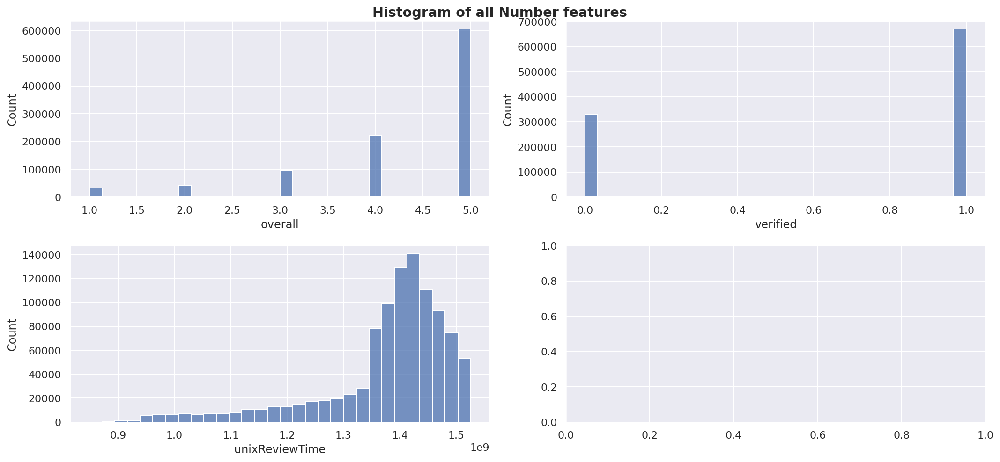

In [ ]:
ax = mulitple_function_plots(data=raw_data.loc[:,['overall','verified' , 'unixReviewTime']], kde_type= False , plot_type="histogram",data_type="number", fig_size=(15,7))

We can see there are a lot of scores are 5. That is not a good thing.

We may need to use stratified sampling later.

Those features will be plotted in  2  rows and  2 columns
Index(['overall', 'verified', 'unixReviewTime'], dtype='object')
1 . Finish Rendering : overall , used 1 millseconds
2 . Finish Rendering : verified , used 3 millseconds
3 . Finish Rendering : unixReviewTime , used 7 millseconds


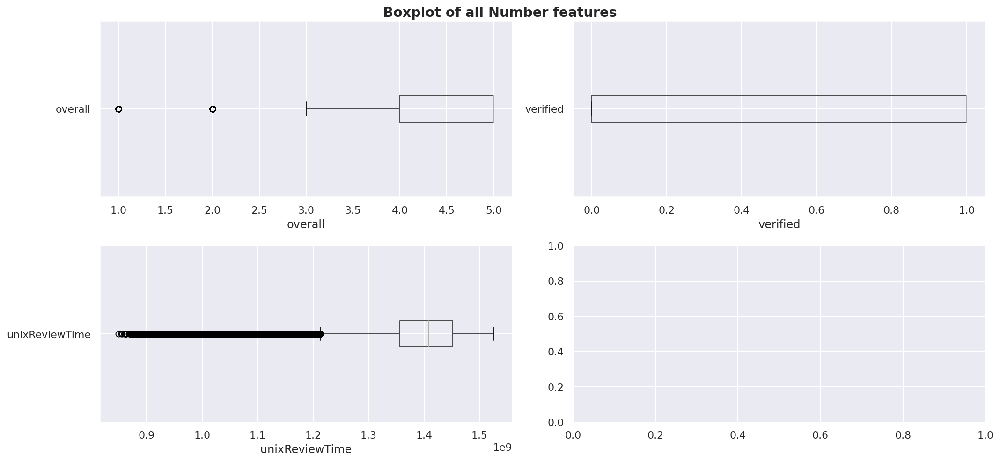

In [ ]:
ax = mulitple_function_plots(data=raw_data.loc[:,['overall','verified' , 'unixReviewTime']], kde_type= False , plot_type="boxplot",data_type="number", fig_size=(15,7))

Outliers in unixReviewTime could just be very old reviews. It doesn't matter too much.

There are a few outliers in overall. We need to investigate it further.

### 1.1.2 Text item properties
we will substitute the actual text items with their
properties such as:
1. Text length (i.e., the number of characters).
2. The number of words.
3. Presence of non-alphanumeric characters

---
4. Any additional properties that you find useful in understanding text.

  Here we use a property called:

  ***Stop words count.***
  We want to calculate how many stop words it has in every instance.

In [ ]:
raw_data.head()

,overall,verified,reviewTime,reviewerID,asin,style,reviewerName,reviewText,summary,unixReviewTime,vote,image
0,2,False,"12 4, 2015",A273QRPDN6IQC8,0446676101,{'Format:': ' Kindle Edition'},Rub Chicken,Book starts out with some really interesting i...,... with some really interesting ideas and get...,1449187200,NaN,<NA>
1,5,True,"04 24, 2016",A31Q39MDPVBTSX,0451473019,{'Format:': ' Hardcover'},BluegrassAnne,was a gift for someone. he loved it,he loved,1461456000,NaN,<NA>
2,4,True,"10 30, 2014",A353XVWAOOUCQS,0385352107,{'Format:': ' Kindle Edition'},Reader in the Pacific,I have read a number of Murakami novels and th...,Hollow Man,1414627200,NaN,<NA>
3,5,True,"10 9, 2013",A1DPPR0FYZ8B4A,042525609X,{'Format:': ' Paperback'},Wonder Woman,This book is a stand alone read as some have m...,Letting go of demons...to embrace deserved love.,1381276800,NaN,<NA>
4,5,False,"08 15, 2015",A2XS90TMQ26YYH,0399146695,{'Format:': ' Kindle Edition'},J. Williams,Great story! Highly recommended!,Five Stars,1439596800,NaN,<NA>


A function that get those 4 information from the original dataset.

First we get the data of nltk to get our stop words.

In [ ]:
import nltk
# download the basic list of data and models
nltk.download('popular')

# download "book" collection of datasets from NLTK website
nltk.download("book")

[nltk_data] Downloading collection 'popular'
[nltk_data]    | 
[nltk_data]    | Downloading package cmudict to /root/nltk_data...
[nltk_data]    |   Package cmudict is already up-to-date!
[nltk_data]    | Downloading package gazetteers to /root/nltk_data...
[nltk_data]    |   Package gazetteers is already up-to-date!
[nltk_data]    | Downloading package genesis to /root/nltk_data...
[nltk_data]    |   Package genesis is already up-to-date!
[nltk_data]    | Downloading package gutenberg to /root/nltk_data...
[nltk_data]    |   Package gutenberg is already up-to-date!
[nltk_data]    | Downloading package inaugural to /root/nltk_data...
[nltk_data]    |   Package inaugural is already up-to-date!
[nltk_data]    | Downloading package movie_reviews to
[nltk_data]    |     /root/nltk_data...
[nltk_data]    |   Package movie_reviews is already up-to-date!
[nltk_data]    | Downloading package names to /root/nltk_data...
[nltk_data]    |   Package names is already up-to-date!
[nltk_data]    | Do

True

In [ ]:
from nltk.book import *
from nltk.corpus import stopwords    
stop_words = set(stopwords.words('english'))

*** Introductory Examples for the NLTK Book ***
Loading text1, ..., text9 and sent1, ..., sent9
Type the name of the text or sentence to view it.
Type: 'texts()' or 'sents()' to list the materials.
text1: Moby Dick by Herman Melville 1851
text2: Sense and Sensibility by Jane Austen 1811
text3: The Book of Genesis
text4: Inaugural Address Corpus
text5: Chat Corpus
text6: Monty Python and the Holy Grail
text7: Wall Street Journal
text8: Personals Corpus
text9: The Man Who Was Thursday by G . K . Chesterton 1908


A function to get the reports.

This function will show:

1. Text length (i.e., the number of characters).
2. The number of words.
3. Presence of non-alphanumeric characters
4. Stop words accounts

In [ ]:
#--------------text_item_properties---------------#
'''We want to save all the results to a new dataframe'''
def text_item_properties(data):
  result = pd.DataFrame()
  data = data.copy()
  # we just fill na with 0 here. Without doing so, there will be an error
  data = data.fillna('0')
  for i in range(len(data.columns)):
    # get character length
    result[str(str(data.columns[i])) + 'Text_length'] = data[str(data.columns[i])].str.len() 
    # get number of words
    result[str(str(data.columns[i])) + 'num_of_words'] = data[str(data.columns[i])].str.split().str.len()
    # get non alphanumeric number
    result[str(str(data.columns[i])) + 'presence_non_alphanumeric'] = data[str(data.columns[i])].str.replace('[a-zA-Z0-9 ]', '').str.len()
    # get stop words account
    result[str(str(data.columns[i])) + 'stop_words_count'] = data[str(data.columns[i])].str.split().apply(lambda x: len(set(x) & stop_words)) 
  return result 

***We will follow the importance of those text items columns.***

First we take a look at review ID.
#### ***1. Reviewer ID***

Use our function we defined before on single column, ReviewID

In [ ]:
reports_reviewerID = text_item_properties( raw_data.loc[:, ['reviewerID']]) ;

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: FutureWarning: The default value of regex will change from True to False in a future version.
  app.launch_new_instance()


Save the results into pkls

In [ ]:
# dump it into pkls
joblib.dump(reports_reviewerID, 'reports_reviewerID.pkl')

['reports_reviewerID.pkl']

Our reports head:

In [ ]:
reports_reviewerID.head()

,reviewerID_Text_length,reviewerID_num_of_words,reviewerID_presence_non_alphanumeric,reviewerID_stop_words_count
0,14,1,0,0
1,14,1,0,0
2,14,1,0,0
3,14,1,0,0
4,14,1,0,0


Now, let's print the continous report for those 4 properties the ReviewID feature has.

In [ ]:
build_continuous_features_report(reports_reviewerID)

,Count,Miss %,Card.,Min,1st Qrt.,Mean,Median,3rd Qrt,Max,Std. Dev.
reviewerID_Text_length,1000000,0.0,7,10,13.0,13.739826,14.0,14.0,20,0.463057
reviewerID_num_of_words,1000000,0.0,1,1,1.0,1.000000,1.0,1.0,1,0.000000
reviewerID_presence_non_alphanumeric,1000000,0.0,1,0,0.0,0.000000,0.0,0.0,0,0.000000
reviewerID_stop_words_count,1000000,0.0,1,0,0.0,0.000000,0.0,0.0,0,0.000000


I already generate the plot function in As1 and As2.

Hence, we don't write the function anymore, I put it in the Utility Function block.

 Now,we just use it.

##### 1. Historgram Plot

Those features will be plotted in  2  rows and  2 columns
Index(['reviewerID_Text_length', 'reviewerID_num_of_words',
       'reviewerID_presence_non_alphanumeric', 'reviewerID_stop_words_count'],
      dtype='object')
1 . Finish Rendering : reviewerID_Text_length , used 0 millseconds
2 . Finish Rendering : reviewerID_num_of_words , used 0 millseconds
3 . Finish Rendering : reviewerID_presence_non_alphanumeric , used 0 millseconds
4 . Finish Rendering : reviewerID_stop_words_count , used 0 millseconds


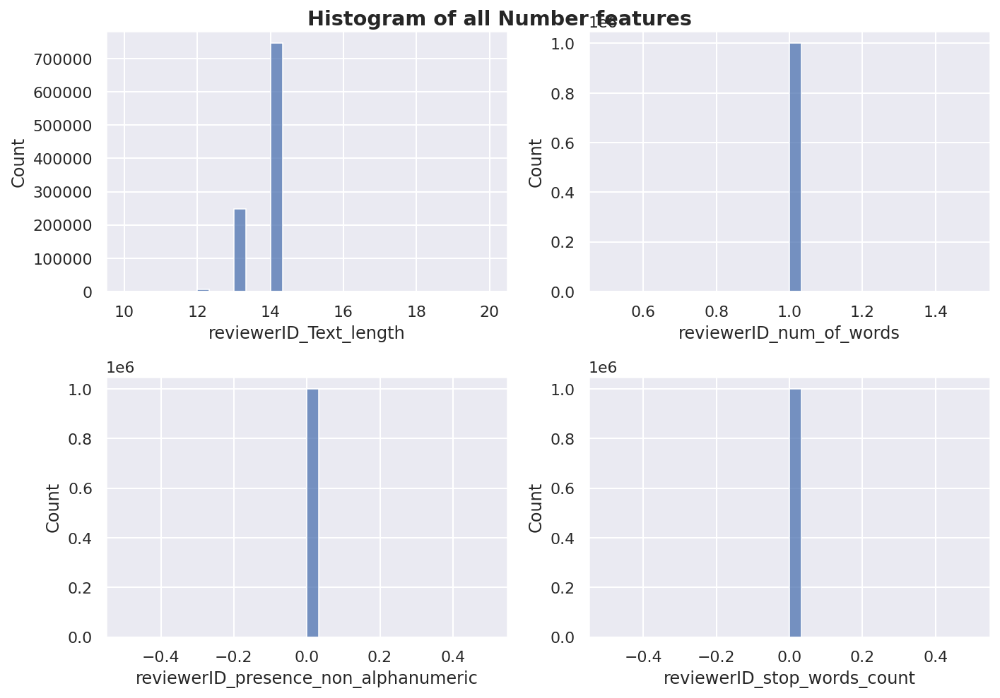

In [ ]:
ax = mulitple_function_plots(data=reports_reviewerID,kde_type = False, plot_type="histogram",data_type="number", fig_size=(10,7))

1. The cardinality of reviewID's number of Charaters are varied.
2. Only 1 word in every instance.
2. here is no non-alphanumeric instances.
3. No stop words.

##### 2. Boxplot

Those features will be plotted in  2  rows and  2 columns
Index(['reviewerID_Text_length', 'reviewerID_num_of_words',
       'reviewerID_presence_non_alphanumeric', 'reviewerID_stop_words_count'],
      dtype='object')
1 . Finish Rendering : reviewerID_Text_length , used 0 millseconds
2 . Finish Rendering : reviewerID_num_of_words , used 1 millseconds
3 . Finish Rendering : reviewerID_presence_non_alphanumeric , used 2 millseconds
4 . Finish Rendering : reviewerID_stop_words_count , used 2 millseconds


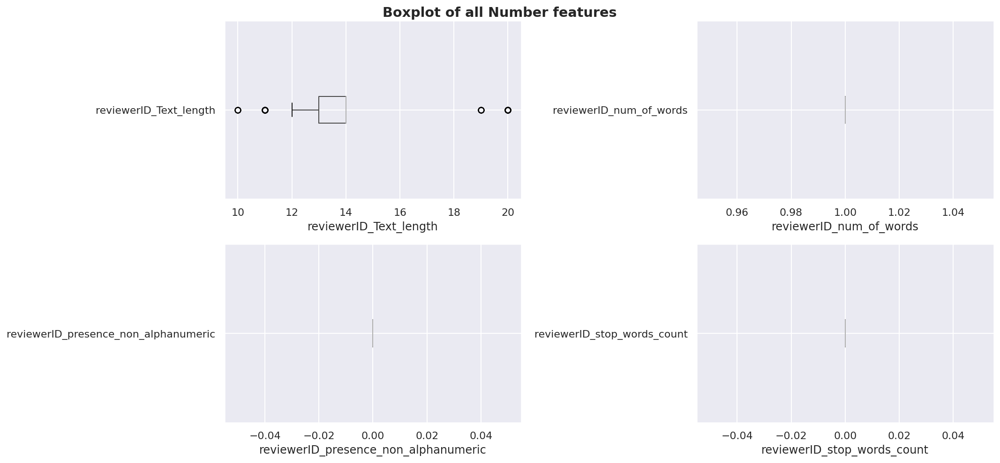

In [ ]:
ax = mulitple_function_plots(data=reports_reviewerID,plot_type="boxplot",data_type="number", fig_size=(15,7))

We can see we actually have outliers in Text length.

The reviewID is varied. That could be a problem. But if we don't need this feature, then it's fine.

#### ***2. summary***
Now, we take a look at summary.

In [ ]:
reports_summary = text_item_properties(raw_data.loc[:, ['summary']]) 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: FutureWarning: The default value of regex will change from True to False in a future version.
  app.launch_new_instance()


In [ ]:
# dump it into pkls
joblib.dump(reports_summary, 'reports_summary.pkl')

['reports_summary.pkl']

In [ ]:
build_continuous_features_report(reports_summary)

,Count,Miss %,Card.,Min,1st Qrt.,Mean,Median,3rd Qrt,Max,Std. Dev.
summary_Text_length,1000000,0.0,214,1,10.0,25.559311,19.0,34.0,799,19.256370
summary_num_of_words,1000000,0.0,58,0,2.0,4.562731,3.0,6.0,149,3.537520
summary_presence_non_alphanumeric,1000000,0.0,79,0,1.0,4.398029,3.0,6.0,164,4.381444
summary_stop_words_count,1000000,0.0,23,0,0.0,1.044313,0.0,2.0,30,1.576715


Standard deviation of summary text is a little bit high. It's more than 19.26.
People may write a very varied length of summarys.

##### 1. Histogram Plot

Those features will be plotted in  2  rows and  2 columns
Index(['summary_Text_length', 'summary_num_of_words',
       'summary_presence_non_alphanumeric', 'summary_stop_words_count'],
      dtype='object')
1 . Finish Rendering : summary_Text_length , used 0 millseconds
2 . Finish Rendering : summary_num_of_words , used 0 millseconds
3 . Finish Rendering : summary_presence_non_alphanumeric , used 0 millseconds
4 . Finish Rendering : summary_stop_words_count , used 0 millseconds


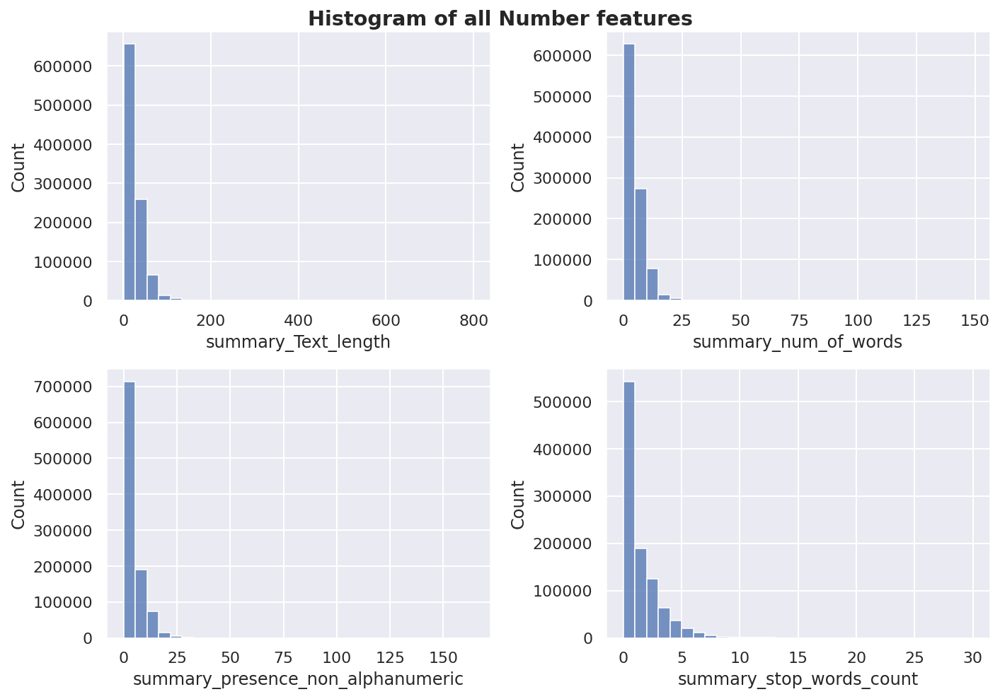

In [ ]:
ax = mulitple_function_plots(data=reports_summary,kde_type = False, plot_type="histogram",data_type="number", fig_size=(10,7))

They are Poisson distribution of all features.

The distribution is fair enough.

##### 2. Boxplot

Those features will be plotted in  2  rows and  2 columns
Index(['summary_Text_length', 'summary_num_of_words',
       'summary_presence_non_alphanumeric', 'summary_stop_words_count'],
      dtype='object')
1 . Finish Rendering : summary_Text_length , used 0 millseconds
2 . Finish Rendering : summary_num_of_words , used 1 millseconds
3 . Finish Rendering : summary_presence_non_alphanumeric , used 2 millseconds
4 . Finish Rendering : summary_stop_words_count , used 3 millseconds


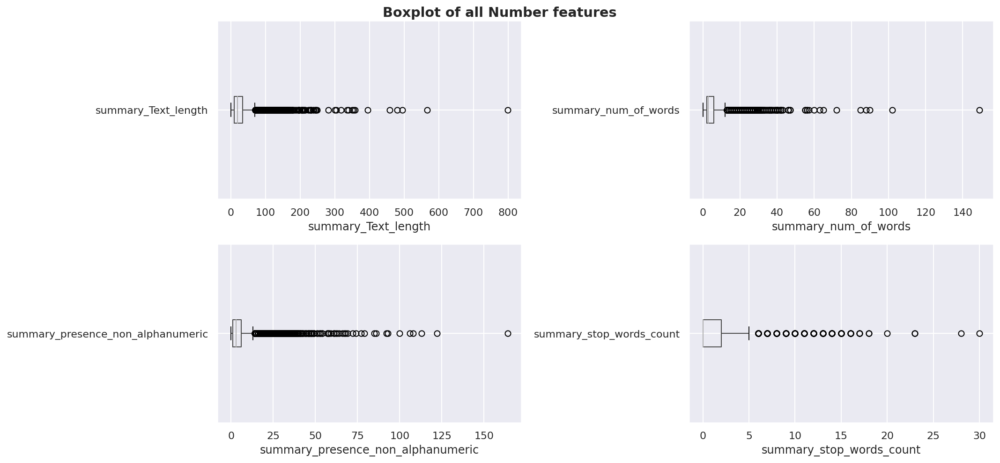

In [ ]:
ax = mulitple_function_plots(data=reports_summary,plot_type="boxplot",data_type="number", fig_size=(15,7))

There are a lot of outliers in those 4 features.

People do write their summary in varied.

But we would say that most of people's summary only has a few words.

In summary, most of them are 
1. Text_length less than 100
2. Num of words less than 10
3. Non-alphanumeric less than 15
4. Stop words count less than 5

#### ***3. reviewText***

Review Text will be our main feature.
It has a lot of words in it, and we will based on this feature to predict our overall scores.

Let's take a look of its report.

In [ ]:
reports_reviewText = text_item_properties( raw_data.loc[:, ['reviewText']]);

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: FutureWarning: The default value of regex will change from True to False in a future version.
  app.launch_new_instance()


In [ ]:
# dump it into pkls
joblib.dump(reports_reviewText, 'reports_reviewText.pkl')

['reports_reviewText.pkl']

In [ ]:
build_continuous_features_report(reports_reviewText)

,Count,Miss %,Card.,Min,1st Qrt.,Mean,Median,3rd Qrt,Max,Std. Dev.
reviewText_Text_length,1000000,0.0,7981,1,112.0,563.448763,221.0,626.0,32675,906.886441
reviewText_num_of_words,1000000,0.0,1980,0,21.0,99.983910,41.0,113.0,5853,156.915644
reviewText_presence_non_alphanumeric,1000000,0.0,2294,0,24.0,117.892685,47.0,132.0,7556,187.985523
reviewText_stop_words_count,1000000,0.0,117,0,6.0,18.044168,12.0,26.0,121,16.694456


Standard deviation is very high in reviewText, we need to investigate this further more.

##### 1. Histogram Plot

Those features will be plotted in  2  rows and  2 columns
Index(['reviewText_Text_length', 'reviewText_num_of_words',
       'reviewText_presence_non_alphanumeric', 'reviewText_stop_words_count'],
      dtype='object')
1 . Finish Rendering : reviewText_Text_length , used 0 millseconds
2 . Finish Rendering : reviewText_num_of_words , used 0 millseconds
3 . Finish Rendering : reviewText_presence_non_alphanumeric , used 0 millseconds
4 . Finish Rendering : reviewText_stop_words_count , used 1 millseconds


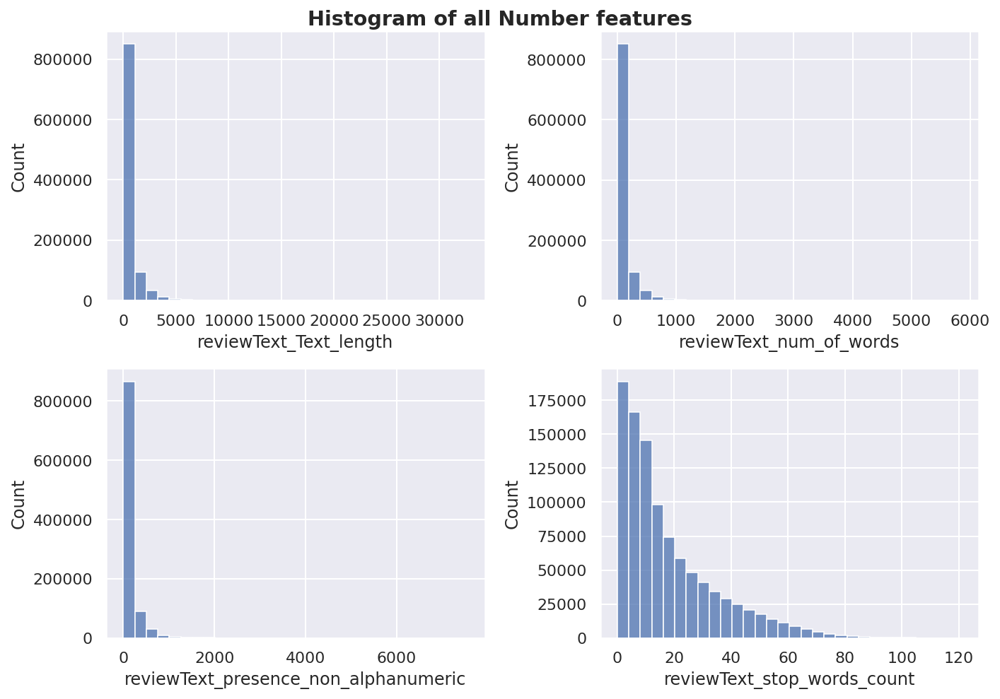

In [ ]:
ax = mulitple_function_plots(data=reports_reviewText,kde_type= False, plot_type="histogram",data_type="number", fig_size=(10,7))

We have a lots of text length near to 0 and number of words near to 0. This is not a good sign. We will investigate those further.

##### 2. Boxplot

Those features will be plotted in  2  rows and  2 columns
Index(['reviewText_Text_length', 'reviewText_num_of_words',
       'reviewText_presence_non_alphanumeric', 'reviewText_stop_words_count'],
      dtype='object')
1 . Finish Rendering : reviewText_Text_length , used 1 millseconds
2 . Finish Rendering : reviewText_num_of_words , used 2 millseconds
3 . Finish Rendering : reviewText_presence_non_alphanumeric , used 4 millseconds
4 . Finish Rendering : reviewText_stop_words_count , used 5 millseconds


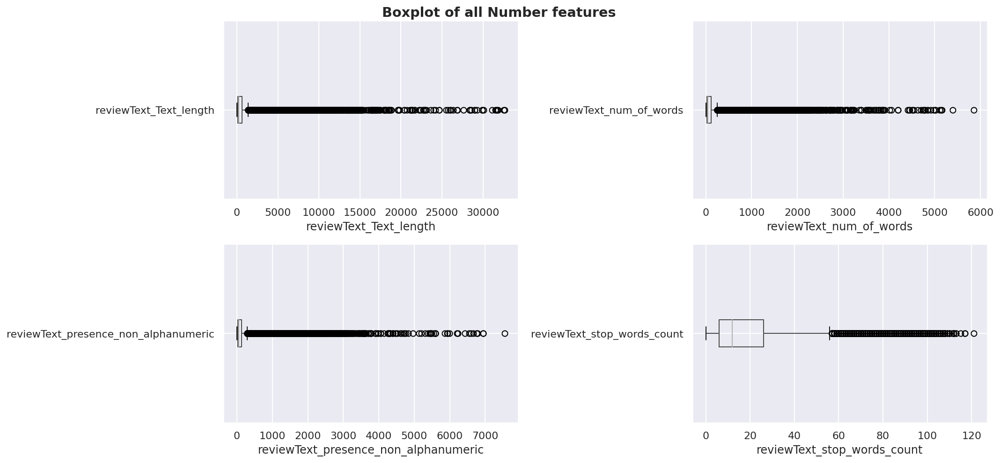

In [ ]:
ax = mulitple_function_plots(data=reports_reviewText, kde_type= False , plot_type="boxplot",data_type="number", fig_size=(15,7))

There is an instance that has 5800 number of words. That is a huge number of words.

And there are huge scale of outliers in the first three features.

We must investigate those in the next chapter.

#### ***4. style***

In [ ]:
reports_style = text_item_properties( raw_data.loc[:, ['style']]) 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: FutureWarning: The default value of regex will change from True to False in a future version.
  app.launch_new_instance()


In [ ]:
# dump it into pkls
joblib.dump(reports_style, 'reports_style.pkl')

['reports_style.pkl']

In [ ]:
build_continuous_features_report(reports_style)

,Count,Miss %,Card.,Min,1st Qrt.,Mean,Median,3rd Qrt,Max,Std. Dev.
style_Text_length,1000000,0.00,22,1,25.00,28.49,30.00,30.00,47,4.19
style_num_of_words,1000000,0.00,5,1,3.00,3.69,4.00,4.00,6,0.67
style_presence_non_alphanumeric,1000000,0.00,7,0,10.00,10.65,11.00,11.00,15,1.02
style_stop_words_count,1000000,0.00,2,0,0.00,0.00,0.00,0.00,1,0.02


Our report shows style feature has relatively similar properties among all 4 perporties we list here.

##### 1. Historgram Plot

Those features will be plotted in  2  rows and  2 columns
Index(['style_Text_length', 'style_num_of_words',
       'style_presence_non_alphanumeric', 'style_stop_words_count'],
      dtype='object')
1 . Finish Rendering : style_Text_length , used 0 millseconds
2 . Finish Rendering : style_num_of_words , used 0 millseconds
3 . Finish Rendering : style_presence_non_alphanumeric , used 0 millseconds
4 . Finish Rendering : style_stop_words_count , used 0 millseconds


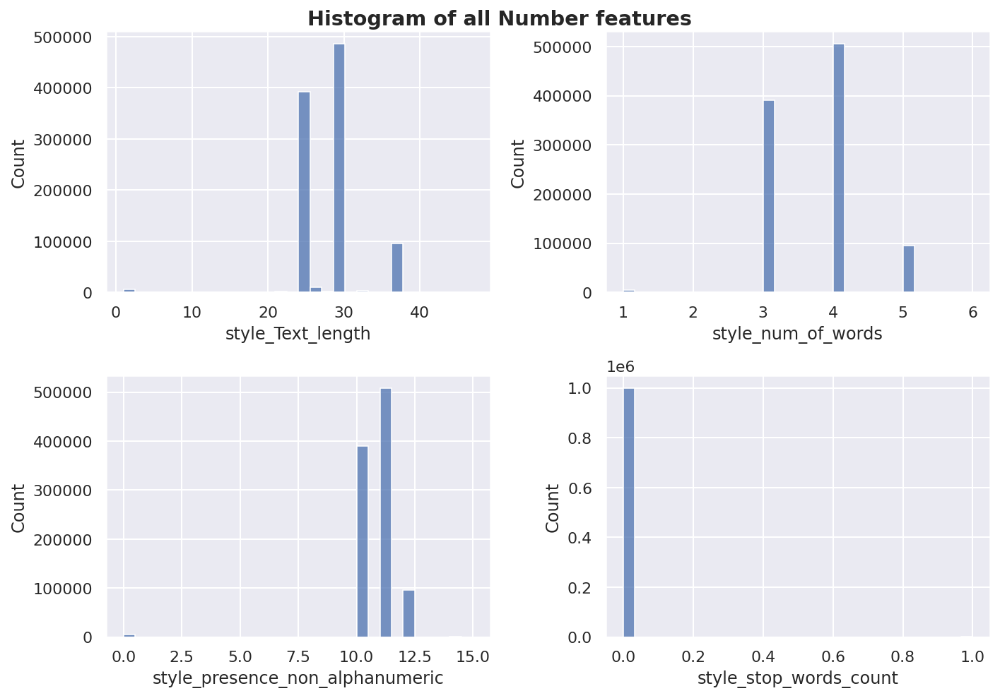

In [ ]:
ax = mulitple_function_plots(data=reports_style,kde_type = False, plot_type="histogram",data_type="number", fig_size=(10,7))

We can see very high non - alphanumeric characters. We need to delete those.
And the num of words are varied. 

And we have no stop words in this feature.

##### 2. Boxplot

Those features will be plotted in  2  rows and  2 columns
Index(['summary_Text_length', 'summary_num_of_words',
       'summary_presence_non_alphanumeric', 'summary_stop_words_count'],
      dtype='object')
1 . Finish Rendering : summary_Text_length , used 0 millseconds
2 . Finish Rendering : summary_num_of_words , used 1 millseconds
3 . Finish Rendering : summary_presence_non_alphanumeric , used 2 millseconds
4 . Finish Rendering : summary_stop_words_count , used 3 millseconds


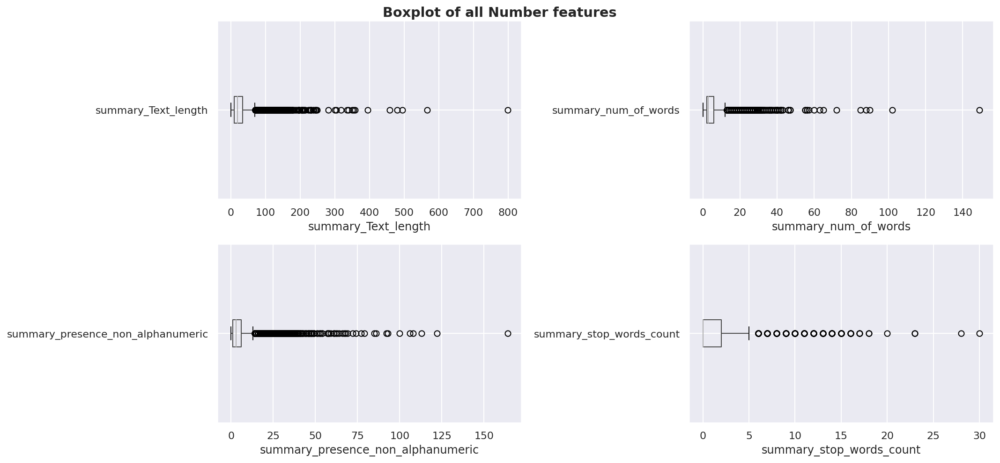

In [ ]:
ax = mulitple_function_plots(data=reports_summary,plot_type="boxplot",data_type="number", fig_size=(15,7))

We can see that there are a lot of non alphanumeric outliers here.

And a few outliers of number of words. 

We will investigate it in the next chapter.

#### ***5. Reviewer Name***

In [ ]:
reports_reviewerName = text_item_properties( raw_data.loc[:, ['reviewerName']]) 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: FutureWarning: The default value of regex will change from True to False in a future version.
  app.launch_new_instance()


In [ ]:
# dump it into pkls
joblib.dump(reports_reviewerName, 'reports_reviewerName.pkl')

['reports_reviewerName.pkl']

In [ ]:
build_continuous_features_report(reports_reviewerName)

,Count,Miss %,Card.,Min,1st Qrt.,Mean,Median,3rd Qrt,Max,Std. Dev.
reviewerName_Text_length,1000000,0.00,125,1,7.00,11.15,11.00,15.00,326,5.46
reviewerName_num_of_words,1000000,0.00,27,0,1.00,1.85,2.00,2.00,27,0.84
reviewerName_presence_non_alphanumeric,1000000,0.00,44,0,0.00,1.13,1.00,2.00,109,1.35
reviewerName_stop_words_count,1000000,0.00,11,0,0.00,0.02,0.00,0.00,10,0.18


Similar type of features as same as style.

There is no much variation here.

##### 1. Historgram Plot

Those features will be plotted in  2  rows and  2 columns
Index(['reviewerID_Text_length', 'reviewerID_num_of_words',
       'reviewerID_presence_non_alphanumeric', 'reviewerID_stop_words_count'],
      dtype='object')
1 . Finish Rendering : reviewerID_Text_length , used 0 millseconds
2 . Finish Rendering : reviewerID_num_of_words , used 0 millseconds
3 . Finish Rendering : reviewerID_presence_non_alphanumeric , used 0 millseconds
4 . Finish Rendering : reviewerID_stop_words_count , used 0 millseconds


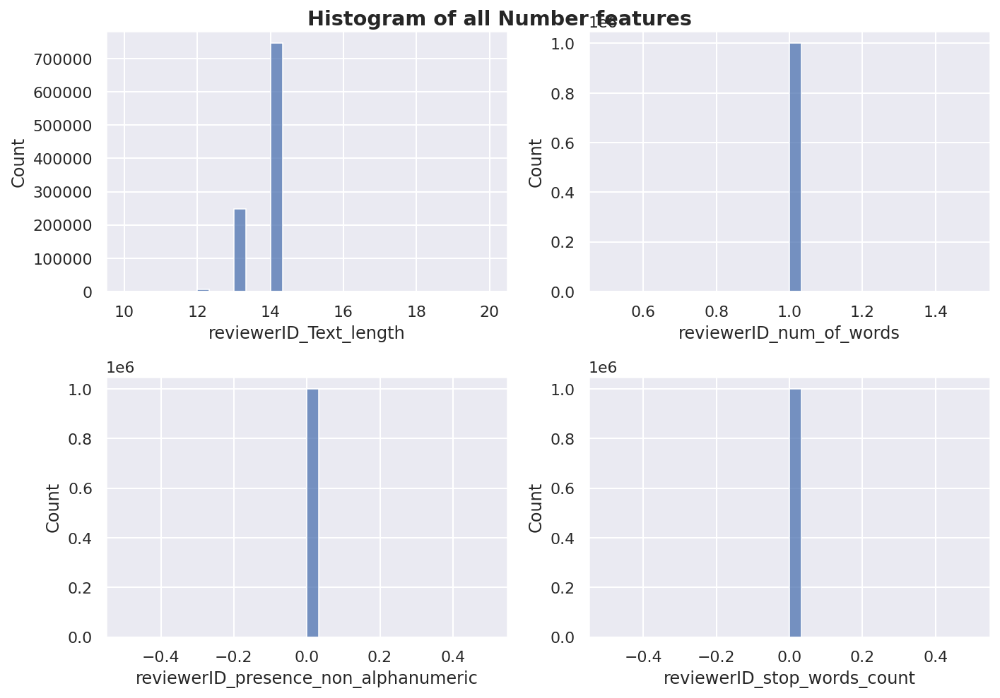

In [ ]:
ax = mulitple_function_plots(data=reports_reviewerID,kde_type = False, plot_type="histogram",data_type="number", fig_size=(10,7))

No non alphanumerica characters.

No stop words.

All instances has one word.

We may drop this feature. Since not too much helping for distinguishing our scores.

##### 2. Boxplot

Those features will be plotted in  2  rows and  2 columns
Index(['reviewerID_Text_length', 'reviewerID_num_of_words',
       'reviewerID_presence_non_alphanumeric', 'reviewerID_stop_words_count'],
      dtype='object')
1 . Finish Rendering : reviewerID_Text_length , used 1 millseconds
2 . Finish Rendering : reviewerID_num_of_words , used 1 millseconds
3 . Finish Rendering : reviewerID_presence_non_alphanumeric , used 2 millseconds
4 . Finish Rendering : reviewerID_stop_words_count , used 3 millseconds


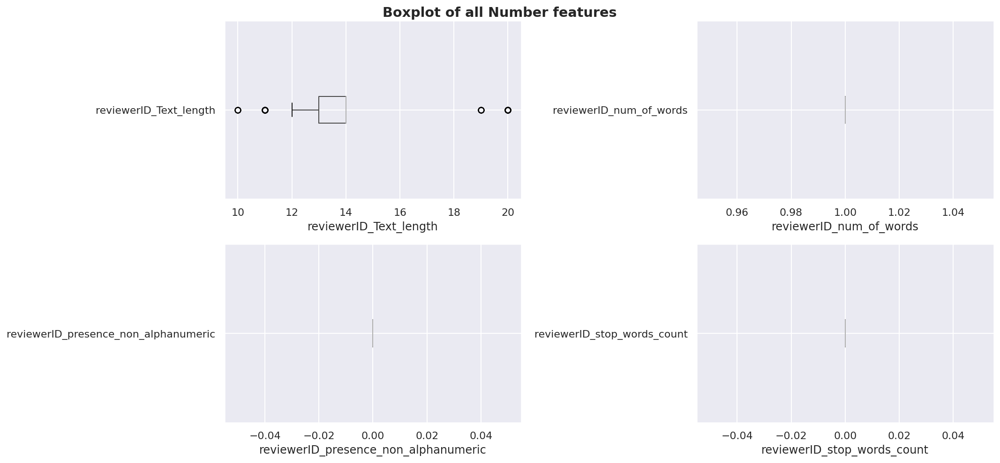

In [ ]:
ax = mulitple_function_plots(data=reports_reviewerID,plot_type="boxplot",data_type="number", fig_size=(15,7))

Reviewer name is one of the not very important feature.

It doesn't mean too many things. We will drop it in the future.
So no further investigation here.

#### ***6. asin***

In [ ]:
reports_asin = text_item_properties(raw_data.loc[:, ['asin']]) 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: FutureWarning: The default value of regex will change from True to False in a future version.
  app.launch_new_instance()


In [ ]:
# dump it into pkls
joblib.dump(reports_asin, 'reports_asin.pkl')

['reports_asin.pkl']

In [ ]:
build_continuous_features_report(reports_asin)

,Count,Miss %,Card.,Min,1st Qrt.,Mean,Median,3rd Qrt,Max,Std. Dev.
asin_Text_length,1000000,0.00,1,10,10.00,10.00,10.00,10.00,10,0.00
asin_num_of_words,1000000,0.00,1,1,1.00,1.00,1.00,1.00,1,0.00
asin_presence_non_alphanumeric,1000000,0.00,1,0,0.00,0.00,0.00,0.00,0,0.00
asin_stop_words_count,1000000,0.00,1,0,0.00,0.00,0.00,0.00,0,0.00


No Std. Dev at all. Since asin are format number for representing books.

##### 1. Historgram Plot

Those features will be plotted in  2  rows and  2 columns
Index(['reviewerID_Text_length', 'reviewerID_num_of_words',
       'reviewerID_presence_non_alphanumeric', 'reviewerID_stop_words_count'],
      dtype='object')
1 . Finish Rendering : reviewerID_Text_length , used 0 millseconds
2 . Finish Rendering : reviewerID_num_of_words , used 0 millseconds
3 . Finish Rendering : reviewerID_presence_non_alphanumeric , used 0 millseconds
4 . Finish Rendering : reviewerID_stop_words_count , used 0 millseconds


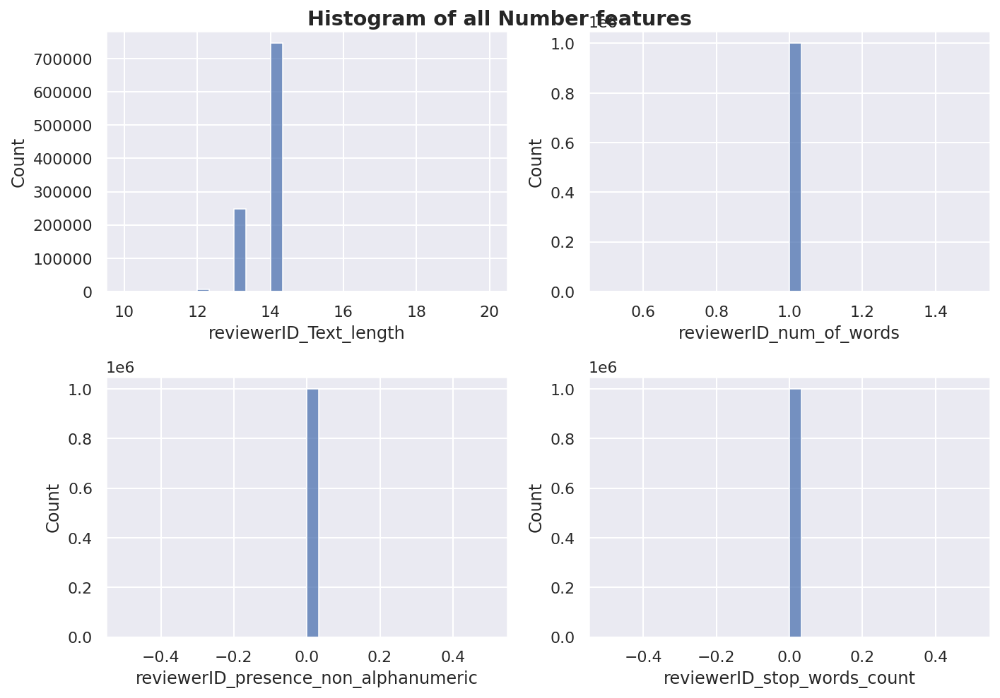

In [ ]:
ax = mulitple_function_plots(data=reports_reviewerID,kde_type = False, plot_type="histogram",data_type="number", fig_size=(10,7))

Same as reviewer Name.

##### 2. Boxplot

Those features will be plotted in  2  rows and  2 columns
Index(['reviewerID_Text_length', 'reviewerID_num_of_words',
       'reviewerID_presence_non_alphanumeric', 'reviewerID_stop_words_count'],
      dtype='object')
1 . Finish Rendering : reviewerID_Text_length , used 0 millseconds
2 . Finish Rendering : reviewerID_num_of_words , used 1 millseconds
3 . Finish Rendering : reviewerID_presence_non_alphanumeric , used 2 millseconds
4 . Finish Rendering : reviewerID_stop_words_count , used 2 millseconds


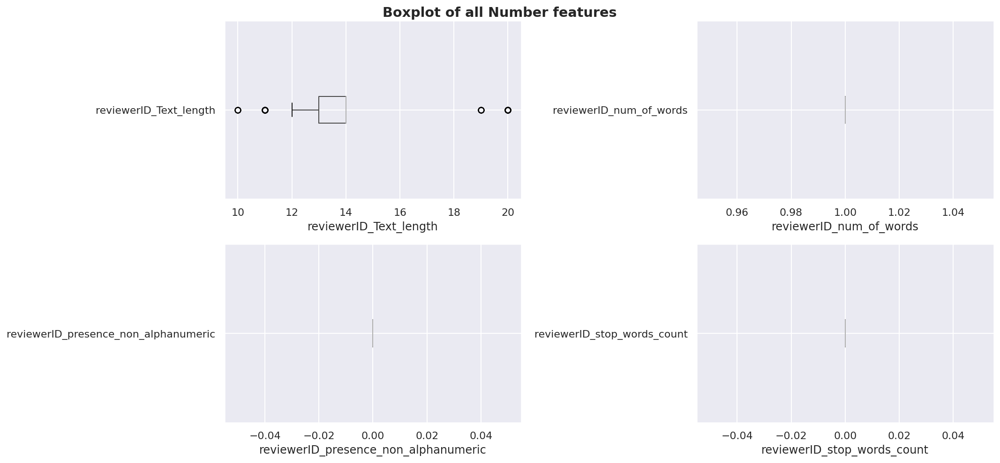

In [ ]:
ax = mulitple_function_plots(data=reports_reviewerID,plot_type="boxplot",data_type="number", fig_size=(15,7))

ASIN is actually a number for identifying the book names.

Well, it's good to get the book name. But most of API to do so cost many.

And way beyond the purpose of our course.

Hence, we don't take further investigation on it.

## 1.2. Identify data quality issues and build the data quality plan.

First we take another look at the most important feature, review text and summary.


### 1.2.1 Identify Major Data quality issues

#### 1. Review Text

Those features will be plotted in  2  rows and  2 columns
Index(['reviewText_Text_length', 'reviewText_num_of_words',
       'reviewText_presence_non_alphanumeric', 'reviewText_stop_words_count'],
      dtype='object')
1 . Finish Rendering : reviewText_Text_length , used 0 millseconds
2 . Finish Rendering : reviewText_num_of_words , used 0 millseconds
3 . Finish Rendering : reviewText_presence_non_alphanumeric , used 1 millseconds
4 . Finish Rendering : reviewText_stop_words_count , used 1 millseconds


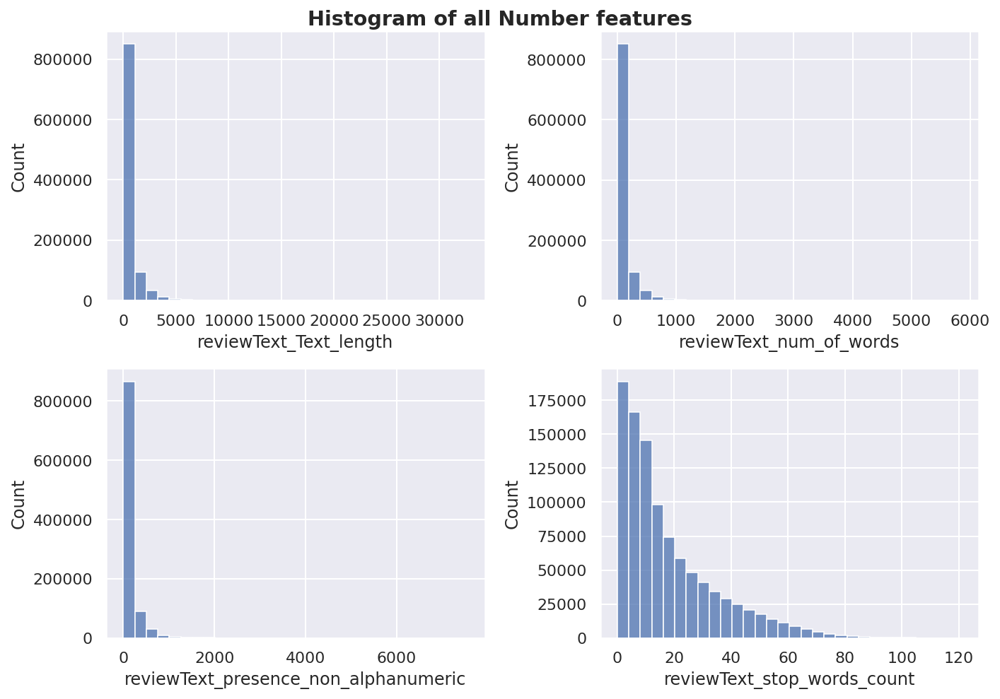

In [ ]:
ax = mulitple_function_plots(data=reports_reviewText,kde_type= False, plot_type="histogram",data_type="number", fig_size=(10,7))

Those features will be plotted in  2  rows and  2 columns
Index(['reviewText_Text_length', 'reviewText_num_of_words',
       'reviewText_presence_non_alphanumeric', 'reviewText_stop_words_count'],
      dtype='object')
1 . Finish Rendering : reviewText_Text_length , used 2 millseconds
2 . Finish Rendering : reviewText_num_of_words , used 5 millseconds
3 . Finish Rendering : reviewText_presence_non_alphanumeric , used 6 millseconds
4 . Finish Rendering : reviewText_stop_words_count , used 8 millseconds


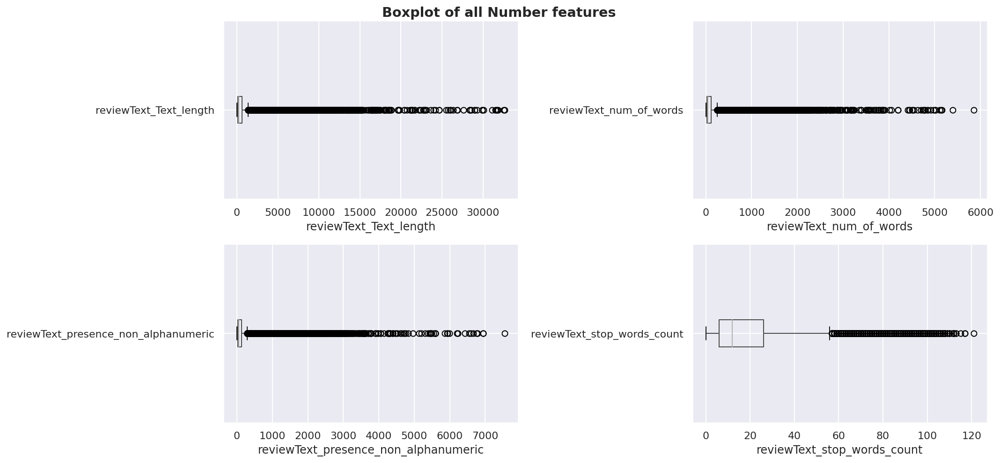

In [ ]:
ax = mulitple_function_plots(data=reports_reviewText, kde_type= False , plot_type="boxplot",data_type="number", fig_size=(15,7))

We can see there are a lot of outliers in all our 4 text items' properties.

That is not good.

We need to investigate further about this outliers.

##### ***1. Outliers investigation***

First we take a look at the instances with the most number of words in review Text.

In [ ]:
reports_reviewText[reports_reviewText['reviewText_num_of_words'] > 5800]

,reviewText_Text_length,reviewText_num_of_words,reviewText_presence_non_alphanumeric,reviewText_stop_words_count
470862,32675,5853,7556,108


We get the item by use .index

In [ ]:
raw_data.loc[reports_reviewText[reports_reviewText['reviewText_num_of_words'] > 5800].index].T

,470862
overall,2
verified,False
reviewTime,"07 27, 2012"
reviewerID,A3NZBAGW4AKU5E
asin,0385474466
style,{'Format:': ' Paperback'}
reviewerName,R. Cannata
reviewText,Posner attempts a thorough refutation of all e...
summary,Definitive anti-conspiracy work is informative...
unixReviewTime,1343347200


We save it into a new data structure and see what's inside.

In [ ]:
outlier_example = raw_data.loc[reports_reviewText[reports_reviewText['reviewText_num_of_words'] > 5800].head(1).index]

In [ ]:
max_print_out(True)
outlier_example.reviewText.values

<StringArray>
['Posner attempts a thorough refutation of all explanations of the JFK assassination that deviate in any way from the official (Warren Commission of 1964) one: Oswald was the only person involved in the assassination, and Ruby was the only one involved in killing Oswald.  The conspiracy theorists will also be called "the critics" below.  Some of the conspiracy people\'s (critics\') views are supported by the report of the U.S. House Select Committee on Assassinations (1979), a Congressional study.\n\nBelow are just a few notes of random things that interested me from Posner.  These notes do NOT constitute a summary of the book, but just some impressions.\n\nIn general, Posner tends to be needlessly wordy at points, but is basically a very good writer, discipled thinker and well-organized.  He is moderate in tone, though he tends to concede nothing and is clever in obscuring facts that are inconvenient to his main thesis.\n\nIf Oswald was a committed Marxist by 9th grade a

Well, by searching this instance's ASIN. We got this is a book called 

***Case Closed: Lee Harvey Oswald and the Assassination of JFK***

It seems like that this review Text is a part from the book, instead of a real review from customers. We don't want that.

Hence, we can set a threshold to get the instances with reasonbale number of words. In case we get something like this, which is not a review at all.

Now, we reuse our find outliers function in Assignment 1 to find out how many outliers are there.

In [ ]:
find_outliers(reports_reviewText, 'reviewText_num_of_words')

IQR = 113.0 - 21.0 = 92.0
MAX = 251.0
Min is 0
Num of min outliers:  0
Num of max outliers:  64716
Num of negative outliers:  1
Num of the original data set's whole instance 1000000
Rate of purged data/total data 0.064716


Let's take a look at what the review Text like with 300 words.

In [ ]:
reports_reviewText[reports_reviewText['reviewText_num_of_words'] > 300].head(1)

,reviewText_Text_length,reviewText_num_of_words,reviewText_presence_non_alphanumeric,reviewText_stop_words_count
3,1807,318,356,44


In [ ]:
max_print_out(True)
outlier_example = raw_data.loc[reports_reviewText[reports_reviewText['reviewText_num_of_words'] > 300].head(1).index]
outlier_example.reviewText.values

<StringArray>
["This book is a stand alone read as some have mentioned in their reviews. To really understand the whole dynamic behind the characters; you should really read the other books in the series.  I wondered how Dane was going to tell Raven' s story because there was just such a strong energy bouncing off Raven. Her feelings were raw in the Brown Felt books and the Dinner Party Girls. I felt like Lauren really needed to get into Raven's Psyche and give Raven's voice as well as her emotions a chance.\nLauren did it.  She wrote Raven as the edgy bitch some of us had become curios about.  Raven had been independent and alone for the majority of  her life. Letting people in her life felt wrong and placed her in a very vulnerable position.  She had never felt LOVED and cherished until she started a relationship with her bosses sister. Erin befriended Raven immediately and it was the relationship that began preparing Raven for the real deal, Jonah Warner. Jonah Warner, Levi' s broth

This is a valid book review. Just very long.

Let's take a look at more word's review.

In [ ]:
max_print_out(True)
outlier_example = raw_data.loc[reports_reviewText[reports_reviewText['reviewText_num_of_words'] > 500].head(1).index]
outlier_example.reviewText.values

<StringArray>
["In The Last Man on Earth by Tracy Anne Warren, Madelyn and Zack are both advertising executives at a big firmwith a lot of rivalry and misunderstandings between them. On the outside, Madelyn cant stand Zack. But on the inside?\n\nMadelyn is not looking to settle. She broke up with her long time sweetheart knowing what she felt for him was not the love she was looking for. She wants a man who turns her inside out, makes her happy and loves her. Definitely not someone like Zack. Zack doesnt have relationships, he is definitely not looking to settle down and live happily ever after. But after some New Years fireworks between Zack and Madelyn, they soon find the chemistry between them impossible to resist. Not wanting to be the subject of office gossips or mix personal with business, they keep their relationship strictly between the two of themescaping for weekends together.\n\nSoon though, in a surprise even to herself, Madelyn finds herself falling harder and harder for Z

When words become more and more, the review text just become more and more make no sence.

We better purge all outliers by the number of words.

***Before we moving furthuer, we need to know if these kind of reviews also exit in our kaggle dataset.***

In [ ]:
kaggle_data = pd.read_json('/content/drive/MyDrive/A3/sample.jsonl', lines=True)
kaggle_data = kaggle_data.convert_dtypes()
kaggle_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000000 entries, 0 to 999999
Data columns (total 12 columns):
 #   Column          Non-Null Count    Dtype  
---  ------          --------------    -----  
 0   overall         1000000 non-null  Int64  
 1   vote            195489 non-null   string 
 2   verified        1000000 non-null  boolean
 3   reviewTime      1000000 non-null  string 
 4   reviewerID      1000000 non-null  string 
 5   asin            1000000 non-null  string 
 6   style           982181 non-null   object 
 7   reviewerName    999966 non-null   string 
 8   reviewText      999876 non-null   string 
 9   summary         999693 non-null   string 
 10  unixReviewTime  1000000 non-null  Int64  
 11  image           2233 non-null     object 
dtypes: Int64(2), boolean(1), object(2), string(7)
memory usage: 87.7+ MB


In [ ]:
kaggle_reports_reviewText = text_item_properties( kaggle_data.loc[:, ['reviewText']]);

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: FutureWarning: The default value of regex will change from True to False in a future version.
  app.launch_new_instance()


In [ ]:
joblib.dump(kaggle_reports_reviewText,'kaggle_reports_reviewText.pkl')

['kaggle_reports_reviewText.pkl']

Those features will be plotted in  2  rows and  2 columns
Index(['reviewText_Text_length', 'reviewText_num_of_words',
       'reviewText_presence_non_alphanumeric', 'reviewText_stop_words_count'],
      dtype='object')
1 . Finish Rendering : reviewText_Text_length , used 1 millseconds
2 . Finish Rendering : reviewText_num_of_words , used 1 millseconds
3 . Finish Rendering : reviewText_presence_non_alphanumeric , used 2 millseconds
4 . Finish Rendering : reviewText_stop_words_count , used 3 millseconds


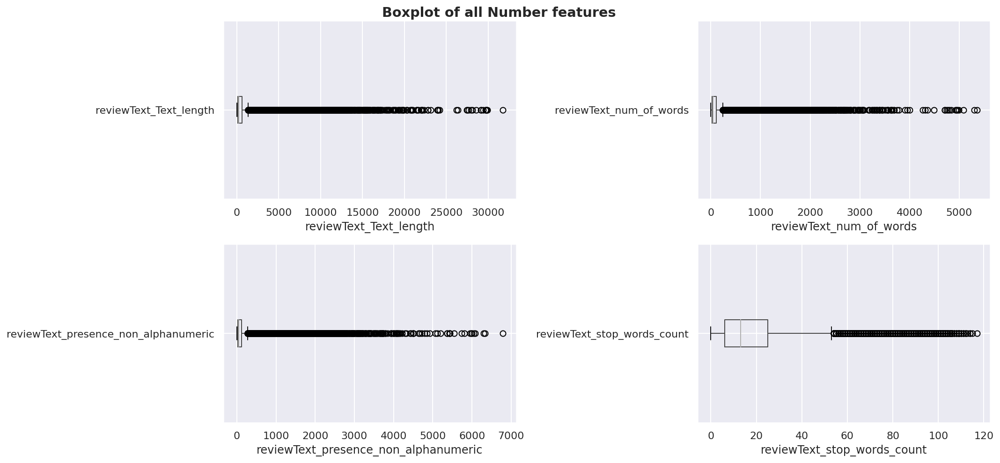

In [ ]:
ax = mulitple_function_plots(data=kaggle_reports_reviewText, kde_type= False , plot_type="boxplot",data_type="number", fig_size=(15,7))

Well, the kaggle data also has the kind of instances with thousands of words.

People are writing reading thoughts on Amazon reviews channel. That is quite interesting.

We will figure out how to handle these later.


> We don't need the kaggle dataset anymore. Delete for free the memory.

In [ ]:
del kaggle_data

There is no way around of these long reviews. 
For me personally, I would not read those long reviews or reading thoughts when I want to buy a book.

Hence, we better purge all of those outliers and see what's left.

Rewrite our find_outliers function to return the purge index.
Since we are operating two different datasets with the same indexing system at a time.


In [ ]:
#-------------find_outliers-----------------
def find_outliers(data_df, parameter,* , drop=False, set_threshold=False, threshold_value = 350): # deal with outliers    
    '''detect and delete outliers '''
    # same with previous find_outliers function
    Q1 = data_df[parameter].quantile(0.25)
    Q3 = data_df[parameter].quantile(0.75)
    IQR = Q3-Q1
    
    print(f"IQR = {Q3} - {Q1} = {IQR}")
    print(f"MAX = {(Q3 + 1.5 * IQR)}")
    
    if Q1 > 1.5*IQR :
        print("Min: ", (Q1 - 1.5 * IQR))
    else:
        print("Min is 0")

    cut_out_value =  (Q3 + 1.5 * IQR) # normal outliers deleted
    # override the value if we set threshold
    if set_threshold == True:
        cut_out_value = threshold_value
    
    # get min outliers' index 
    # get max outliers' index
    min_outliers_df = data_df[(data_df[parameter] < (Q1 - 1.5 * IQR))]
    max_outliers_df = data_df[(data_df[parameter] > cut_out_value)]
    # get negtive outliers' index  
    negative_outliers_df = data_df[(data_df[parameter] <= 0)]         
    print("Num of min outliers: ", len(min_outliers_df))
    print("Num of max outliers: ", len(max_outliers_df))
    print("Num of negative outliers: ", len(negative_outliers_df))
    print("Num of the original data set's whole instance", len(data_df))
    print("Rate of purged data/total data", len(max_outliers_df)/ len(data_df))

    # It's pretty hard to drop multiple indexes at the same time
    # Because after one drop action, their index are changed from then
    # We need to alter the order of aboving codes. 
    # And it's pretty unnecessary for us to do this in our assignemnt
    # Since we don't have min outliers in this dataset
    # And negative values are not outliers
    # I decided to purge negative values in transformer instead of here
    return max_outliers_df.index

In [ ]:
purging_index = find_outliers(reports_reviewText, 'reviewText_num_of_words')

IQR = 113.0 - 21.0 = 92.0
MAX = 251.0
Min is 0
Num of min outliers:  0
Num of max outliers:  108609
Num of negative outliers:  1
Num of the original data set's whole instance 1000000
Rate of purged data/total data 0.108609


Max words is 251.0. And there are 108609 outliers.

Take nearly 10% of whole 1 million set.

Let's take a look at the boxplot of when we purged the outliers.

Those features will be plotted in  2  rows and  2 columns
Index(['reviewText_Text_length', 'reviewText_num_of_words',
       'reviewText_presence_non_alphanumeric', 'reviewText_stop_words_count'],
      dtype='object')
1 . Finish Rendering : reviewText_Text_length , used 0 millseconds
2 . Finish Rendering : reviewText_num_of_words , used 1 millseconds
3 . Finish Rendering : reviewText_presence_non_alphanumeric , used 2 millseconds
4 . Finish Rendering : reviewText_stop_words_count , used 2 millseconds


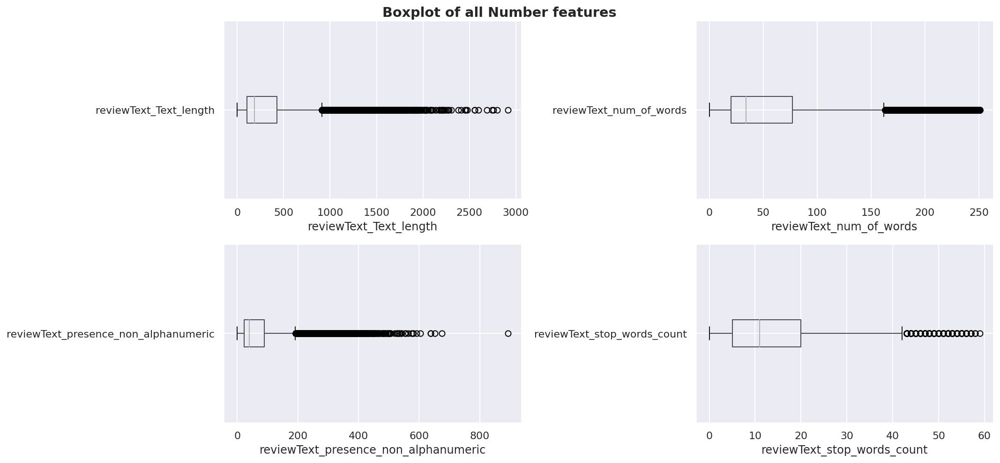

In [ ]:
ax = mulitple_function_plots(data=reports_reviewText.drop(purging_index), kde_type= False , plot_type="boxplot",data_type="number", fig_size=(15,7))

The number of words' feature has been taken care of. 
The review Text length still has very large number of outliers.

We take a look at its outliers on the purged set we just got.

In [ ]:
report_data_purged = reports_reviewText.drop(purging_index)

In [ ]:
# get the first maximum text length instance with our purged dataset.
report_data_purged[report_data_purged['reviewText_Text_length'] > 2700].head(1)

,reviewText_Text_length,reviewText_num_of_words,reviewText_presence_non_alphanumeric,reviewText_stop_words_count
156379,2797,218,652,20


In [ ]:
# print the instance from the raw_data and check if's index are the same.
max_print_out(True)
outlier_example = raw_data.loc[report_data_purged[report_data_purged['reviewText_Text_length'] > 2700].head(1).index]
outlier_example

,overall,verified,reviewTime,reviewerID,asin,style,reviewerName,reviewText,summary,unixReviewTime,vote,image
156379,4,False,"03 14, 2001",A1EI1093WQNLCY,0441005810,{'Format:': ' Paperback'},David Johnson,"H. Beam Piper's Fuzzy novels,&nbsp;<a data-hoo...",How do you know if a fuzzy alien is intelligent?,984528000,8,<NA>


In [ ]:
# get the value of this instance
demo_text = outlier_example.reviewText.values
demo_text

<StringArray>
['H. Beam Piper\'s Fuzzy novels,&nbsp;<a data-hook="product-link-linked" class="a-link-normal" href="/Little-Fuzzy/dp/159818797X/ref=cm_cr_arp_d_rvw_txt?ie=UTF8">Little Fuzzy</a>&nbsp;(first published in 1962),&nbsp;<a data-hook="product-link-linked" class="a-link-normal" href="/Fuzzy-Sapiens/dp/B000EG6BA8/ref=cm_cr_arp_d_rvw_txt?ie=UTF8">Fuzzy Sapiens</a>&nbsp;(originally published as&nbsp;<a data-hook="product-link-linked" class="a-link-normal" href="/The-Other-Human-Race/dp/B000H0O5CC/ref=cm_cr_arp_d_rvw_txt?ie=UTF8">The Other Human Race</a>&nbsp;in 1964), and&nbsp;<a data-hook="product-link-linked" class="a-link-normal" href="/Fuzzies-and-Other-People/dp/B000ENMVTQ/ref=cm_cr_arp_d_rvw_txt?ie=UTF8">Fuzzies and Other People</a>&nbsp;(first published in 1984), are perhaps the best treatment ever of the nature of intelligence in science-fiction.  The three novels deal with the assorted legal and political challenges which occur in the aftermath of the discovery of the Fuz

That is a superise.

There are not too many words here, but there are a lot of HTML codes in this review. We don't want that.

Let's see what we can do.

In [ ]:
import re as re
text = re.sub('<[^<]+?>', '', str(demo_text))
text = re.sub('&nbsp', '', str(text))
text

'\n[\'H. Beam Piper\\\'s Fuzzy novels,;Little Fuzzy;(first published in 1962),;Fuzzy Sapiens;(originally published as;The Other Human Race;in 1964), and;Fuzzies and Other People;(first published in 1984), are perhaps the best treatment ever of the nature of intelligence in science-fiction.  The three novels deal with the assorted legal and political challenges which occur in the aftermath of the discovery of the Fuzzies--small, cute, furry humanoids--by human settlers on the planet Zarathustra.  Part crime drama, part space opera, Piper\\\'s novels remain a joy to read even though many of their early-1960\\\'s technological and cultural accouterments are a bit outdated.\\n\\nInterestingly, the third novel in the Fuzzies series, published posthumously, appeared after the publication of two "authorized" sequels penned by other authors: William Tuning\\\'s;Fuzzy Bones;(1981) and Ardath Mayhar\\\'s;Golden Dream: A Fuzzy Odyssey;(1982).  Along with Fuzzies and Other People, these three nove

This is much better.

Hence, for all text items. We need to purge the HTML tags if there are any.

In [ ]:
raw_data_copy = raw_data.copy()

In [ ]:
raw_data_copy['reviewText'] = raw_data_copy['reviewText'].str.replace('<[^<]+?>', '')

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: FutureWarning: The default value of regex will change from True to False in a future version.
  """Entry point for launching an IPython kernel.


In [ ]:
raw_data_copy['reviewText'] = raw_data_copy['reviewText'].str.replace('&nbsp', '')

Let's run the report function again.

In [ ]:
reports_reviewText_purged = text_item_properties( raw_data_copy.loc[:, ['reviewText']]);

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: FutureWarning: The default value of regex will change from True to False in a future version.
  app.launch_new_instance()


In [ ]:
purging_index_2 = find_outliers(reports_reviewText_purged, 'reviewText_num_of_words')

IQR = 113.0 - 21.0 = 92.0
MAX = 251.0
Min is 0
Num of min outliers:  0
Num of max outliers:  108525
Num of negative outliers:  15
Num of the original data set's whole instance 1000000
Rate of purged data/total data 0.108525


Those features will be plotted in  2  rows and  2 columns
Index(['reviewText_Text_length', 'reviewText_num_of_words',
       'reviewText_presence_non_alphanumeric', 'reviewText_stop_words_count'],
      dtype='object')
1 . Finish Rendering : reviewText_Text_length , used 0 millseconds
2 . Finish Rendering : reviewText_num_of_words , used 1 millseconds
3 . Finish Rendering : reviewText_presence_non_alphanumeric , used 2 millseconds
4 . Finish Rendering : reviewText_stop_words_count , used 3 millseconds


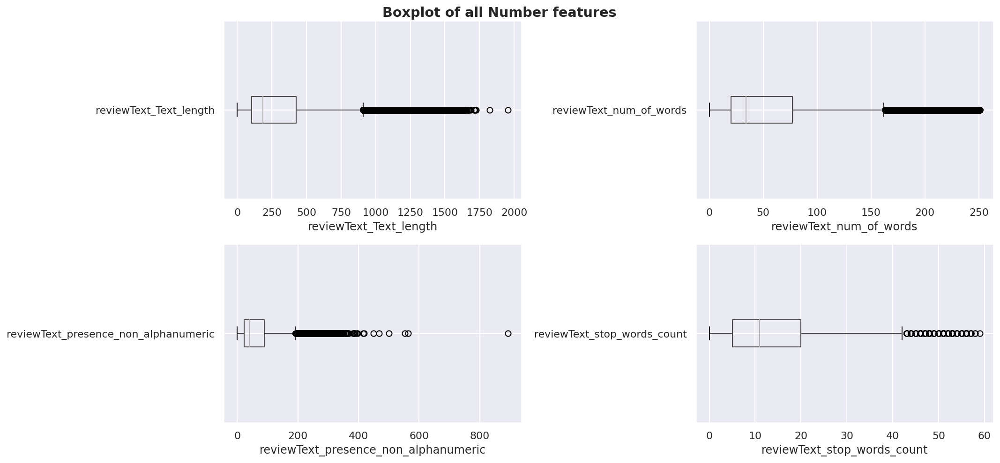

In [ ]:
ax = mulitple_function_plots(data=reports_reviewText_purged.drop(purging_index_2), kde_type= False , plot_type="boxplot",data_type="number", fig_size=(15,7))

There are still a lot of very long Text length instances.

We need to investigate it further.

In [ ]:
report_data_purged_2 = reports_reviewText_purged.drop(purging_index_2)

In [ ]:
report_data_purged_2[report_data_purged_2['reviewText_Text_length'] > 1750].head(1)

,reviewText_Text_length,reviewText_num_of_words,reviewText_presence_non_alphanumeric,reviewText_stop_words_count
119954,1824,94,384,19


In [ ]:
max_print_out(True)
outlier_example = raw_data_copy.loc[report_data_purged_2[report_data_purged_2['reviewText_Text_length'] > 1750].head(1).index]
outlier_example.reviewText.values

<StringArray>
['Another great Wen Spencer book. A very fun adventure story with a resourceful young hero, determined to protect both his new family and birth family. Jerin Whistler has been raised unconventionally for his world. He reads, writes, knows self-defense, as well as tactics and strategy. His kind heart and bravery stand him in good stead as he faces and overcomes both moral and physical danger. Great read. Recommend to everyone who loves a great story.\n\nHere are some other great reads by Wen Spencer:\n\nhttp://www.amazon.com/Tinker-Elfhome-Book-Wen-Spencer-ebook/dp/B00AP9CJXC/ref=la_B001IQXNE0_1_1?s=books&ie=UTF8&qid=1459800416&sr=1-1\n\nhttp://www.amazon.com/Wolf-Who-Rules-Elfhome-Book-ebook/dp/B00AP91UDC/ref=la_B001IQXNE0_1_3?s=books&ie=UTF8&qid=1459800416&sr=1-3\n\nhttp://www.amazon.com/Elfhome-Wen-Spencer-ebook/dp/B00APADQ0Q/ref=la_B001IQXNE0_1_4?s=books&ie=UTF8&qid=1459800416&sr=1-4\n\nhttp://www.amazon.com/Wood-Sprites-Elfhome-Book-4-ebook/dp/B00MRZ0JNO/ref=la_B001IQ

Now, we have website links to delete.

In [ ]:
demo_text = str(outlier_example.reviewText.values)
import re as re
text = re.sub('http\S+', '', str(demo_text))
text

"<StringArray>\n['Another great Wen Spencer book. A very fun adventure story with a resourceful young hero, determined to protect both his new family and birth family. Jerin Whistler has been raised unconventionally for his world. He reads, writes, knows self-defense, as well as tactics and strategy. His kind heart and bravery stand him in good stead as he faces and overcomes both moral and physical danger. Great read. Recommend to everyone who loves a great story.\\n\\nHere are some other great reads by Wen Spencer:\\n\\n\nLength: 1, dtype: stringsdfsdfsdsfdsfsfsfsfdsfsfsfs"

Good enough.

##### ***2. Delete HTML tage and URL from our dataset***

Now, it's time to generate a function to do so.

In [ ]:
#---------------clean_useless_information---------------

def clean_useless_information(data_df, columns = ['reviewText']):
  data = data_df.copy()
  for i in range(len(columns)):
    # clean html tag
    data[columns[i]] = data[(columns[i])].str.replace('<[^<]+?>', '')
    # clean &nbsp
    data[(columns[i])] = data[(columns[i])].str.replace('&nbsp', '')
    # clean http URL
    data[(columns[i])] = data[(columns[i])].str.replace('http\S+', '')
    # clean line breaker
    data[(columns[i])] = data[(columns[i])].str.replace('\n', '')
    return data

In [ ]:
raw_data_clean = clean_useless_information(raw_data)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: FutureWarning: The default value of regex will change from True to False in a future version.
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:11: FutureWarning: The default value of regex will change from True to False in a future version.
  # This is added back by InteractiveShellApp.init_path()


Let's find out whether we did a right thing.

Original problematic instance

In [ ]:
# original dataset with problematic instance 
# HTML TAG instance
raw_data.iloc[156379,7]

'H. Beam Piper\'s Fuzzy novels,&nbsp;<a data-hook="product-link-linked" class="a-link-normal" href="/Little-Fuzzy/dp/159818797X/ref=cm_cr_arp_d_rvw_txt?ie=UTF8">Little Fuzzy</a>&nbsp;(first published in 1962),&nbsp;<a data-hook="product-link-linked" class="a-link-normal" href="/Fuzzy-Sapiens/dp/B000EG6BA8/ref=cm_cr_arp_d_rvw_txt?ie=UTF8">Fuzzy Sapiens</a>&nbsp;(originally published as&nbsp;<a data-hook="product-link-linked" class="a-link-normal" href="/The-Other-Human-Race/dp/B000H0O5CC/ref=cm_cr_arp_d_rvw_txt?ie=UTF8">The Other Human Race</a>&nbsp;in 1964), and&nbsp;<a data-hook="product-link-linked" class="a-link-normal" href="/Fuzzies-and-Other-People/dp/B000ENMVTQ/ref=cm_cr_arp_d_rvw_txt?ie=UTF8">Fuzzies and Other People</a>&nbsp;(first published in 1984), are perhaps the best treatment ever of the nature of intelligence in science-fiction.  The three novels deal with the assorted legal and political challenges which occur in the aftermath of the discovery of the Fuzzies--small, cu

Cleaned instance

In [ ]:
raw_data_clean.iloc[156379,7]

'H. Beam Piper\'s Fuzzy novels,;Little Fuzzy;(first published in 1962),;Fuzzy Sapiens;(originally published as;The Other Human Race;in 1964), and;Fuzzies and Other People;(first published in 1984), are perhaps the best treatment ever of the nature of intelligence in science-fiction.  The three novels deal with the assorted legal and political challenges which occur in the aftermath of the discovery of the Fuzzies--small, cute, furry humanoids--by human settlers on the planet Zarathustra.  Part crime drama, part space opera, Piper\'s novels remain a joy to read even though many of their early-1960\'s technological and cultural accouterments are a bit outdated.\n\nInterestingly, the third novel in the Fuzzies series, published posthumously, appeared after the publication of two "authorized" sequels penned by other authors: William Tuning\'s;Fuzzy Bones;(1981) and Ardath Mayhar\'s;Golden Dream: A Fuzzy Odyssey;(1982).  Along with Fuzzies and Other People, these three novels constitute thr

NO HTML TAG and nbsp. GOOD.

Original problematic instance

In [ ]:
# original dataset with problematic instance 
# Long URL
raw_data.iloc[119954,7]

'Another great Wen Spencer book. A very fun adventure story with a resourceful young hero, determined to protect both his new family and birth family. Jerin Whistler has been raised unconventionally for his world. He reads, writes, knows self-defense, as well as tactics and strategy. His kind heart and bravery stand him in good stead as he faces and overcomes both moral and physical danger. Great read. Recommend to everyone who loves a great story.\n\nHere are some other great reads by Wen Spencer:\n\nhttp://www.amazon.com/Tinker-Elfhome-Book-Wen-Spencer-ebook/dp/B00AP9CJXC/ref=la_B001IQXNE0_1_1?s=books&ie=UTF8&qid=1459800416&sr=1-1\n\nhttp://www.amazon.com/Wolf-Who-Rules-Elfhome-Book-ebook/dp/B00AP91UDC/ref=la_B001IQXNE0_1_3?s=books&ie=UTF8&qid=1459800416&sr=1-3\n\nhttp://www.amazon.com/Elfhome-Wen-Spencer-ebook/dp/B00APADQ0Q/ref=la_B001IQXNE0_1_4?s=books&ie=UTF8&qid=1459800416&sr=1-4\n\nhttp://www.amazon.com/Wood-Sprites-Elfhome-Book-4-ebook/dp/B00MRZ0JNO/ref=la_B001IQXNE0_1_2?s=book

Cleaned instance

In [ ]:
raw_data_clean.iloc[119954,7]

'Another great Wen Spencer book. A very fun adventure story with a resourceful young hero, determined to protect both his new family and birth family. Jerin Whistler has been raised unconventionally for his world. He reads, writes, knows self-defense, as well as tactics and strategy. His kind heart and bravery stand him in good stead as he faces and overcomes both moral and physical danger. Great read. Recommend to everyone who loves a great story.Here are some other great reads by Wen Spencer:'

NO URL anymore.
Good!

##### ***3. Now we generate the reports with boxplot***

> Note, such a bad idea to add feature name into result column name.<br>
> I don't have time to rerun codes from 1.a.2 Text item Properties.<br>
> So we changed our function from now on.

In [ ]:
#--------------text_item_properties---------------#
'''We want to save all the results to a new dataframe'''
def text_item_properties(data):
  result = pd.DataFrame()
  data = data.copy()
  # we just fill na with 0 here. Without doing so, there will be an error
  data = data.fillna('0')
  for i in range(len(data.columns)):
    # get character length
    result['Text_length'] = data[str(data.columns[i])].str.len() 
    # get number of words
    result['num_of_words'] = data[str(data.columns[i])].str.split().str.len()
    # get non alphanumeric number
    result['presence_non_alphanumeric'] = data[str(data.columns[i])].str.replace('[a-zA-Z0-9]', '').str.len()
    # get stop words account
    result['stop_words_count'] = data[str(data.columns[i])].str.split().apply(lambda x: len(set(x) & stop_words)) 
  return result 

In [ ]:
#---------------clean_useless_information---------------
def show_purged_reports(data_df, parameter = ['reviewText'], output_type = 'num_of_words'):
  data = data_df.copy() # get the copy
  # get our reports
  reports = text_item_properties( data.loc[:, parameter]);
  # find outliers
  index = find_outliers(reports, output_type);
  # plot the results
  ax = mulitple_function_plots(data=reports.drop(index), kde_type = False, plot_type="histogram",data_type="number", fig_size=(15,7),tight_layout=False)
  ax = mulitple_function_plots(data=reports.drop(index), kde_type= False , plot_type="boxplot",data_type="number", fig_size=(15,7) , tight_layout=False);
  return reports, index

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: FutureWarning: The default value of regex will change from True to False in a future version.
  


IQR = 112.0 - 21.0 = 91.0
MAX = 248.5
Min is 0
Num of min outliers:  0
Num of max outliers:  108535
Num of negative outliers:  27
Num of the original data set's whole instance 1000000
Rate of purged data/total data 0.108535
Those features will be plotted in  2  rows and  2 columns
Index(['Text_length', 'num_of_words', 'presence_non_alphanumeric',
       'stop_words_count'],
      dtype='object')
1 . Finish Rendering : Text_length , used 0 millseconds
2 . Finish Rendering : num_of_words , used 0 millseconds
3 . Finish Rendering : presence_non_alphanumeric , used 0 millseconds
4 . Finish Rendering : stop_words_count , used 0 millseconds
Those features will be plotted in  2  rows and  2 columns
Index(['Text_length', 'num_of_words', 'presence_non_alphanumeric',
       'stop_words_count'],
      dtype='object')
1 . Finish Rendering : Text_length , used 0 millseconds
2 . Finish Rendering : num_of_words , used 1 millseconds
3 . Finish Rendering : presence_non_alphanumeric , used 2 millseconds

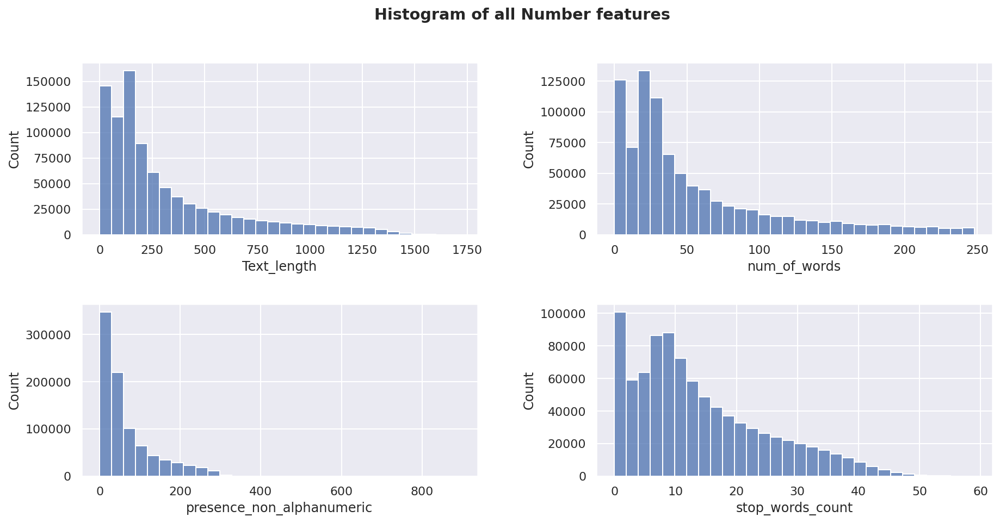

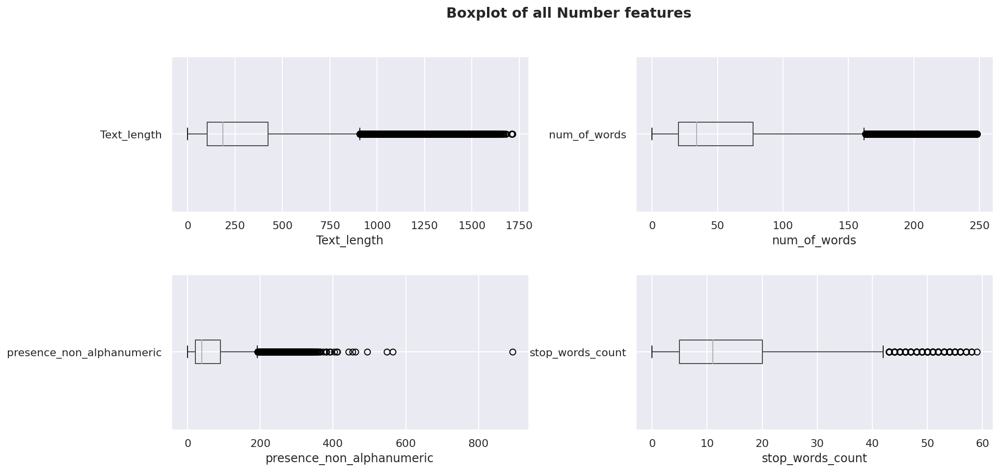

In [ ]:
reports, index = show_purged_reports(raw_data_clean)

We still have outliers, but let's see if it's reasonable.

In [ ]:
max_print_out(True)
outlier_example = raw_data_clean.loc[reports[reports['reviewText_Text_length'] > 1750].head(1).index]
outlier_example.reviewText.values

<StringArray>
["This book is a stand alone read as some have mentioned in their reviews. To really understand the whole dynamic behind the characters; you should really read the other books in the series.  I wondered how Dane was going to tell Raven' s story because there was just such a strong energy bouncing off Raven. Her feelings were raw in the Brown Felt books and the Dinner Party Girls. I felt like Lauren really needed to get into Raven's Psyche and give Raven's voice as well as her emotions a chance.Lauren did it.  She wrote Raven as the edgy bitch some of us had become curios about.  Raven had been independent and alone for the majority of  her life. Letting people in her life felt wrong and placed her in a very vulnerable position.  She had never felt LOVED and cherished until she started a relationship with her bosses sister. Erin befriended Raven immediately and it was the relationship that began preparing Raven for the real deal, Jonah Warner. Jonah Warner, Levi' s brother

Quite reasonbale.
Then we are done, here.
No further investigation of this data quality issue.

#### 2. Summary
We rerun the above codes to see if there is a problem in summary.

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: FutureWarning: The default value of regex will change from True to False in a future version.
  


IQR = 6.0 - 2.0 = 4.0
MAX = 12.0
Min is 0
Num of min outliers:  0
Num of max outliers:  37431
Num of negative outliers:  1
Num of the original data set's whole instance 1000000
Rate of purged data/total data 0.037431
Those features will be plotted in  2  rows and  2 columns
Index(['Text_length', 'num_of_words', 'presence_non_alphanumeric',
       'stop_words_count'],
      dtype='object')
1 . Finish Rendering : Text_length , used 0 millseconds
2 . Finish Rendering : num_of_words , used 0 millseconds
3 . Finish Rendering : presence_non_alphanumeric , used 0 millseconds
4 . Finish Rendering : stop_words_count , used 0 millseconds
Those features will be plotted in  2  rows and  2 columns
Index(['Text_length', 'num_of_words', 'presence_non_alphanumeric',
       'stop_words_count'],
      dtype='object')
1 . Finish Rendering : Text_length , used 0 millseconds
2 . Finish Rendering : num_of_words , used 1 millseconds
3 . Finish Rendering : presence_non_alphanumeric , used 2 millseconds
4 . Fi

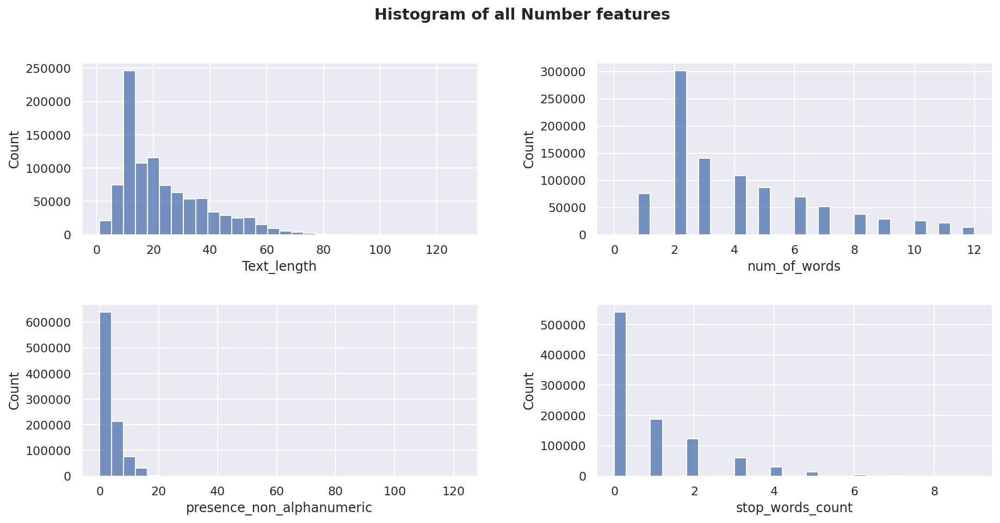

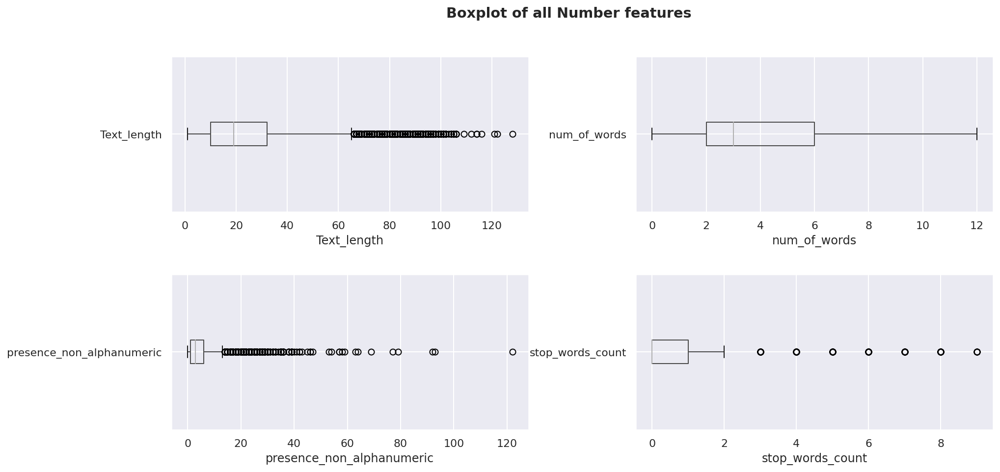

In [ ]:
reports, index = show_purged_reports(raw_data_clean, parameter=['summary'])

In [ ]:
max_print_out(True)
outlier_example = raw_data_clean.loc[reports[reports['Text_length'] > 120].head(1).index]
outlier_example.reviewText.values

<StringArray>
['Paid for two and only ordered one. I have been trying to return the 2nd one and got no response so I will have to keep checking to make sure I did not get charged again for two books but it was a great purchase!']
Length: 1, dtype: string

Well, the longest outlier in summary is just a normal sentence.

We can called it a day for the data quality issue of text items.

#### 3. NaN values

In [ ]:
raw_data_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000000 entries, 0 to 999999
Data columns (total 12 columns):
 #   Column          Non-Null Count    Dtype  
---  ------          --------------    -----  
 0   overall         1000000 non-null  Int64  
 1   verified        1000000 non-null  boolean
 2   reviewTime      1000000 non-null  string 
 3   reviewerID      1000000 non-null  string 
 4   asin            1000000 non-null  string 
 5   style           994508 non-null   string 
 6   reviewerName    999938 non-null   string 
 7   reviewText      999867 non-null   string 
 8   summary         999859 non-null   string 
 9   unixReviewTime  1000000 non-null  Int64  
 10  vote            217191 non-null   object 
 11  image           1559 non-null     string 
dtypes: Int64(2), boolean(1), object(1), string(8)
memory usage: 87.7+ MB


In [ ]:
raw_data_clean[raw_data_clean['reviewText'].isna()].head(5)

,overall,verified,reviewTime,reviewerID,asin,style,reviewerName,reviewText,summary,unixReviewTime,vote,image
1521,5,False,"07 19, 2017",AZWSL7MRCSAQF,0399159347,{'Format:': ' Hardcover'},Katandra Jackson Nunnally,<NA>,It Matters,1500422400,NaN,['https://images-na.ssl-images-amazon.com/imag...
2924,5,True,"02 24, 2017",A3EME7G0VAOKV2,0451226119,{'Format:': ' Paperback'},Yolanda Jones,<NA>,Five Stars,1487894400,NaN,<NA>
8053,5,True,"05 28, 2015",A207U7VN8R2JWJ,0380791714,{'Format:': ' Paperback'},abel osuna,<NA>,Five Stars,1432771200,NaN,<NA>
11051,5,True,"04 30, 2016",A1SCSXMXJVMVCU,0451475518,{'Format:': ' Kindle Edition'},Kristen,<NA>,Five Stars,1461974400,NaN,<NA>
26905,3,True,"04 15, 2016",A3JEFNA3EF5ZIW,0486270602,{'Format:': ' Paperback'},Raven,<NA>,Three Stars,1460678400,NaN,<NA>


Without reviewText, it's very hard to predict the overall score.
We delete all instnace with NaN reviewText first.

In [ ]:
#--------------purge_NaN-------------------
def purge_NaN(data_df):
  data = data_df.copy()
  data = data.drop(data[data['reviewText'].isna()].index)
  return data

In [ ]:
new_data_without_nan = purge_NaN(raw_data_clean)

In [ ]:
new_data_without_nan.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 999867 entries, 0 to 999999
Data columns (total 12 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   overall         999867 non-null  Int64  
 1   verified        999867 non-null  boolean
 2   reviewTime      999867 non-null  string 
 3   reviewerID      999867 non-null  string 
 4   asin            999867 non-null  string 
 5   style           994375 non-null  string 
 6   reviewerName    999805 non-null  string 
 7   reviewText      999867 non-null  string 
 8   summary         999733 non-null  string 
 9   unixReviewTime  999867 non-null  Int64  
 10  vote            217187 non-null  object 
 11  image           1550 non-null    string 
dtypes: Int64(2), boolean(1), object(1), string(8)
memory usage: 95.4+ MB


We take a look at style's NaN looks like.

In [ ]:
raw_data_clean[raw_data_clean['style'].isna()].head(5)

,overall,verified,reviewTime,reviewerID,asin,style,reviewerName,reviewText,summary,unixReviewTime,vote,image
43,5,False,"07 16, 2014",A32M1YZPIX7UK,0385489129,<NA>,Jeannette Speck,Thanks,Five Stars,1405468800,NaN,<NA>
108,4,False,"04 4, 2016",A2OJW07GQRNJUT,039304050X,<NA>,Steven H Propp,Author and former prosecutor Vincent Bugliosi ...,THE MANSON PROSECUTOR TURNED WRITER LOOKS AT T...,1459728000,NaN,<NA>
152,5,True,"08 25, 2015",A2HIDWUPXXZAOR,0394551907,<NA>,Pat,I only recently heard about this Dr. Seuss boo...,I only recently heard about this Dr. Seuss boo...,1440460800,NaN,<NA>
256,5,False,"08 8, 2010",AHD101501WCN1,0445083808,<NA>,Shalom Freedman,Cornelius Ryan does something unusual in this ...,Outstanding description of the Normandy Invasion,1281225600,3,<NA>
351,5,True,"08 18, 2014",AV1OM7Z698LL5,0451468740,<NA>,Kathleen Freeman,Truly an engaging story about an amazing event...,The end of Osama,1408320000,2,<NA>


And the normal style instances

In [ ]:
raw_data_clean['style'].head(5)

0    {'Format:': ' Kindle Edition'}
1         {'Format:': ' Hardcover'}
2    {'Format:': ' Kindle Edition'}
3         {'Format:': ' Paperback'}
4    {'Format:': ' Kindle Edition'}
Name: style, dtype: string

In [ ]:
raw_data_clean['style'].value_counts().head()

{'Format:': ' Kindle Edition'}           485256
{'Format:': ' Paperback'}                205399
{'Format:': ' Hardcover'}                181883
{'Format:': ' Mass Market Paperback'}     95746
{'Format:': ' Board book'}                 9241
Name: style, dtype: Int64

In [ ]:
len(raw_data_clean[raw_data_clean['style'].isna()])

5492

This feature is not that important. 
And we can just add one kind of book style on the NaN values.

Or 5492 is really not too much instances, we can just drop it.

Let's see how many NaN with summary.

In [ ]:
len(raw_data_clean[raw_data_clean['summary'].isna()])

141

In [ ]:
raw_data_clean[raw_data_clean['summary'].isna()].head(5)

,overall,verified,reviewTime,reviewerID,asin,style,reviewerName,reviewText,summary,unixReviewTime,vote,image
5752,1,False,"01 17, 2018",A35YSGG9NGX2Y8,0385543026,{'Format:': ' Hardcover'},ReadsLots,"Starts off nicely: great caper, swiping manus...",<NA>,1516147200,NaN,<NA>
6007,5,False,"06 23, 2016",A3B3SJL6Y9GAPU,0375990690,{'Format:': ' Kindle Edition'},mjc,"I loved this book! This book has been amazing,...",<NA>,1466640000,2,<NA>
11853,5,True,"01 26, 2017",ARCS9S0H1Y7VB,0425270696,{'Format:': ' Kindle Edition'},Sarah Mack,"I love this book, and this series. The authors...",<NA>,1485388800,NaN,<NA>
23638,5,True,"01 11, 2017",A2HDK6XBOV1BI1,0373284241,{'Format:': ' Kindle Edition'},Bailey,Have enjoyed reading all the books in this ser...,<NA>,1484092800,NaN,<NA>
32116,5,True,"09 5, 2016",ACV8DKJK8R328,0425263223,{'Format:': ' Kindle Edition'},Angie,Love the series. If your missing Sookie's worl...,<NA>,1473033600,NaN,<NA>


Since we have almost 1 million instances, we can just drop those 141 instances.

### 1.2.2 Data quality Plan

In [ ]:
raw_data_clean.columns

Index(['overall', 'verified', 'reviewTime', 'reviewerID', 'asin', 'style',
       'reviewerName', 'reviewText', 'summary', 'unixReviewTime', 'vote',
       'image'],
      dtype='object')


About NaN values. We drop all instances with NaN values.


| Continuous Feature   | Data Quality Issue  | Potential Handling Strategies  |
 |  ----  |          ----   |              --- |
| overall  | The ratio of 5 different scores are different | Need to stratified sample the dataset before training.|
| unixReviewTime  | a time series value but in Int | convert to time series and then put into days|
|verified|boolean value|chagne to int|

---


| Categorical Feature   | Data Quality Issue  | Potential Handling Strategies  |
|  ----  |          ----   |              --- |
| reviewTime  | a time series value but in string | convert to time series and then put into days|
|reviewerID|Not much useful|Drop|
|asin|ID number for books|Can't get the book name so far, have to drop it|
|style|has useless non-aplhanumeric characters|need to purge those characters|
|reviewerName|not very useful|Drop the column|
|reviewText| Has outliers/html tag/URL/useless symbols|Purge outliers and delete useless information|
|summary|No problem for now|No further investigation|
|vote| TOO many NaN values| Drop column|
|image|Too many NaN values| Drop column|


## 1.3. Preprocess your data according to the data quality plan.

#### 1. Drop vote and image and NaN instances

In [ ]:
#--------------purge_NaN-------------------
def purge_NaN(data_df):
  data = data_df.copy()
  # drop vote and image
  data = data.drop(['vote','image'], axis = 1)
  # drop NaN values
  for i in range(len(data.columns)):
    data = data.drop(data[data[str(data.columns[i])].isna()].index)
  return data

In [ ]:
raw_data_copy = raw_data.copy()
raw_data_copy = purge_NaN(raw_data_copy)

In [ ]:
raw_data_copy.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 994181 entries, 0 to 999999
Data columns (total 10 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   overall         994181 non-null  Int64  
 1   verified        994181 non-null  boolean
 2   reviewTime      994181 non-null  string 
 3   reviewerID      994181 non-null  string 
 4   asin            994181 non-null  string 
 5   style           994181 non-null  string 
 6   reviewerName    994181 non-null  string 
 7   reviewText      994181 non-null  string 
 8   summary         994181 non-null  string 
 9   unixReviewTime  994181 non-null  Int64  
dtypes: Int64(2), boolean(1), string(7)
memory usage: 111.9 MB


#### 2. Purge outliers

We only need to use review Text to purge outliers

In [ ]:
#---------------clean_useless_information---------------
def purge_outliers(data_df, parameter = 'reviewText', output_type = 'num_of_words'):
  data = data_df.copy() # get the copy
  # find outliers
  result = pd.DataFrame()
  result[output_type] = data[parameter].str.split().str.len()
  index = find_outliers(result, output_type);
  # plot the results
  return data.drop(index)

In [ ]:
raw_data_copy = purge_outliers(raw_data_copy)

IQR = 112.0 - 21.0 = 91.0
MAX = 248.5
Min is 0
Num of min outliers:  0
Num of max outliers:  109577
Num of negative outliers:  0
Num of the original data set's whole instance 994181
Rate of purged data/total data 0.11021836064056746


In [ ]:
raw_data_copy.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 884604 entries, 0 to 999999
Data columns (total 10 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   overall         884604 non-null  Int64  
 1   verified        884604 non-null  boolean
 2   reviewTime      884604 non-null  string 
 3   reviewerID      884604 non-null  string 
 4   asin            884604 non-null  string 
 5   style           884604 non-null  string 
 6   reviewerName    884604 non-null  string 
 7   reviewText      884604 non-null  string 
 8   summary         884604 non-null  string 
 9   unixReviewTime  884604 non-null  Int64  
dtypes: Int64(2), boolean(1), string(7)
memory usage: 70.9 MB


#### 3. Change boolean to int

In [ ]:
raw_data_copy["verified"] = raw_data_copy["verified"].astype(int)

In [ ]:
raw_data_copy.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 884604 entries, 0 to 999999
Data columns (total 10 columns):
 #   Column          Non-Null Count   Dtype 
---  ------          --------------   ----- 
 0   overall         884604 non-null  Int64 
 1   verified        884604 non-null  int64 
 2   reviewTime      884604 non-null  string
 3   reviewerID      884604 non-null  string
 4   asin            884604 non-null  string
 5   style           884604 non-null  string
 6   reviewerName    884604 non-null  string
 7   reviewText      884604 non-null  string
 8   summary         884604 non-null  string
 9   unixReviewTime  884604 non-null  Int64 
dtypes: Int64(2), int64(1), string(7)
memory usage: 75.9 MB


#### 4. clean non-alphanumeric character in each feature.

First we take a look at the style with long length


In [ ]:
# instances with long style length
raw_data_copy[raw_data_copy['style'].str.len() > 30].head()

,overall,verified,reviewTime,reviewerID,asin,style,reviewerName,reviewText,summary,unixReviewTime
19,3,0,"08 28, 2002",A3UHCUZ5H4N0TH,0399138994,{'Format:': ' Mass Market Paperback'},Darren Jacks,Didn't King write something along these lines;...,Average...,1030492800
61,3,1,"06 22, 2014",A1TCJV0HALJE69,037543075X,{'Format:': ' Mass Market Paperback'},Chantelle,"This book was fine. It is not The Notebook, De...",Just Okay,1403395200
77,3,0,"02 1, 2005",A1DMOR9TUO13I1,0394575288,{'Format:': ' Mass Market Paperback'},Don M Howard,"I liked Pete Hamill's ""Loving Women"" and found...","Good story, but anachronisms abound",1107216000
88,4,0,"01 30, 2017",AQH1ODDV4HKLI,0425258947,{'Format:': ' Mass Market Paperback'},des,"So although I love this series, I wasn't a fan...",So although I love this series,1485734400
91,5,0,"03 10, 2014",A2WP2OBWXIN78C,0451418336,{'Format:': ' Mass Market Paperback'},Sara Gerhold,Catherine Anderson has done it again! She brin...,Another hit by Catherine Anderson!,1394409600


We can see in style, we need to remove 'Format' and Punctuation.




In [ ]:
raw_data_copy['style'] = raw_data_copy['style'].str.replace('[^\w\s]+', '')
raw_data_copy['style'] = raw_data_copy['style'].str.replace('Format', '')


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: FutureWarning: The default value of regex will change from True to False in a future version.
  """Entry point for launching an IPython kernel.


In [ ]:
raw_data_copy.head()

,overall,verified,reviewTime,reviewerID,asin,style,reviewerName,reviewText,summary,unixReviewTime
0,2,0,"12 4, 2015",A273QRPDN6IQC8,0446676101,Kindle Edition,Rub Chicken,Book starts out with some really interesting i...,with some really interesting ideas and gets c...,1449187200
1,5,1,"04 24, 2016",A31Q39MDPVBTSX,0451473019,Hardcover,BluegrassAnne,was a gift for someone he loved it,he loved,1461456000
2,4,1,"10 30, 2014",A353XVWAOOUCQS,0385352107,Kindle Edition,Reader in the Pacific,I have read a number of Murakami novels and th...,Hollow Man,1414627200
4,5,0,"08 15, 2015",A2XS90TMQ26YYH,0399146695,Kindle Edition,J Williams,Great story Highly recommended,Five Stars,1439596800
5,3,1,"04 5, 2014",A1W2NS6QC29RZM,0385519311,Hardcover,Noraxpat,I passed this book on to someone who was more ...,OK FOR INTRO TO PERSONAL FINANCE,1396656000


Nice that is what we want.
Then we delete any punctuation in other text features.

In [ ]:
raw_data_copy['reviewerName'] = raw_data_copy['reviewerName'].str.replace('[^\w\s]+', '')
raw_data_copy['reviewText'] = raw_data_copy['reviewText'].str.replace('[^\w\s]+', '')
raw_data_copy['summary'] = raw_data_copy['summary'].str.replace('[^\w\s]+', '')

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: FutureWarning: The default value of regex will change from True to False in a future version.
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: FutureWarning: The default value of regex will change from True to False in a future version.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: FutureWarning: The default value of regex will change from True to False in a future version.
  This is separate from the ipykernel package so we can avoid doing imports until


In [ ]:
raw_data_copy.head()

,overall,verified,reviewTime,reviewerID,asin,style,reviewerName,reviewText,summary,unixReviewTime
0,2,0,"12 4, 2015",A273QRPDN6IQC8,0446676101,Kindle Edition,Rub Chicken,Book starts out with some really interesting i...,with some really interesting ideas and gets c...,1449187200
1,5,1,"04 24, 2016",A31Q39MDPVBTSX,0451473019,Hardcover,BluegrassAnne,was a gift for someone he loved it,he loved,1461456000
2,4,1,"10 30, 2014",A353XVWAOOUCQS,0385352107,Kindle Edition,Reader in the Pacific,I have read a number of Murakami novels and th...,Hollow Man,1414627200
4,5,0,"08 15, 2015",A2XS90TMQ26YYH,0399146695,Kindle Edition,J Williams,Great story Highly recommended,Five Stars,1439596800
5,3,1,"04 5, 2014",A1W2NS6QC29RZM,0385519311,Hardcover,Noraxpat,I passed this book on to someone who was more ...,OK FOR INTRO TO PERSONAL FINANCE,1396656000


Let's run our reports function to see if there is any punctuation

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: FutureWarning: The default value of regex will change from True to False in a future version.
  app.launch_new_instance()


Those features will be plotted in  2  rows and  2 columns
Index(['Text_length', 'num_of_words', 'presence_non_alphanumeric',
       'stop_words_count'],
      dtype='object')
1 . Finish Rendering : Text_length , used 0 millseconds
2 . Finish Rendering : num_of_words , used 0 millseconds
3 . Finish Rendering : presence_non_alphanumeric , used 0 millseconds
4 . Finish Rendering : stop_words_count , used 0 millseconds
Those features will be plotted in  2  rows and  2 columns
Index(['Text_length', 'num_of_words', 'presence_non_alphanumeric',
       'stop_words_count'],
      dtype='object')
1 . Finish Rendering : Text_length , used 0 millseconds
2 . Finish Rendering : num_of_words , used 1 millseconds
3 . Finish Rendering : presence_non_alphanumeric , used 2 millseconds
4 . Finish Rendering : stop_words_count , used 3 millseconds


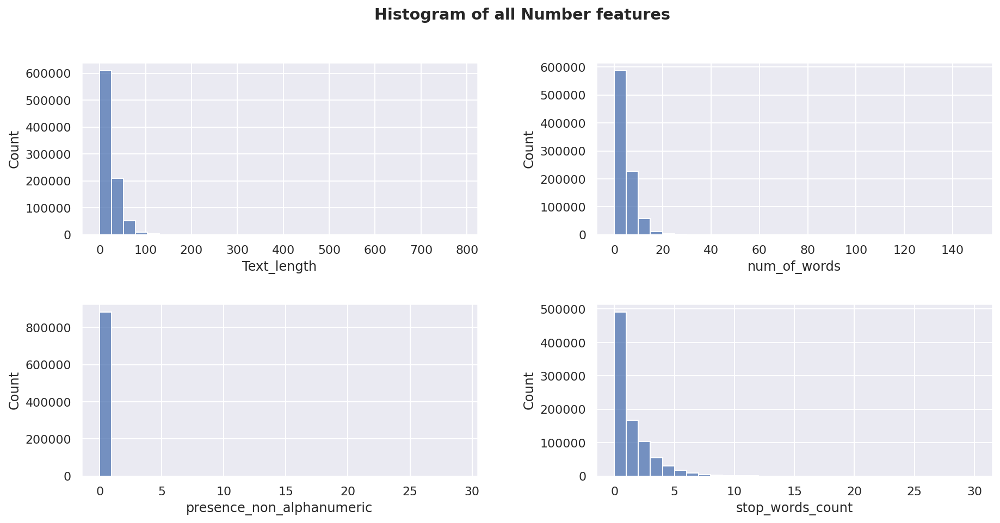

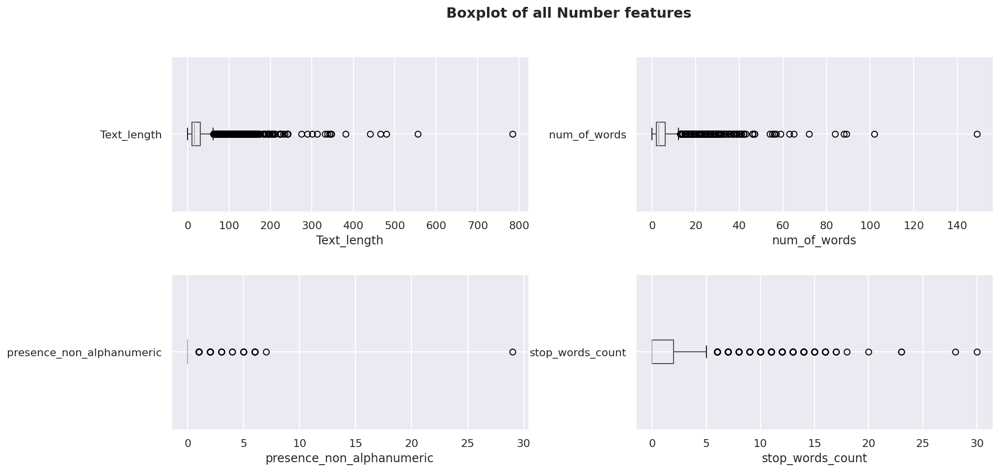

In [ ]:
reports = show_reports(raw_data_copy, parameter=['summary'])

We can see there is no non aplhanumeric value anymore.

That is all we need. The useless features, we will delete in the transformer.

#### 5. Now Let's write our transformer.

In [ ]:
#------------- main transformer ---------------------
# Class for attribute transformer
# import important libray
from sklearn.base import BaseEstimator, TransformerMixin

class combined_attribute_adder_and_cleaner(BaseEstimator, TransformerMixin):
    '''data clean transfomer class'''
    
    def __init__(self, data_cleaner = True, servies_remainer = False, normalization = True): # no *args or **kargs
        # we need to set extra var to ensure do we need to purge the dataset. 
        # In my following experments, sometimes we don't need to do so. 
        self.data_cleaner = data_cleaner
        self.servies_remainer = servies_remainer
        self.normalization = normalization

    def fit(self, X, y=None):
        return self # nothing else to do

    def transform(self, data_df):
        # we first copy the data from our dataset.
        # operate on original data set sometimes is dangerous.
        X = data_df.copy()

        #0. drop NaN values
        # drop vote and image
        X = X.drop(['vote','image'], axis = 1)
        # drop NaN values
        for i in range(len(X.columns)):
          X = X.drop(X[X[str(X.columns[i])].isna()].index)

        # 1. First we change the feature verified with to integer
        X["verified"] = X["verified"].astype(int)

        # 2. purge outliers
        X = purge_outliers(X)

        # 3. drop all useless features and categorical features we alreayd transfered
        X = X.drop(['reviewerID','reviewTime', 'asin', 'unixReviewTime'],axis=1) 

        # 4. delete HTML tag and other useless characters
        X = clean_useless_information(X)

        # 5. clean non alphanumeric data
        X['style'] = X['style'].str.replace('[^\w\s]+', '')
        X['style'] = X['style'].str.replace('Format', '')
        X['reviewerName'] = X['reviewerName'].str.replace('[^\w\s]+', '')
        X['reviewText'] = X['reviewText'].str.replace('[^\w\s]+', '')
        X['summary'] = X['summary'].str.replace('[^\w\s]+', '')

        # we put our target value at the end
        target = X.pop('overall')
        X['score'] = target


        return X

In [ ]:
raw_data_copy = raw_data.copy()
attr_adder_and_cleaner = combined_attribute_adder_and_cleaner()
purged_data = attr_adder_and_cleaner.transform(raw_data_copy)

IQR = 112.0 - 21.0 = 91.0
MAX = 248.5
Min is 0
Num of min outliers:  0
Num of max outliers:  109577
Num of negative outliers:  0
Num of the original data set's whole instance 994181
Rate of purged data/total data 0.11021836064056746


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:26: FutureWarning: The default value of regex will change from True to False in a future version.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:30: FutureWarning: The default value of regex will change from True to False in a future version.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:44: FutureWarning: The default value of regex will change from True to False in a future version.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:46: FutureWarning: The default value of regex will change from True to False in a future version.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:47: FutureWarning: The default value of regex will change from True to False in a future version.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:48: FutureWarning: The default value of regex will change from True to False in a future version.


In [ ]:
purged_data.head()

,verified,style,reviewerName,reviewText,summary,score
0,0,Kindle Edition,Rub Chicken,Book starts out with some really interesting i...,with some really interesting ideas and gets c...,2
1,1,Hardcover,BluegrassAnne,was a gift for someone he loved it,he loved,5
2,1,Kindle Edition,Reader in the Pacific,I have read a number of Murakami novels and th...,Hollow Man,4
4,0,Kindle Edition,J Williams,Great story Highly recommended,Five Stars,5
5,1,Hardcover,Noraxpat,I passed this book on to someone who was more ...,OK FOR INTRO TO PERSONAL FINANCE,3


In [ ]:
purged_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 884604 entries, 0 to 999999
Data columns (total 6 columns):
 #   Column        Non-Null Count   Dtype 
---  ------        --------------   ----- 
 0   verified      884604 non-null  int64 
 1   style         884604 non-null  string
 2   reviewerName  884604 non-null  string
 3   reviewText    884604 non-null  string
 4   summary       884604 non-null  string
 5   score         884604 non-null  Int64 
dtypes: Int64(1), int64(1), string(4)
memory usage: 48.1 MB


Create a pipe line.

In [ ]:
#############################PIPE LINE###################################################

# Now we build a transformer to get all the above steps
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler


# convert_pipeline is for create a whole pipeline but remain the dataFrame structure
convert_pipeline = Pipeline([
        ('attribs_adder_cleaner', combined_attribute_adder_and_cleaner(data_cleaner=True)),
    ])

Test our pipeline.

In [ ]:
converted_data = convert_pipeline.fit_transform(raw_data.copy())

IQR = 112.0 - 21.0 = 91.0
MAX = 248.5
Min is 0
Num of min outliers:  0
Num of max outliers:  109577
Num of negative outliers:  0
Num of the original data set's whole instance 994181
Rate of purged data/total data 0.11021836064056746


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: FutureWarning: The default value of regex will change from True to False in a future version.
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:11: FutureWarning: The default value of regex will change from True to False in a future version.
  # This is added back by InteractiveShellApp.init_path()


In [ ]:
converted_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 884604 entries, 0 to 999999
Data columns (total 6 columns):
 #   Column        Non-Null Count   Dtype 
---  ------        --------------   ----- 
 0   verified      884604 non-null  int64 
 1   style         884604 non-null  string
 2   reviewerName  884604 non-null  string
 3   reviewText    884604 non-null  string
 4   summary       884604 non-null  string
 5   score         884604 non-null  Int64 
dtypes: Int64(1), int64(1), string(4)
memory usage: 48.1 MB


Let's draw the report.

In [ ]:
#---------------clean_useless_information---------------
def show_reports(data_df, parameter = ['reviewText'], output_type = 'num_of_words'):
  data = data_df.copy() # get the copy
  # get our reports
  reports = text_item_properties( data.loc[:, parameter]);
  # plot the results
  ax = mulitple_function_plots(data=reports, kde_type = False, plot_type="histogram",data_type="number", fig_size=(15,7),tight_layout=False)
  ax = mulitple_function_plots(data=reports, kde_type= False , plot_type="boxplot",data_type="number", fig_size=(15,7) , tight_layout=False);
  return reports


Draw graph on reviewText

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: FutureWarning: The default value of regex will change from True to False in a future version.
  app.launch_new_instance()


Those features will be plotted in  2  rows and  2 columns
Index(['Text_length', 'num_of_words', 'presence_non_alphanumeric',
       'stop_words_count'],
      dtype='object')
1 . Finish Rendering : Text_length , used 0 millseconds
2 . Finish Rendering : num_of_words , used 0 millseconds
3 . Finish Rendering : presence_non_alphanumeric , used 0 millseconds
4 . Finish Rendering : stop_words_count , used 1 millseconds
Those features will be plotted in  2  rows and  2 columns
Index(['Text_length', 'num_of_words', 'presence_non_alphanumeric',
       'stop_words_count'],
      dtype='object')
1 . Finish Rendering : Text_length , used 2 millseconds
2 . Finish Rendering : num_of_words , used 3 millseconds
3 . Finish Rendering : presence_non_alphanumeric , used 4 millseconds
4 . Finish Rendering : stop_words_count , used 5 millseconds


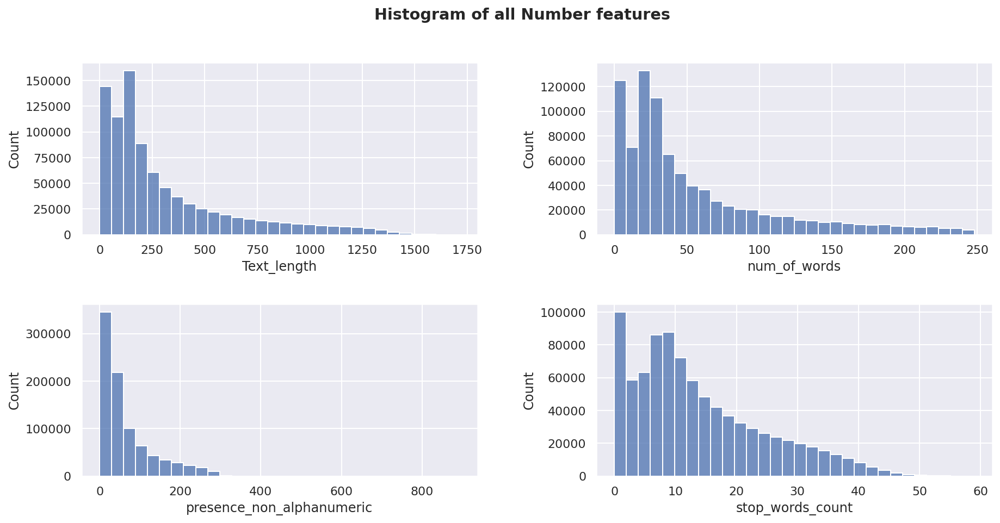

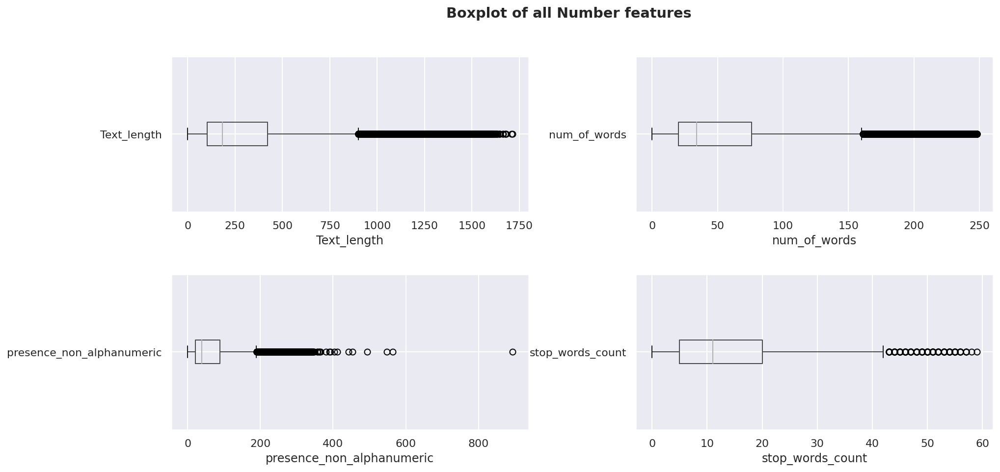

In [ ]:
reports = show_reports(converted_data)

Draw graph on summary.

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: FutureWarning: The default value of regex will change from True to False in a future version.
  app.launch_new_instance()


Those features will be plotted in  2  rows and  2 columns
Index(['Text_length', 'num_of_words', 'presence_non_alphanumeric',
       'stop_words_count'],
      dtype='object')
1 . Finish Rendering : Text_length , used 0 millseconds
2 . Finish Rendering : num_of_words , used 0 millseconds
3 . Finish Rendering : presence_non_alphanumeric , used 0 millseconds
4 . Finish Rendering : stop_words_count , used 0 millseconds
Those features will be plotted in  2  rows and  2 columns
Index(['Text_length', 'num_of_words', 'presence_non_alphanumeric',
       'stop_words_count'],
      dtype='object')
1 . Finish Rendering : Text_length , used 0 millseconds
2 . Finish Rendering : num_of_words , used 1 millseconds
3 . Finish Rendering : presence_non_alphanumeric , used 1 millseconds
4 . Finish Rendering : stop_words_count , used 2 millseconds


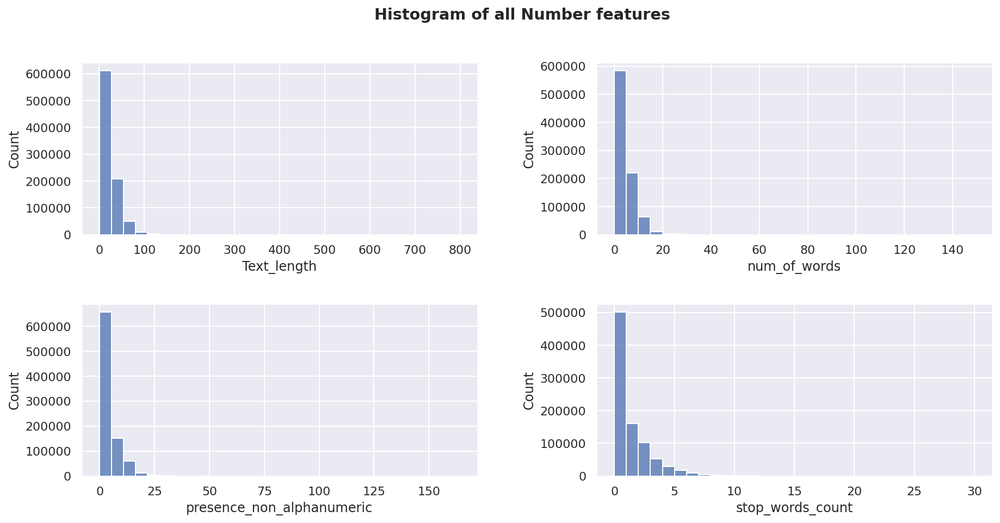

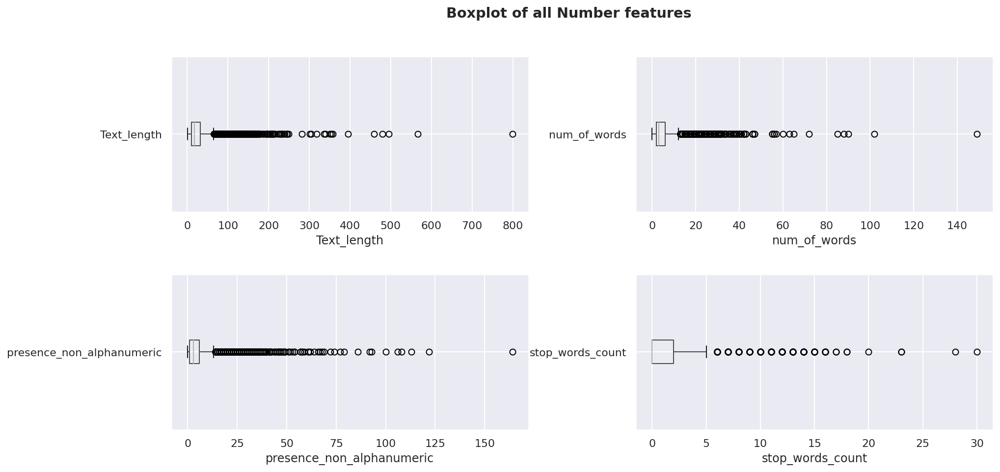

In [ ]:
reports = show_reports(converted_data,parameter=['summary'])

Draw graph on style.

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: FutureWarning: The default value of regex will change from True to False in a future version.
  app.launch_new_instance()


Those features will be plotted in  2  rows and  2 columns
Index(['Text_length', 'num_of_words', 'presence_non_alphanumeric',
       'stop_words_count'],
      dtype='object')
1 . Finish Rendering : Text_length , used 0 millseconds
2 . Finish Rendering : num_of_words , used 0 millseconds
3 . Finish Rendering : presence_non_alphanumeric , used 0 millseconds
4 . Finish Rendering : stop_words_count , used 0 millseconds
Those features will be plotted in  2  rows and  2 columns
Index(['Text_length', 'num_of_words', 'presence_non_alphanumeric',
       'stop_words_count'],
      dtype='object')
1 . Finish Rendering : Text_length , used 0 millseconds
2 . Finish Rendering : num_of_words , used 1 millseconds
3 . Finish Rendering : presence_non_alphanumeric , used 1 millseconds
4 . Finish Rendering : stop_words_count , used 2 millseconds


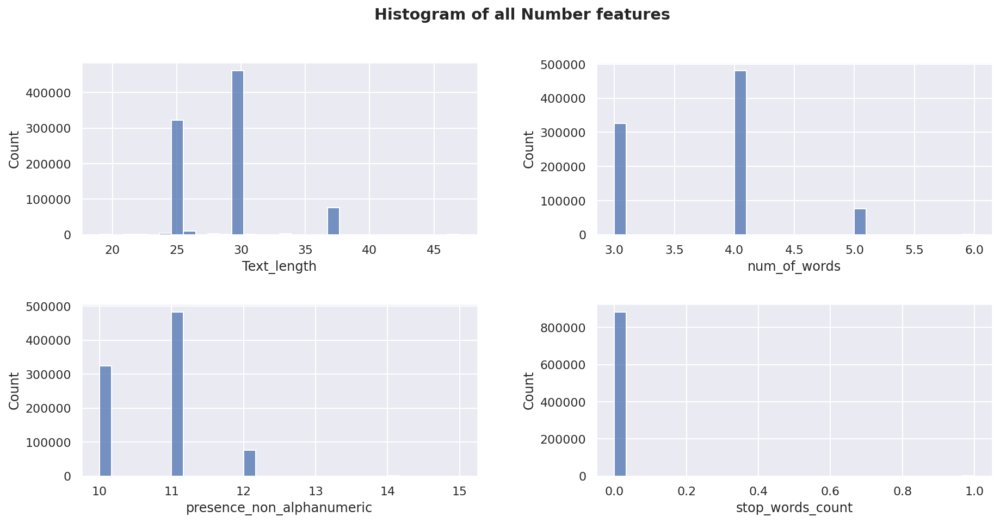

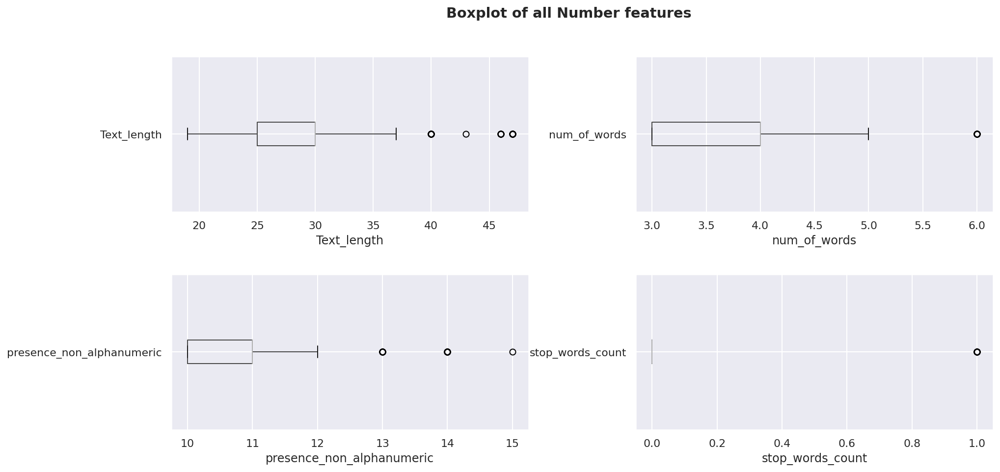

In [ ]:
reports = show_reports(converted_data,parameter=['style'])

That is what we want.

## 1.4. Answer the following questions:
Before we doing those questions, we need to alter our dataset a bit.

### 1.4.0.1 Data Preparation

In [ ]:
converted_data = convert_pipeline.fit_transform(raw_data.copy())

IQR = 112.0 - 21.0 = 91.0
MAX = 248.5
Min is 0
Num of min outliers:  0
Num of max outliers:  109577
Num of negative outliers:  0
Num of the original data set's whole instance 994181
Rate of purged data/total data 0.11021836064056746


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:101: FutureWarning: The default value of regex will change from True to False in a future version.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:105: FutureWarning: The default value of regex will change from True to False in a future version.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:432: FutureWarning: The default value of regex will change from True to False in a future version.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:434: FutureWarning: The default value of regex will change from True to False in a future version.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:435: FutureWarning: The default value of regex will change from True to False in a future version.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:436: FutureWarning: The default value of regex will change from True to False in a future version.


In [ ]:
converted_data.to_csv('purged_data.csv')

In [ ]:
converted_data.columns

Index(['verified', 'style', 'reviewerName', 'reviewText', 'summary', 'score'], dtype='object')

In [ ]:
converted_data.head()

,verified,style,reviewerName,reviewText,summary,score
0,0,Kindle Edition,Rub Chicken,Book starts out with some really interesting i...,with some really interesting ideas and gets c...,2
1,1,Hardcover,BluegrassAnne,was a gift for someone he loved it,he loved,5
2,1,Kindle Edition,Reader in the Pacific,I have read a number of Murakami novels and th...,Hollow Man,4
4,0,Kindle Edition,J Williams,Great story Highly recommended,Five Stars,5
5,1,Hardcover,Noraxpat,I passed this book on to someone who was more ...,OK FOR INTRO TO PERSONAL FINANCE,3


In [ ]:
converted_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 884604 entries, 0 to 999999
Data columns (total 6 columns):
 #   Column        Non-Null Count   Dtype 
---  ------        --------------   ----- 
 0   verified      884604 non-null  int64 
 1   style         884604 non-null  string
 2   reviewerName  884604 non-null  string
 3   reviewText    884604 non-null  string
 4   summary       884604 non-null  string
 5   score         884604 non-null  Int64 
dtypes: Int64(1), int64(1), string(4)
memory usage: 48.1 MB


In [ ]:
converted_data = pd.read_csv('/content/drive/MyDrive/A3/purged_data.csv')
converted_data = converted_data.drop('Unnamed: 0', axis=1) # old index is useless now. drop it

Before we doing any analysis, we first need to remove the stop words.

In [ ]:
from nltk.corpus import stopwords
stop_words = stopwords.words('english')

In [ ]:
len(stop_words)

179

We can see there are 179 stop words from nltk.corpus

In [ ]:
# print first 5
stop_words[:20]

['i',
 'me',
 'my',
 'myself',
 'we',
 'our',
 'ours',
 'ourselves',
 'you',
 "you're",
 "you've",
 "you'll",
 "you'd",
 'your',
 'yours',
 'yourself',
 'yourselves',
 'he',
 'him',
 'his']

We will first transfer all charater to lower case and remove the stop words.

In [ ]:
#--------------remove_stop_words-------------
def remove_stop_words(data, stop_words):
  feature = data.select_dtypes(exclude="number").columns
  for i in range(len(feature)):
      print("Now it's removing stop words from ", feature[i])
      # remove stop words
      # first change all character to lower case
      data[feature[i]] = data[feature[i]].str.lower()
      data[feature[i]] = data[feature[i]].apply(lambda x: ' '.join([word for word in x.split() if word not in (stop_words)]))
  return data 

In [ ]:
converted_data_no_stop_words = remove_stop_words(converted_data,stop_words)

Now it's removing stop words from  style
Now it's removing stop words from  reviewerName
Now it's removing stop words from  reviewText
Now it's removing stop words from  summary


In [ ]:
converted_data_copy = converted_data_no_stop_words.copy()

In [ ]:
converted_data_no_stop_words.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 884604 entries, 0 to 999999
Data columns (total 6 columns):
 #   Column        Non-Null Count   Dtype 
---  ------        --------------   ----- 
 0   verified      884604 non-null  int64 
 1   style         884604 non-null  object
 2   reviewerName  884604 non-null  object
 3   reviewText    884604 non-null  object
 4   summary       884604 non-null  object
 5   score         884604 non-null  Int64 
dtypes: Int64(1), int64(1), object(4)
memory usage: 48.1+ MB


In [ ]:
converted_data_no_stop_words.to_csv('no_stop_words_data.csv')

In [ ]:
# def a function to draw the Bar plot
#----------------plot_frequenct_words_bar-------------------
def plot_frequenct_words_bar(data, figsize = (15,10), name = 'style'):
  fig, ax = plt.subplots(figsize = figsize)
  data.plot.bar(ax = ax)
  ax.set_title("Most frequent 50 words' distribution of " + str(name))
  ax.set_ylabel('Counts')

In [ ]:
# def a function to get the report
#------------------frequent_words_reports---------------------
def frequent_words_reports(data, feature = 'style'):
  max_print_out(True)
  frequent_words = data[feature].str.split(expand=True).stack().value_counts().head(50) # get value accounts for words
  frequent_words = pd.DataFrame(frequent_words)
  plot_frequenct_words_bar(frequent_words)
  return frequent_words

Load our prepared no stop words datasets.


In [ ]:
converted_data_no_stop_words = pd.read_csv('/content/drive/MyDrive/A3/no_stop_words_data.csv')
converted_data_no_stop_words = converted_data_no_stop_words.drop('Unnamed: 0', axis=1) # old index is useless now. drop it
converted_data_no_stop_words = converted_data_no_stop_words.convert_dtypes()
converted_data_no_stop_words = converted_data_no_stop_words.fillna('empty')
converted_data_no_stop_words.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 884604 entries, 0 to 884603
Data columns (total 6 columns):
 #   Column        Non-Null Count   Dtype 
---  ------        --------------   ----- 
 0   verified      884604 non-null  Int64 
 1   style         884604 non-null  string
 2   reviewerName  884604 non-null  string
 3   reviewText    884604 non-null  string
 4   summary       884604 non-null  string
 5   score         884604 non-null  Int64 
dtypes: Int64(2), string(4)
memory usage: 42.2 MB


### 1.4.0.2 Word Report Function

1 Million instances are just too big.

We need to write our own data structure to get the results.

By using dictionaries.

If exits then add 1, if not then initialize with 1. Simple.

In [ ]:
converted_data_no_stop_words.columns

Index(['verified', 'style', 'reviewerName', 'reviewText', 'summary', 'score'], dtype='object')

In [ ]:
#--------------- get_words_reports-------------
from tqdm.notebook import tqdm
def get_words_dictionary(data, column_number = 3):
  # initialize dictionary
  words_dictionary = {}
  # loop all instances 
  for i in tqdm(range(len(data))):
    # get text from each instances
    text_array  = data.iloc[i, column_number]
    # get words
    for text in text_array.split():
      # if the word doesn't exits in dictionary then set number to 1
      if words_dictionary.get(text) == None:
        words_dictionary[text] = 1
      # if the word alreadt exits, then add number 1
      else:
        words_dictionary[text] = words_dictionary.get(text) + 1 
  return words_dictionary

In [ ]:
#-------------words_frequency_report--------------
def words_frequency_report(data, feature = 'reviewText',show_all=False,fig_size = (15,10)):
  # get column number
  column_number = data.columns.get_loc(feature)
  print("Start getting word reports by ", feature)
  words_dictionary = get_words_dictionary(data, column_number)
  print("### Finish get the words report")
  # get report 
  report = pd.DataFrame.from_dict(words_dictionary, orient='index')
  report.columns = ['counts']
  print("Load into Pandas dataFrame")
  # sort report
  report = report.sort_values(by=['counts'],  ascending=False)
  print("Sorting DataFrame")
  # decide if print all
  if show_all:
    report_head = report
  else:    
    # get first 50 columns
    report_head = report.head(50)

  print("Get report's top 50 words\nStart plotting")
  # plot setting
  fig, ax = plt.subplots(figsize = fig_size)
  report_head.plot.barh(ax = ax)

  if show_all:
      ax.set_title("Distribution of " + str(feature))
  else:  
    ax.set_title("Most frequent 50 words' distribution of " + str(feature))
  ax.set_xlabel('Counts')
  ax.set_ylabel('Words')
  plt.gca().invert_yaxis()
  return report

### 1.4.1 Distribution of the top 50 most frequent words

#### ***1. style***

We do something unsual in style exclusively. We know that our type of book is style. And no matter how many words they have in one instance, they actually mean one type of reading materials.

Hence, in case we get something like Kindle or Edition as two words, we delete 'space' in each instances' style feature and combine all words as one.

In [ ]:
copy = converted_data_no_stop_words.copy()

In [ ]:
converted_data_no_stop_words = copy.copy()

In [ ]:
# we recover the words with capitalized format
converted_data_no_stop_words['style'] = converted_data_no_stop_words['style'].str.upper()

Start getting word reports by  style


  0%|          | 0/884604 [00:00<?, ?it/s]

### Finish get the words report
Load into Pandas dataFrame
Sorting DataFrame
Get report's top 50 words
Start plotting


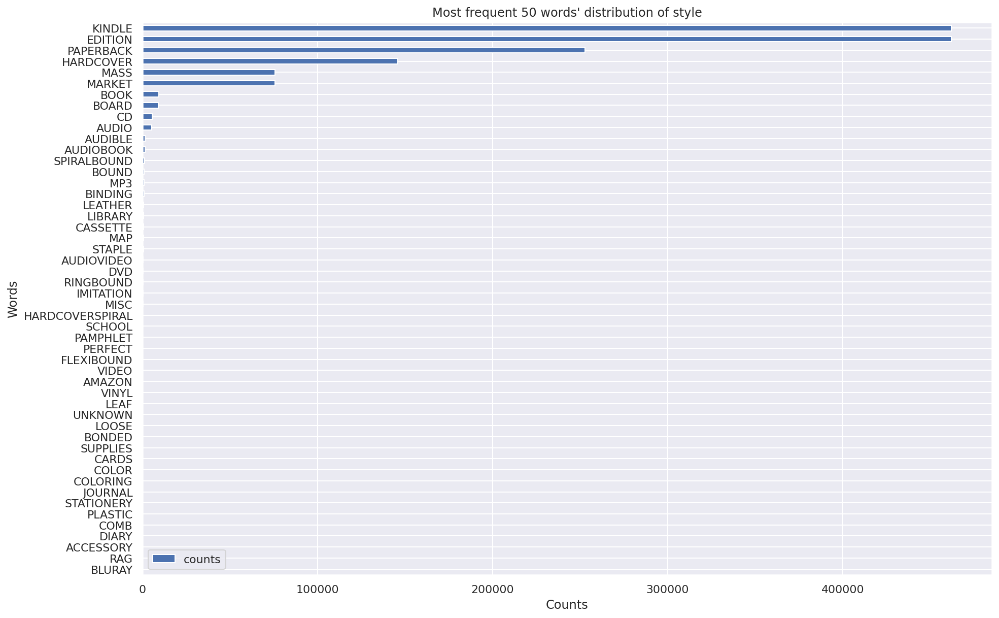

In [ ]:
style_frequent_words = words_frequency_report(converted_data_no_stop_words.copy(), 'style')

We can see we actually get the result of "Edition" as the second top frequent used word. But Edition actually is part of "Kindle Edition" by the most frequent type of Format.

We will handle this later in question ii by remove the space in every format instance to make those words as one word.

In [ ]:
style_frequent_words.head(10)

,counts
kindle,462031
edition,462031
paperback,252899
hardcover,145751
mass,75837
market,75837
book,9326
board,9173
cd,5455
audio,5212


#### ***2. Review Text***

Start getting word reports by  reviewText


  0%|          | 0/884604 [00:00<?, ?it/s]

### Finish get the words report
Load into Pandas dataFrame
Sorting DataFrame
Get report's top 50 words
Start plotting


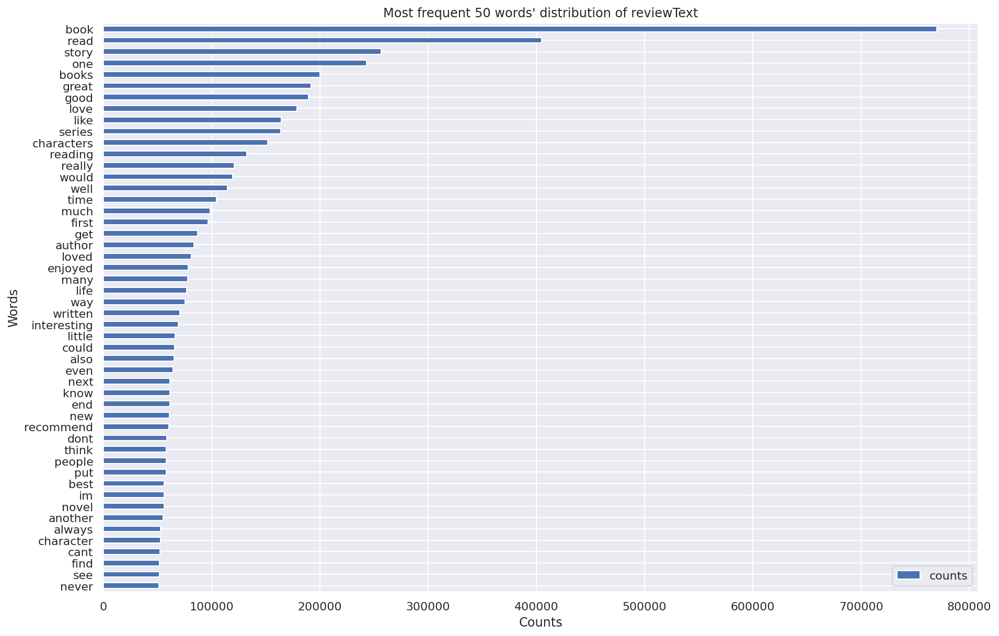

In [ ]:
reviewText_frequent_words = words_frequency_report(converted_data_no_stop_words.copy(), 'reviewText')

We can see that we still can enlarge our stop_words array.

Since the top frequent word is book, which is not really useful.

And the top 5 are book, read, one, books and great.
Actually great is a good word.

We will deal this later.

In [ ]:
reviewText_frequent_words.head(10)

,counts
stars,137083
book,99613
five,97653
great,83670
read,81271
good,63601
love,32858
story,31925
four,25027
series,24838


#### ***3. summary***

Start getting word reports by  summary


  0%|          | 0/884604 [00:00<?, ?it/s]

### Finish get the words report
Load into Pandas dataFrame
Sorting DataFrame
Get report's top 50 words
Start plotting


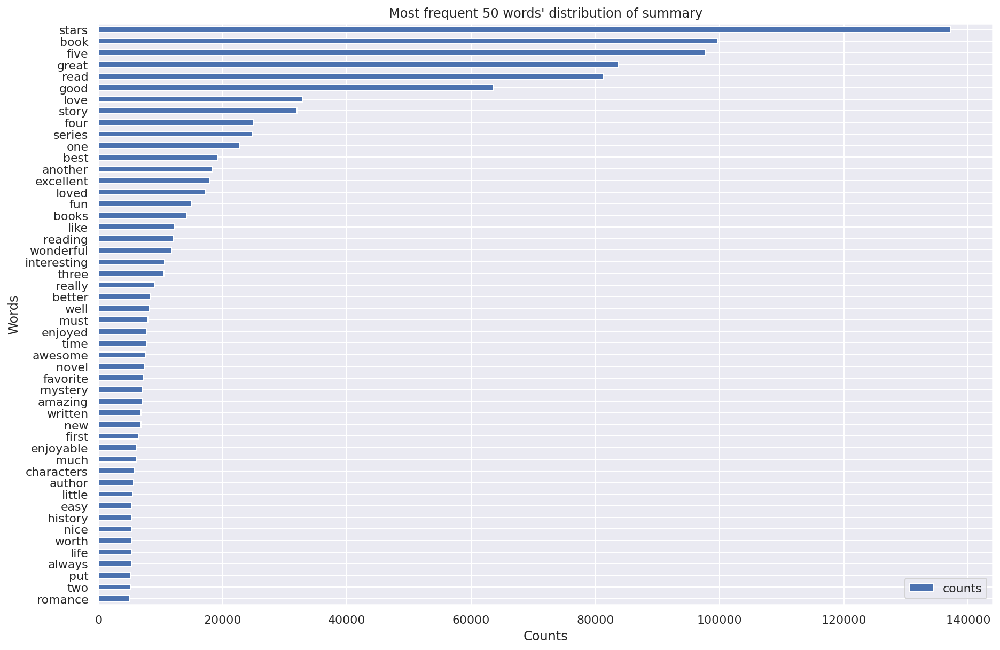

In [ ]:
reviewText_frequent_words = words_frequency_report(converted_data_no_stop_words.copy(), 'summary')

This seems like much useful. Five, stars, good, great, love, those are all good words for high score.



#### ***4. reviewerName***

Start getting word reports by  reviewerName


  0%|          | 0/884604 [00:00<?, ?it/s]

### Finish get the words report
Load into Pandas dataFrame
Sorting DataFrame
Get report's top 50 words
Start plotting


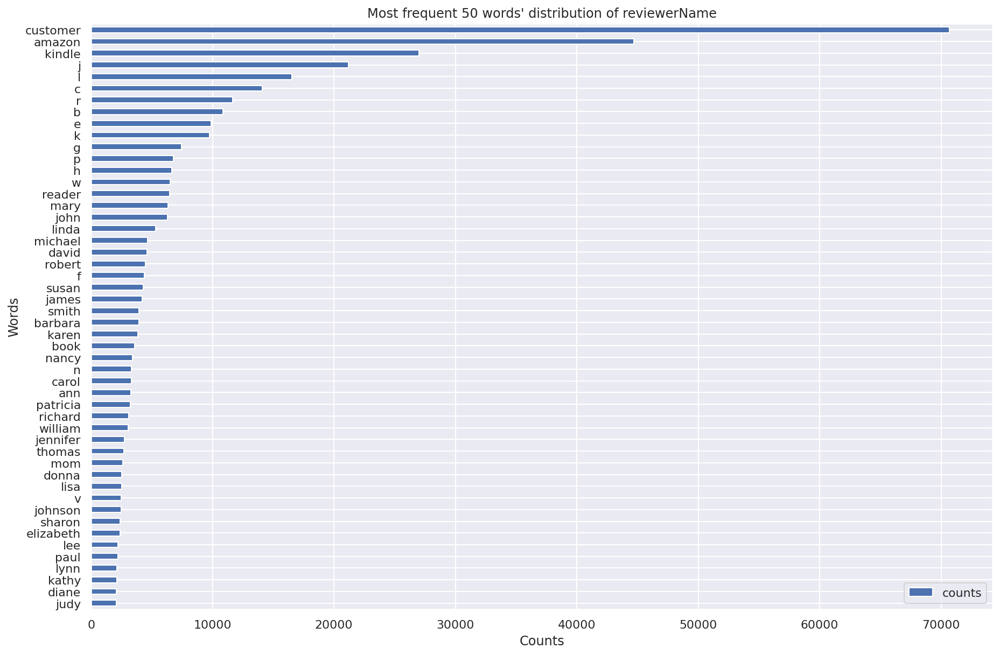

In [ ]:
reviewText_frequent_words = words_frequency_report(converted_data_no_stop_words.copy(), 'reviewerName')

### 1.4.2 Proportion of each format
We reuse our words report function but this time we draw all the words we get.

But first we remove the space in every instance. To make every format as one word.

In [ ]:
converted_data_no_stop_words['style'] = converted_data_no_stop_words['style'].str.replace(' ', '')

Start getting word reports by  style


  0%|          | 0/884604 [00:00<?, ?it/s]

### Finish get the words report
Load into Pandas dataFrame
Sorting DataFrame
Get report's top 50 words
Start plotting


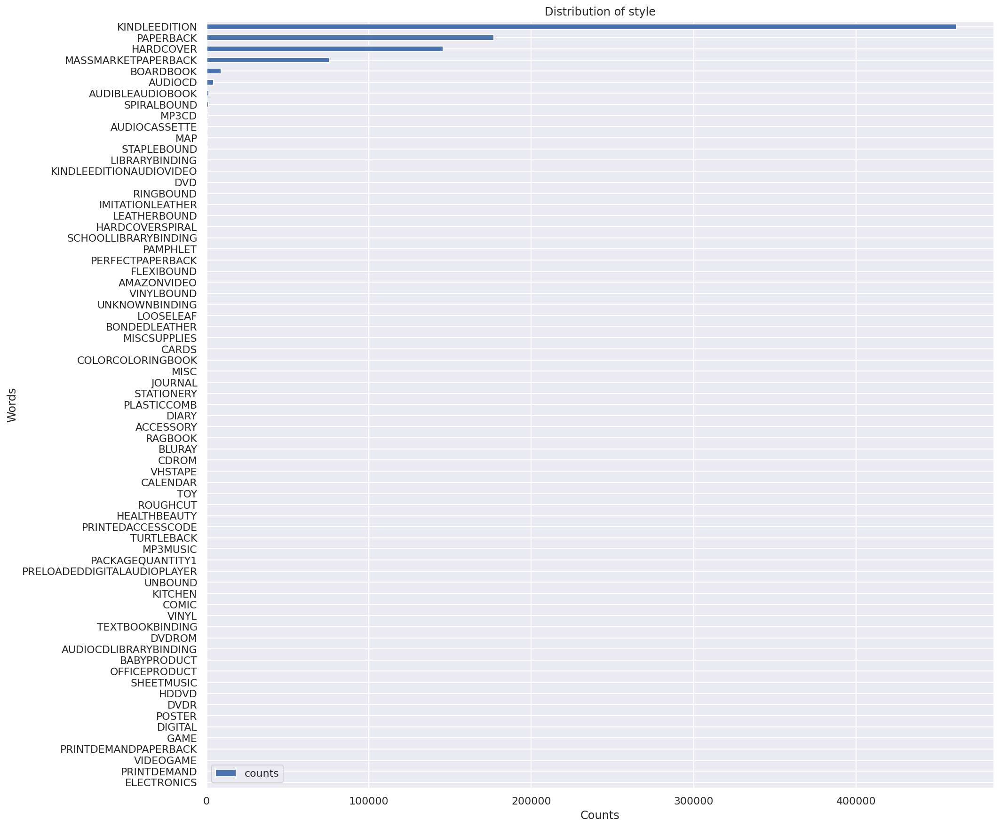

In [ ]:
style_format_report = words_frequency_report(converted_data_no_stop_words, 'style', show_all=True, fig_size = (15,15))

Now, we calculate its proportion.

In [ ]:
# First we print all formats' counts
style_format_report

,counts
KINDLEEDITION,461558
PAPERBACK,176902
HARDCOVER,145751
MASSMARKETPAPERBACK,75837
BOARDBOOK,9173
AUDIOCD,4528
AUDIBLEAUDIOBOOK,1484
SPIRALBOUND,1234
MP3CD,922
AUDIOCASSETTE,669


In [ ]:
style_format_proportion = style_format_report.div(style_format_report.sum()) # divide by the summation of all format

Now, draw the proportion graph.

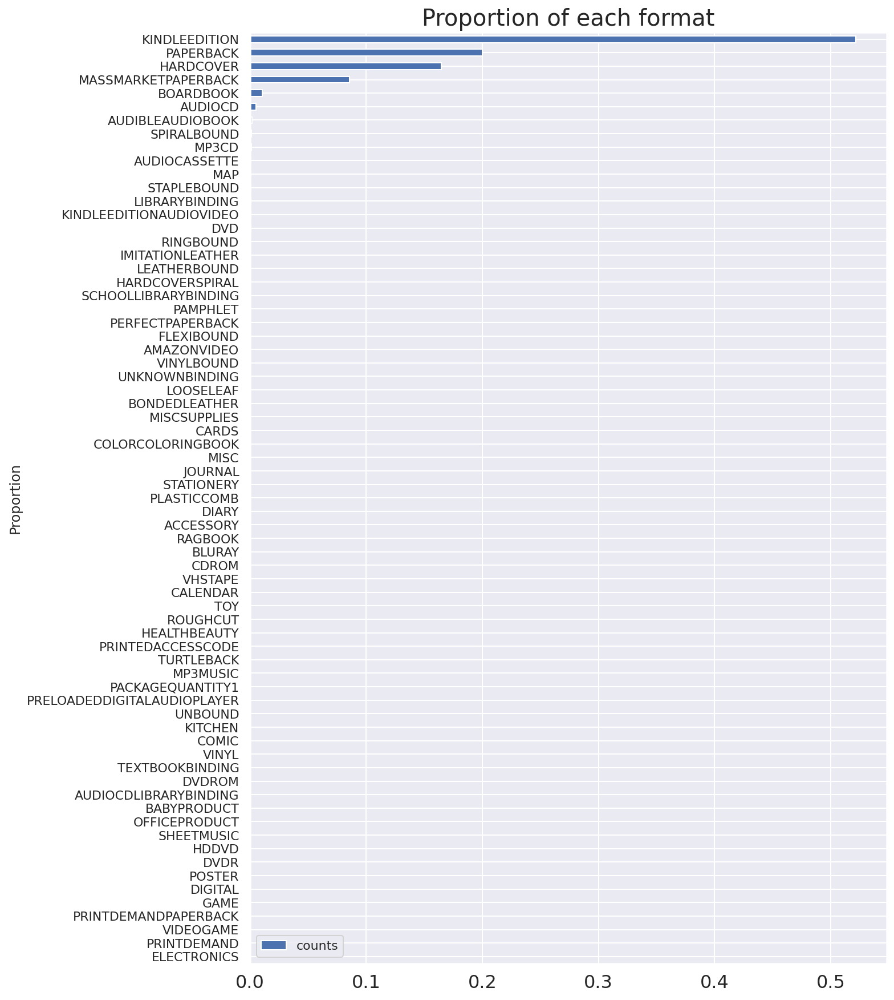

In [ ]:
fig,ax = plt.subplots(figsize=(10,15))
style_format_proportion.plot.barh(ax=ax)
ax.set_title("Proportion of each format", fontsize=20)
ax.set_ylabel('Proportion')
plt.xticks(fontsize=16);
plt.gca().invert_yaxis()

We can see there are almost 50% format is Kindle Edition.

Proportion data frame:

In [ ]:
max_print_out(True)
style_format_proportion

,counts
KINDLEEDITION,0.52
PAPERBACK,0.20
HARDCOVER,0.16
MASSMARKETPAPERBACK,0.09
BOARDBOOK,0.01
AUDIOCD,0.01
AUDIBLEAUDIOBOOK,0.00
SPIRALBOUND,0.00
MP3CD,0.00
AUDIOCASSETTE,0.00


Except the top a few formats, the other format become 0% proportion.

By the counts table, we can see some of them are only 1 or 2 instances in the dataset, they are really rare.

We print the proportion of the not very frequent use format.

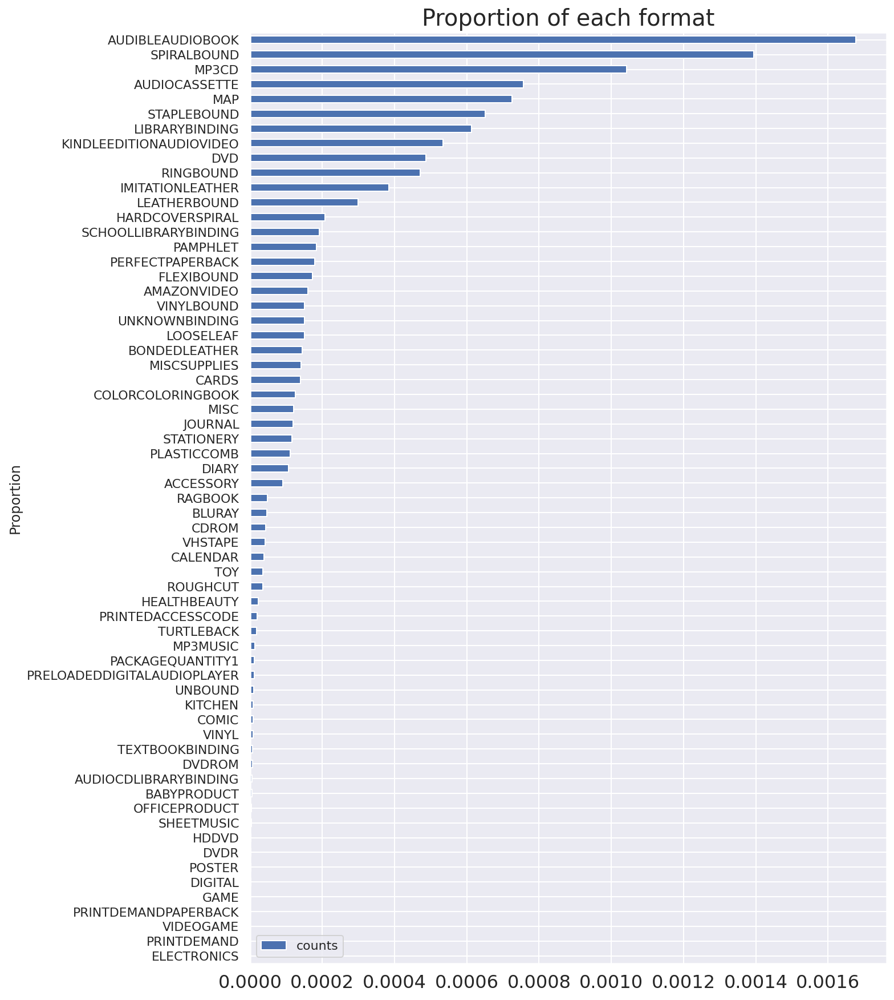

In [ ]:
fig,ax = plt.subplots(figsize=(10,15))
style_format_proportion.iloc[6:, :].plot.barh(ax=ax)
ax.set_title("Proportion of each format", fontsize=20)
ax.set_ylabel('Proportion')
plt.xticks(fontsize=16);
plt.gca().invert_yaxis()

### 1.4.3 Most/Least common format
First we replot the proportion graph.

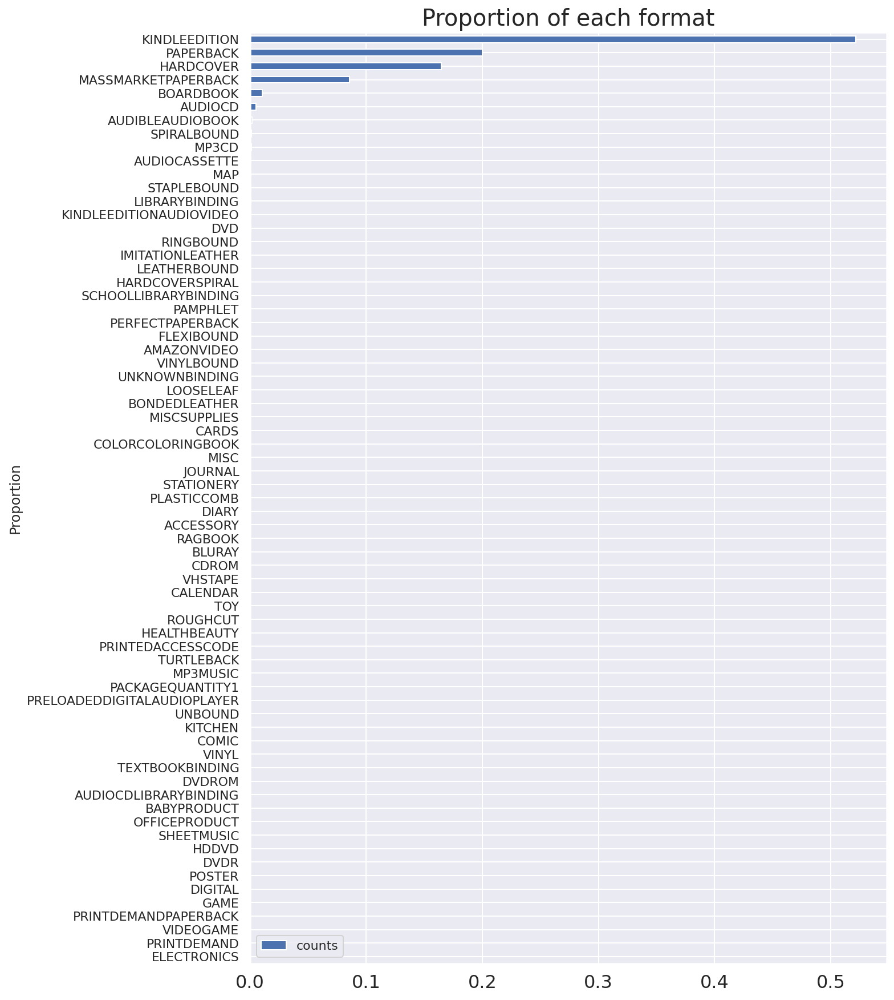

In [ ]:
fig,ax = plt.subplots(figsize=(10,15))
style_format_proportion.plot.barh(ax=ax)
ax.set_title("Proportion of each format", fontsize=20)
ax.set_ylabel('Proportion')
plt.xticks(fontsize=16);
plt.gca().invert_yaxis()

We can see The Most common format of the books is Kindle Edition.

In [ ]:
style_format_proportion.head(1).index

array(['KINDLEEDITION'], dtype=object)

We can see The Least common format of the books is Electronics.

Acutaully, that is not really a book format, we can say print demand is the least common book format.

In [ ]:
style_format_proportion.tail(1).index

Index(['ELECTRONICS'], dtype='object')

### 1.4.4 Data Patterns

#### ***1. Most common 6 types of format has same distribution in scores.***

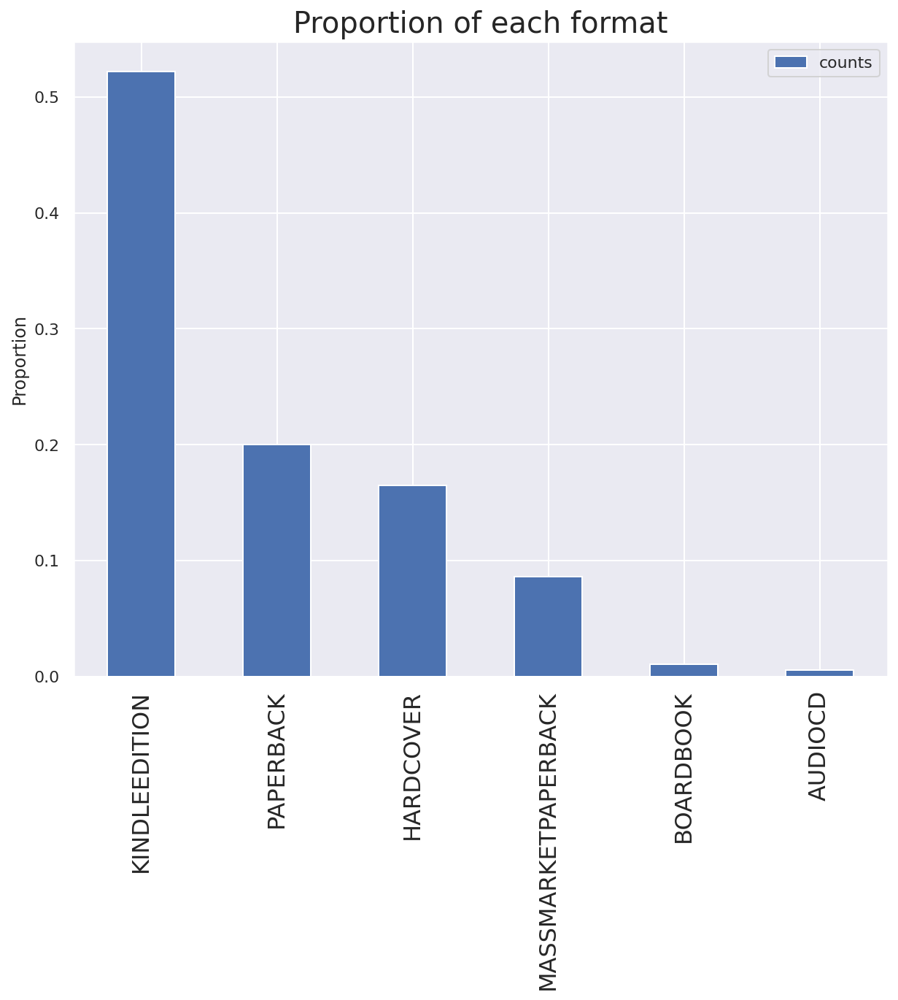

In [ ]:
fig,ax = plt.subplots(figsize=(10,8))
style_format_proportion.iloc[:6,:].plot.bar(ax=ax)
ax.set_title("Proportion of each format", fontsize=20)
ax.set_ylabel('Proportion')
plt.xticks(fontsize=16);

We can see that Kindle Edition are the best seller.

Then following up with PaperBack and Hardcover. People buy paperback since paperback format is cheaper. And it's interesting to see that almost same proportion of hardcover book are sold as well.

And the next one is Mass Paperback book.
> What Is a Mass Market Paperback? A mass market paperback book (MMPB), or simply mass paperback, is a mass-produced book that is typically small with thin paper covers and relatively low-quality pages to keep printing costs down. Bestsellers are often printed as mass market paperbook books for wide distribution [Masterclass](https://www.masterclass.com/articles/mass-market-paperback)


Small books are also sold well. 

Those four format of book are contributed almost all reviews. 

***We would like to see the overall score in each format book.***

In [ ]:
style_format_proportion.head(6)

,counts
KINDLEEDITION,0.52
PAPERBACK,0.20
HARDCOVER,0.16
MASSMARKETPAPERBACK,0.09
BOARDBOOK,0.01
AUDIOCD,0.01


In [ ]:
def draw_plot(results):
  fig, ax = plt.subplots(1,2,figsize=(15,8))
  sns.boxplot(data=results, ax = ax[0])
  ax[0].set_ylabel('Scores')
  ax[0].set_title('Boxplot of scores')
  sns.histplot(data=results, ax = ax[1])
  ax[1].set_title('Historgram of scores')

##### ***1. Kindle format over all score***

In [ ]:
kindle_book_review = converted_data_no_stop_words[converted_data_no_stop_words['style'] == 'KINDLEEDITION']

In [ ]:
kindle_book_review.head()

,verified,style,reviewerName,reviewText,summary,score
0,0,KINDLEEDITION,rub chicken,book starts really interesting ideas gets cree...,really interesting ideas gets creepy boring go,2
2,1,KINDLEEDITION,reader pacific,read number murakami novels seem follow hollow...,hollow man,4
3,0,KINDLEEDITION,j williams,great story highly recommended,five stars,5
5,1,KINDLEEDITION,thomas elwood,gave son lawyer worked washington dcwe loved i...,must reading lawyers practicing big cities cli...,5
7,0,KINDLEEDITION,patti,great read unexpected turns 60 plus relate ins...,unexpected,4


In [ ]:
print("People who read kindle give average", round(kindle_book_review['score'].mean(),2), " scores")

People who read kindle give average 4.35  scores


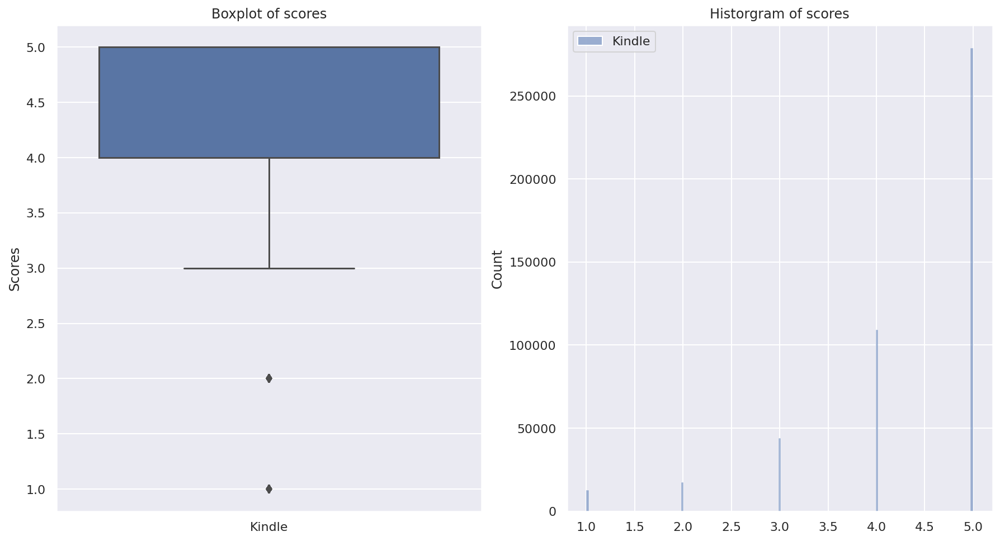

In [ ]:
kindle_score = pd.DataFrame(kindle_book_review['score'])
kindle_score.columns = ['Kindle']
draw_plot(kindle_score)

##### ***2. Paperback format over all score***

In [ ]:
paperback_review = converted_data_no_stop_words[converted_data_no_stop_words['style'] == 'PAPERBACK']

In [ ]:
print("People who read paperback give average", round(paperback_review['score'].mean(),2), " scores")

People who read paperback give average 4.4  scores


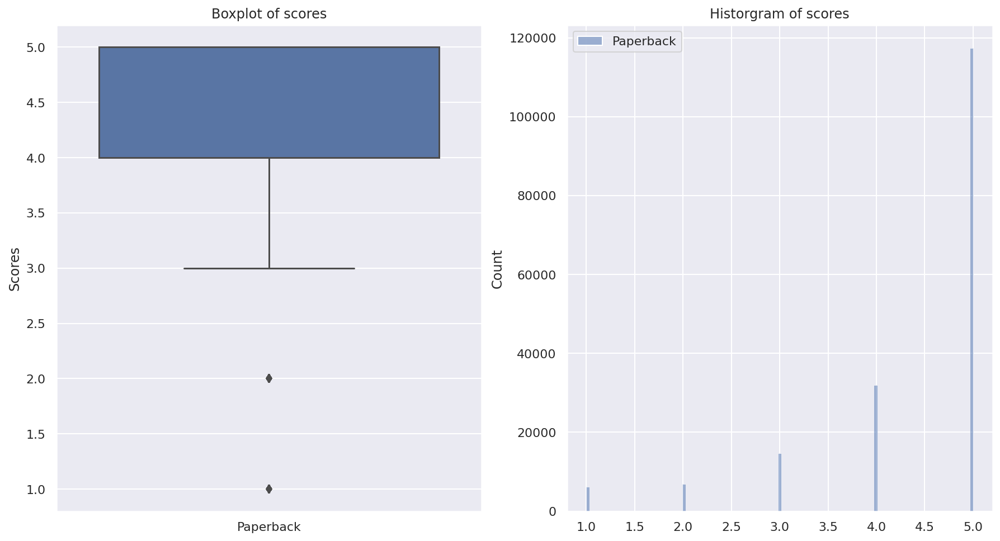

In [ ]:
paperback_score = pd.DataFrame(paperback_review['score'])
paperback_score.columns = ['Paperback']
draw_plot(paperback_score)

##### ***3. Hardback format over all score***

In [ ]:
HARDBACK_review = converted_data_no_stop_words[converted_data_no_stop_words['style'] == 'HARDCOVER']
print("People who read paperback give average", round(HARDBACK_review['score'].mean(),2), " scores")

People who read paperback give average 4.32  scores


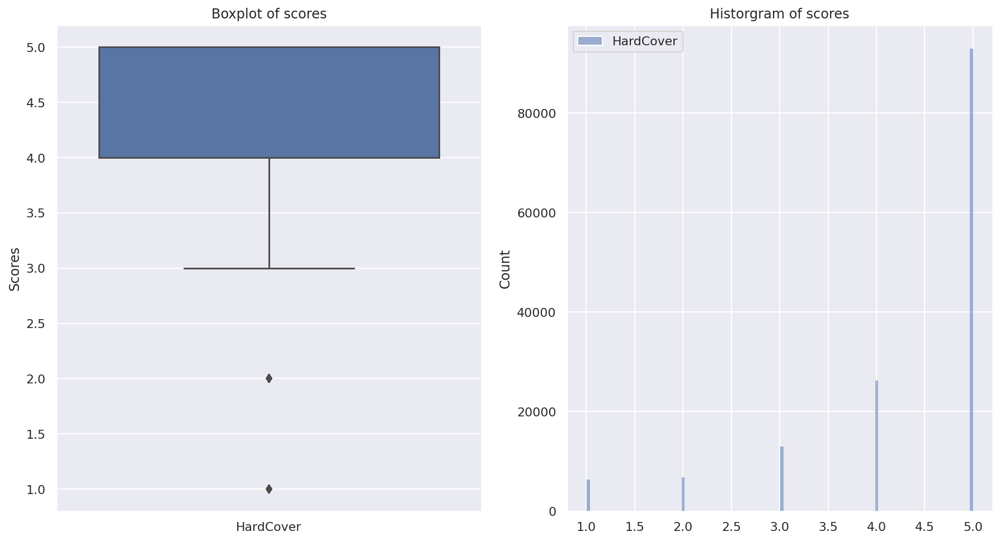

In [ ]:
HARDBACK_score = pd.DataFrame(HARDBACK_review['score'])
HARDBACK_score.columns = ['HardCover']
draw_plot(HARDBACK_score)

In [ ]:
HARDBACK_score.mean()

HardCover   4.32
dtype: float64

##### ***4. Mass Market Paperback***

In [ ]:
MASSMARKETPAPERBACK_review = converted_data_no_stop_words[converted_data_no_stop_words['style'] == 'MASSMARKETPAPERBACK']
print("People who read paperback give average", round(MASSMARKETPAPERBACK_review['score'].mean(),2), " scores")

People who read paperback give average 4.26  scores


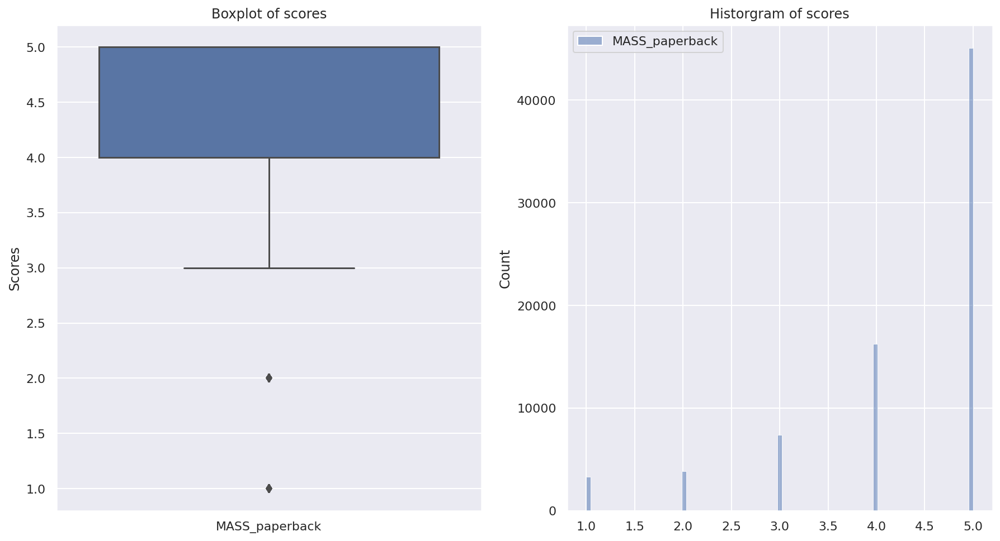

In [ ]:
MASS_paperback_score = pd.DataFrame(MASSMARKETPAPERBACK_review['score'])
MASS_paperback_score.columns = ['MASS_paperback']
draw_plot(MASS_paperback_score)

In [ ]:
MASS_paperback_score.mean()

Paperback   4.26
dtype: float64

##### ***5. Board Book***

People who read paperback give average 4.64  scores


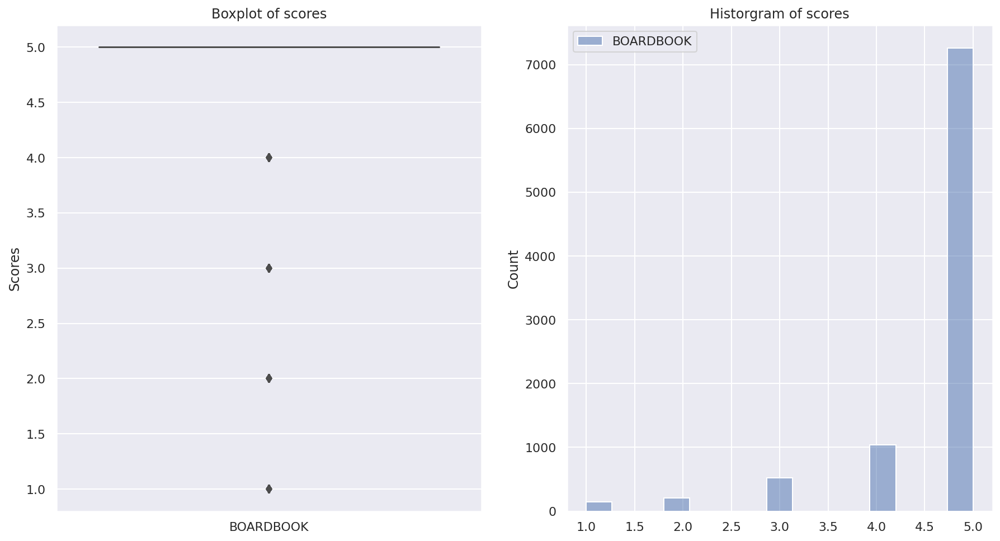

In [ ]:
boardbook_review = converted_data_no_stop_words[converted_data_no_stop_words['style'] == 'BOARDBOOK']
print("People who read paperback give average", round(boardbook_review['score'].mean(),2), " scores")
boardbook_score = pd.DataFrame(boardbook_review['score'])
boardbook_score.columns = ['BOARDBOOK']
draw_plot(boardbook_score)

##### ***6.AudioCD***

People who read paperback give average 4.39  scores


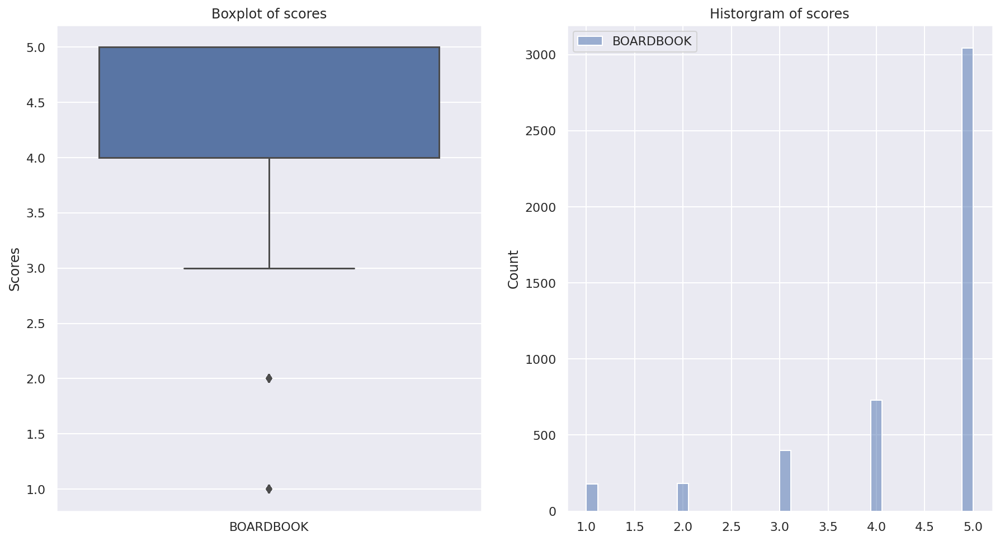

In [ ]:
AudioCD_review = converted_data_no_stop_words[converted_data_no_stop_words['style'] == 'AUDIOCD']
print("People who read paperback give average", round(AudioCD_review['score'].mean(),2), " scores")
AudioCD_score = pd.DataFrame(AudioCD_review['score'])
AudioCD_score.columns = ['BOARDBOOK']
draw_plot(AudioCD_score)

We can see that except the board Book, other format's reader give the same distribution of scores.

That means the book format probably not a very important feature.

Even Board Book has the same hitorgram look with others format.

# 2. Task 2: Text normalization and feature engineering (0.1)
1. Create a new column merging review summary and text.
2. Remove stop words.
3. Remove numbers and other non-letter characters.
4. Perform either lemmatization or stemming. Motivate your choice.
5. Convert the corpus into a bag-of-words TF-IDF weighted vector representation.


## 2.1 Create a new column merging review summary and text.

First we merge two features' data.

In [ ]:
text_data = converted_data_no_stop_words.copy()

In [ ]:
text_data.head()

,verified,style,reviewerName,reviewText,summary,score
0,0,kindle edition,rub chicken,book starts really interesting ideas gets cree...,really interesting ideas gets creepy boring go,2
1,1,hardcover,bluegrassanne,gift someone loved,loved,5
2,1,kindle edition,reader pacific,read number murakami novels seem follow hollow...,hollow man,4
3,0,kindle edition,j williams,great story highly recommended,five stars,5
4,1,hardcover,noraxpat,passed book someone interested finance suze or...,ok intro personal finance,3


In [ ]:
text_data['reviewText'].head(1)

0    book starts really interesting ideas gets cree...
Name: reviewText, dtype: string

In [ ]:
text_data['summary'].head(1)

0    really interesting ideas gets creepy boring go
Name: summary, dtype: string

In [ ]:
text_data['text'] = text_data['summary'] + " " + text_data['reviewText']

In [ ]:
text_data.head()

,verified,style,reviewerName,reviewText,summary,score,text
0,0,kindle edition,rub chicken,book starts really interesting ideas gets cree...,really interesting ideas gets creepy boring go,2,really interesting ideas gets creepy boring go...
1,1,hardcover,bluegrassanne,gift someone loved,loved,5,loved gift someone loved
2,1,kindle edition,reader pacific,read number murakami novels seem follow hollow...,hollow man,4,hollow man read number murakami novels seem fo...
3,0,kindle edition,j williams,great story highly recommended,five stars,5,five stars great story highly recommended
4,1,hardcover,noraxpat,passed book someone interested finance suze or...,ok intro personal finance,3,ok intro personal finance passed book someone ...


In [ ]:
max_print_out(True)
text_data.head(3).text.values

<StringArray>
[                           'really interesting ideas gets creepy boring go book starts really interesting ideas gets creepy boring go',
                                                                                                             'loved gift someone loved',
 'hollow man read number murakami novels seem follow hollow man idea chief characters struggles connect feel abandoned problems abound']
Length: 3, dtype: string

Done.

## 2.2. Remove stop words

We already removed stop words in previous section.

Hence, we copy the code to here.

In [ ]:
#--------------remove_stop_words-------------
def remove_stop_words(data, stop_words):
  feature = data.select_dtypes(exclude="number").columns
  for i in range(len(feature)):
      print("Now it's removing stop words from ", feature[i])
      # remove stop words
      # first change all character to lower case
      data[feature[i]] = data[feature[i]].str.lower()
      data[feature[i]] = data[feature[i]].apply(lambda x: ' '.join([word for word in x.split() if word not in (stop_words)]))
  return data 

Our data set is already free of stop words.

In [ ]:
from nltk.corpus import stopwords  
stop_words = stopwords.words('english')
text_data = remove_stop_words(text_data, stop_words)

In [ ]:
text_data.head()

,verified,style,reviewerName,reviewText,summary,score,text
0,0,KINDLEEDITION,rub chicken,book starts really interesting ideas gets cree...,really interesting ideas gets creepy boring go,2,really interesting ideas gets creepy boring go...
1,1,HARDCOVER,bluegrassanne,gift someone loved,loved,5,loved gift someone loved
2,1,KINDLEEDITION,reader pacific,read number murakami novels seem follow hollow...,hollow man,4,hollow man read number murakami novels seem fo...
3,0,KINDLEEDITION,j williams,great story highly recommended,five stars,5,five stars great story highly recommended
4,1,HARDCOVER,noraxpat,passed book someone interested finance suze or...,ok intro personal finance,3,ok intro personal finance passed book someone ...


## 2.3. Remove numbers and other non-letter characters

The following function is for removing non letter characters

In [ ]:
#--------------remove_num_non_letters-------------
def remove_num_non_letters(data):
  feature = data.select_dtypes(exclude="number").columns
  for i in range(len(feature)):
      print("Now it's removing num_non_letters from ", feature[i])
      # remove stop words
      # remove num_non_letters
      data[feature[i]] = data[feature[i]].str.replace('[^\w\s]+', '')
      data[feature[i]] = data[feature[i]].str.replace('[0-9]+', '')
  return data     


In [ ]:
text_data = remove_num_non_letters(text_data)

Now it's removing num_non_letters from  style


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: FutureWarning: The default value of regex will change from True to False in a future version.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: FutureWarning: The default value of regex will change from True to False in a future version.
  if __name__ == '__main__':


Now it's removing num_non_letters from  reviewerName
Now it's removing num_non_letters from  reviewText
Now it's removing num_non_letters from  summary
Now it's removing num_non_letters from  text


In [ ]:
text_data.head()

,verified,style,reviewerName,reviewText,summary,score,text
0,0,KINDLEEDITION,rub chicken,book starts really interesting ideas gets cree...,really interesting ideas gets creepy boring go,2,really interesting ideas gets creepy boring go...
1,1,HARDCOVER,bluegrassanne,gift someone loved,loved,5,loved gift someone loved
2,1,KINDLEEDITION,reader pacific,read number murakami novels seem follow hollow...,hollow man,4,hollow man read number murakami novels seem fo...
3,0,KINDLEEDITION,j williams,great story highly recommended,five stars,5,five stars great story highly recommended
4,1,HARDCOVER,noraxpat,passed book someone interested finance suze or...,ok intro personal finance,3,ok intro personal finance passed book someone ...


## 2.4 Perform either lemmatization or stemming. Motivate your choice.

Here we choose Lemmatization, since it will remain the words' meaning.

Instead of cut into some small pieces of word but make no sence.

In [ ]:
import nltk
from nltk.stem import PorterStemmer


w_tokenizer = nltk.tokenize.WhitespaceTokenizer()
lemmatizer = nltk.stem.WordNetLemmatizer()

ps = PorterStemmer()

def lemmatize_text(text):
  return [lemmatizer.lemmatize(w,'v') for w in w_tokenizer.tokenize(text)]

def lemmatize_dataset(data):
  tt = pd.DataFrame(data['text'])
  data['token_text'] = tt.text.apply(lemmatize_text)
  
  return data

In [ ]:
lemmatized_text_data = lemmatize_dataset(text_data)

In [ ]:
lemmatized_text_data.to_csv('lemmatized_text_data.csv')

In [ ]:
# Here we delete useless features
lemmatized_text_data = lemmatized_text_data.drop(['reviewText','summary','text','reviewerName'],axis=1)

In [ ]:
lemmatized_text_data['score'] = lemmatized_text_data.pop('score')

In [ ]:
lemmatized_text_data.head()

,verified,style,token_text,score
0,0,kindle edition,"['really', 'interest', 'ideas', 'get', 'creepy...",2
1,1,hardcover,"['love', 'gift', 'someone', 'love']",5
2,1,kindle edition,"['hollow', 'man', 'read', 'number', 'murakami'...",4
3,0,kindle edition,"['five', 'star', 'great', 'story', 'highly', '...",5
4,1,hardcover,"['ok', 'intro', 'personal', 'finance', 'pass',...",3


## 2.5 Convert the corpus into a bag-of-words TF-IDF weighted vector representation

Before we do anything, we first load our converted data from the previously stored csv file.


In [ ]:
lemmatized_text_data = pd.read_csv('/content/drive/MyDrive/A3/lemmatized_text_data.csv')
lemmatized_text_data = lemmatized_text_data.drop('Unnamed: 0', axis=1) # old index is useless now. drop it
lemmatized_text_data = lemmatized_text_data.convert_dtypes()
lemmatized_text_data = lemmatized_text_data.fillna('empty')
lemmatized_text_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 884604 entries, 0 to 884603
Data columns (total 8 columns):
 #   Column        Non-Null Count   Dtype 
---  ------        --------------   ----- 
 0   verified      884604 non-null  Int64 
 1   style         884604 non-null  string
 2   reviewerName  884604 non-null  string
 3   reviewText    884604 non-null  string
 4   summary       884604 non-null  string
 5   score         884604 non-null  Int64 
 6   text          884604 non-null  string
 7   token_text    884604 non-null  string
dtypes: Int64(2), string(6)
memory usage: 55.7 MB


In [ ]:
lemmatized_text_data.head()

,verified,style,reviewerName,reviewText,summary,score,text,token_text
0,0,kindle edition,rub chicken,book starts really interesting ideas gets cree...,really interesting ideas gets creepy boring go,2,really interesting ideas gets creepy boring go...,"['really', 'interest', 'ideas', 'get', 'creepy..."
1,1,hardcover,bluegrassanne,gift someone loved,loved,5,loved gift someone loved,"['love', 'gift', 'someone', 'love']"
2,1,kindle edition,reader pacific,read number murakami novels seem follow hollow...,hollow man,4,hollow man read number murakami novels seem fo...,"['hollow', 'man', 'read', 'number', 'murakami'..."
3,0,kindle edition,j williams,great story highly recommended,five stars,5,five stars great story highly recommended,"['five', 'star', 'great', 'story', 'highly', '..."
4,1,hardcover,noraxpat,passed book someone interested finance suze or...,ok intro personal finance,3,ok intro personal finance passed book someone ...,"['ok', 'intro', 'personal', 'finance', 'pass',..."


No we use TDIDF on text features one by one. Since, I didn't find a solution to do all of them at once.

First we do TDIDF on our token_text that are already lemmatized.

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import TfidfTransformer

# we set for max_features: as most words we saved for 500 words
# in order to not exceed our memory
v = TfidfVectorizer(stop_words='english', max_features = 500)

# get TDIDF array from token_text
x_token_text = v.fit_transform(lemmatized_text_data['token_text'])

Now we have our token TDIDF set with 500 columns.

In [ ]:
x_token_text.shape

(884604, 500)

In [ ]:
# save it into a pandas dataframe
tdidf_data = pd.DataFrame(x_token_text.toarray())

In [ ]:
tdidf_data.head()

,0,1,2,3,4,5,6,7,8,9,...,490,491,492,493,494,495,496,497,498,499
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
tdidf_data.describe()

,0,1,2,3,4,5,6,7,8,9,...,490,491,492,493,494,495,496,497,498,499
count,884604.000000,884604.000000,884604.000000,884604.000000,884604.000000,884604.000000,884604.000000,884604.000000,884604.000000,884604.000000,...,884604.000000,884604.000000,884604.000000,884604.000000,884604.00000,884604.000000,884604.000000,884604.000000,884604.000000,884604.000000
mean,0.004150,0.004611,0.002784,0.007143,0.004623,0.004318,0.002663,0.002208,0.005381,0.004411,...,0.030626,0.006202,0.002362,0.003373,0.00644,0.009179,0.002618,0.003307,0.005651,0.003538
std,0.034150,0.040591,0.032922,0.047640,0.034745,0.035308,0.031381,0.027655,0.044634,0.037704,...,0.082974,0.046754,0.029465,0.033506,0.04557,0.047719,0.029923,0.032198,0.040424,0.032685
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000
max,0.943918,1.000000,1.000000,1.000000,0.876551,1.000000,1.000000,0.909867,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,0.963821,0.924894,1.000000


Now we get the TDIDF array from style.

And we know that from previous section, there is only 6 types of style are mainly distribution in our dataset. Hence, we declare a new vectorizer and set our max_features = 8

In [ ]:
# now we get TDIDF array from style

v = TfidfVectorizer(stop_words='english', max_features = 8)
# get TDIDF array from style

x_style = v.fit_transform(lemmatized_text_data['style'])

In [ ]:
x_style.shape

(884604, 8)

In [ ]:
x_style.toarray()

array([[0.        , 0.        , 0.70710678, ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.70710678, ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        1.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        1.        ]])

Now we combine then together.

In [ ]:
tdidf_data = pd.concat([tdidf_data, pd.DataFrame(x_style.toarray())], axis = 1)

In [ ]:
tdidf_data.head()

,0,1,2,3,4,5,6,7,8,9,...,498,499,0,1,2,3,4,5,6,7
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.707107,0.0,0.707107,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,1.0,0.000000,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.707107,0.0,0.707107,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.707107,0.0,0.707107,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.000000,1.0,0.000000,0.0,0.0,0.0


Now we put the verified column and our target value back to this dataset.

In [ ]:
tdidf_data['verified'] = lemmatized_text_data['verified']
tdidf_data['score'] = lemmatized_text_data['score']

In [ ]:
tdidf_data.head()

,0,1,2,3,4,5,6,7,8,9,...,0,1,2,3,4,5,6,7,verified,score
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.707107,0.0,0.707107,0.0,0.0,0.0,0,2
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,1.0,0.000000,0.0,0.0,0.0,1,5
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.707107,0.0,0.707107,0.0,0.0,0.0,1,4
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.707107,0.0,0.707107,0.0,0.0,0.0,0,5
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,1.0,0.000000,0.0,0.0,0.0,1,3


Note, we detached the rest of features like reviewName, which isn't that important. And the review text and summary, since they both are already in the token_text. We don't need those anymore.

Since, this result is too big, we won't save it into file again.
Not write a function to generate this result.

In [ ]:
#----------------TDIDF_Data_generator---------------
def TDIDF_Data_generator(data, max_features = 500):
  from sklearn.feature_extraction.text import TfidfVectorizer
  from sklearn.feature_extraction.text import TfidfTransformer
  # we set for max_features: as most words we saved for 500 words
  # in order to not exceed our memory
  v_test = TfidfVectorizer(stop_words='english', max_features = max_features)
  v_style = TfidfVectorizer(stop_words='english', max_features = 8)
  # get TDIDF array from token_text
  x_token_text = v_test.fit_transform(data['token_text'])
  # save it into a pandas dataframe
  tdidf_data = pd.DataFrame(x_token_text.toarray(), columns = v_test.get_feature_names() )
  # get TDIDF array from style
  x_style = v_style.fit_transform(data['style'])
  tdidf_data = pd.concat([tdidf_data, pd.DataFrame(x_style.toarray(), columns = v_style.get_feature_names() )], axis = 1)
  data_copy = data.copy()
  data_copy = data_copy.reset_index() # need to reset index for matching the results
  tdidf_data['verified'] = data_copy['verified']
  tdidf_data['score'] = data_copy['score']
  return tdidf_data

We will use this function in the next chapter. Since there is no need to show the results twice.

# Task 3: Build a model to predict overall score (0.3)

## 3.1. Use score as the target variable. Explain what is the task you’re solving (e.g.,
supervised x unsupervised, classification x regression x clustering or similarity
matching x etc).

We are solving a superviesed multi-labeled classification task.

1. We have score as our target label
2. Our traget label, score, only has 5 values. We need to classify all instances into those 5 values. Hence, it is a multi-labeld classification problem.



## 3.2. Use a feature selection method to select the features to build a model.

In [ ]:
lemmatized_text_data = pd.read_csv('/content/drive/MyDrive/A3/lemmatized_text_data.csv')
lemmatized_text_data = lemmatized_text_data.drop('Unnamed: 0', axis=1) # old index is useless now. drop it
lemmatized_text_data = lemmatized_text_data.convert_dtypes()
lemmatized_text_data = lemmatized_text_data.fillna('empty')
lemmatized_text_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 884604 entries, 0 to 884603
Data columns (total 8 columns):
 #   Column        Non-Null Count   Dtype 
---  ------        --------------   ----- 
 0   verified      884604 non-null  Int64 
 1   style         884604 non-null  string
 2   reviewerName  884604 non-null  string
 3   reviewText    884604 non-null  string
 4   summary       884604 non-null  string
 5   score         884604 non-null  Int64 
 6   text          884604 non-null  string
 7   token_text    884604 non-null  string
dtypes: Int64(2), string(6)
memory usage: 55.7 MB


Now, we split the dataset first for more ability to find good features.

we take only 10% of data to do the feature selection.
As our 100K dataset.

In [ ]:
from sklearn.model_selection import train_test_split
model_data_raw, _ = train_test_split(lemmatized_text_data, test_size=0.88695, random_state=42)
# we drop reviewText and reivewName, summary and text columns, since we already have token_text and review Name is useless.
model_data_raw = model_data_raw.drop(['reviewerName', 'reviewText', 'summary', 'text'], axis = 1)
# rearange the target label feature score to the end
model_data_raw['score'] = model_data_raw.pop('score')

In [ ]:
model_data_raw.head()

,verified,style,token_text,score
744031,1,kindle edition,"['sigh', 'miss', 'claire', 'jamie', 'vague', '...",1
801184,1,kindle edition,"['remarkable', 'book', 'many', 'level', 'thoro...",5
341256,0,paperback,"['buy', 'book', 'laurel', 'hardy', 'fan', 'lov...",5
734969,0,hardcover,"['enthral', 'suspense', 'readers', 'familiar',...",4
750145,0,hardcover,"['great', 'story', 'fantastic', 'illustrations...",5


In [ ]:
model_data_raw.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 100004 entries, 744031 to 121958
Data columns (total 4 columns):
 #   Column      Non-Null Count   Dtype 
---  ------      --------------   ----- 
 0   verified    100004 non-null  Int64 
 1   style       100004 non-null  string
 2   token_text  100004 non-null  string
 3   score       100004 non-null  Int64 
dtypes: Int64(2), string(2)
memory usage: 4.0 MB


That's the final version we need.

In [ ]:
model_data = TDIDF_Data_generator(model_data_raw)

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


In [ ]:
model_data = model_data.fillna(0) # in case of losing values during the period of generating TDIDF array

In [ ]:
model_data.head()

,able,absolutely,account,action,actually,add,addition,adult,adventure,age,...,board,book,edition,hardcover,kindle,market,mass,paperback,verified,score
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.707107,0.0,0.707107,0.0,0.0,0.0,1,1
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.707107,0.0,0.707107,0.0,0.0,0.0,1,5
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,1.0,0,5
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,1.0,0.000000,0.0,0.0,0.0,0,4
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,1.0,0.000000,0.0,0.0,0.0,0,5


Split our model_data into train and test set.

In [ ]:
from sklearn.model_selection import train_test_split
training_data, test_data = train_test_split(model_data, test_size=0.3, random_state=42)

In [ ]:
# get our data set into features and labels
X_train = training_data.iloc[:,:-1]
y_train = training_data.iloc[:,-1:].values.ravel()
y_train = y_train.astype(int)
X_test = test_data.iloc[:,:-1]

First we save the feature name.

In [ ]:
features_name = X_train.loc[:,:].columns.tolist();
len(features_name)

509

Reuse our feature selection function from Assignment 2.

In [ ]:
from sklearn.feature_selection import SelectKBest

# feature selection
def select_features_prompt(X_train, y_train, X_test,function):
    # configure to select all features
    fs = SelectKBest(score_func=function, k='all')
    # learn relationship from training data
    fs.fit(X_train, y_train)
    # transform train input data
    X_train_fs = fs.transform(X_train)
    # transform test input data
    X_test_fs = fs.transform(X_test)
    # what are scores for the features

    # print features' name and score
    for i in range(len(fs.scores_)):
        print(f'Feature {i}  {features_name[i]}: { fs.scores_[i]}' )
    return fs.scores_

Get all features importances as following:

In [ ]:
from sklearn.datasets import make_classification
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_classif

fscores = select_features_prompt(X_train, y_train,X_test, f_classif)

Feature 0  able: 1.021211817925015
Feature 1  absolutely: 40.960661262266825
Feature 2  account: 1.9686474229788244
Feature 3  action: 9.882491965111663
Feature 4  actually: 16.370282632085125
Feature 5  add: 0.3697776193695684
Feature 6  addition: 5.313261749502565
Feature 7  adult: 1.8548117384507112
Feature 8  adventure: 16.041688726739654
Feature 9  age: 3.51662690826065
Feature 10  ago: 2.9454857131359007
Feature 11  agree: 22.77748538386051
Feature 12  allow: 1.0113275724829718
Feature 13  amaze: 108.83079210017185
Feature 14  american: 1.7629237669136886
Feature 15  answer: 1.8660794847072606
Feature 16  appreciate: 4.3543828066308174
Feature 17  art: 1.005418037193231
Feature 18  ask: 1.759263052499672
Feature 19  attention: 2.5160887062643873
Feature 20  author: 33.47690088150282
Feature 21  away: 7.677713727912668
Feature 22  awesome: 89.80585345376421
Feature 23  baby: 0.9120079145840939
Feature 24  background: 6.306148194352899
Feature 25  bad: 217.40073448456047
Feature 26

Save the results into a dataframe.

In [ ]:
results_df = pd.DataFrame(fscores, index=features_name , columns = ['importance'])

In [ ]:
results_df.head()

,importance
able,1.021212
absolutely,40.960661
account,1.968647
action,9.882492
actually,16.370283


We can see the original results are not sorted.

Now we sort those values by descending.

In [ ]:
results_df = results_df.sort_values(by=['importance'],ascending=False)
results_df.head(10)

,importance
waste,1064.176453
bore,879.534907
love,593.523263
great,550.203554
ok,451.491966
money,443.083826
didnt,381.508844
good,360.701074
okay,295.147177
disappoint,269.339554


It's clearly to see that waste, bore, love, great, ok, money and etc are most import features in our TFIDF vector space.
Now, we plot those as bar plot.

In [ ]:
#---------words_importance_plot---------------------
def words_importance_plot(results, fig_size = (15,10)):
  fig, ax = plt.subplots(figsize = fig_size)
  results.plot.barh(ax=ax)
  plt.gca().invert_yaxis()
  ax.set_ylabel('Importance')
  ax.set_title("Barplot of words' importance")

First we take a look at the bar plot of first 50 importance words.

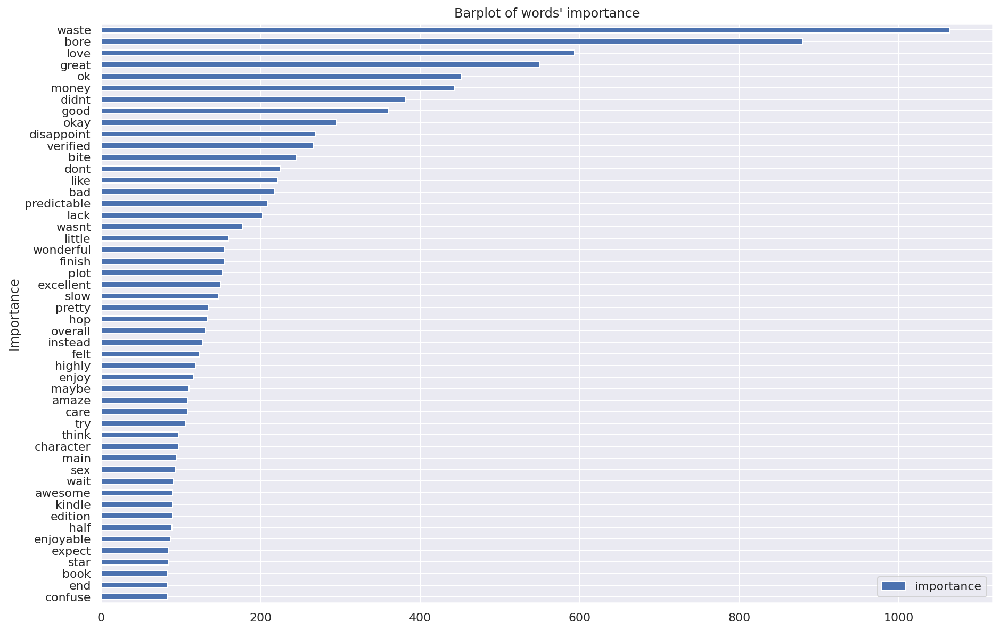

In [ ]:
words_importance_plot(results_df.head(50))

We can see that there could be more importance words.

Let's draw the bar plot of first 100 words.

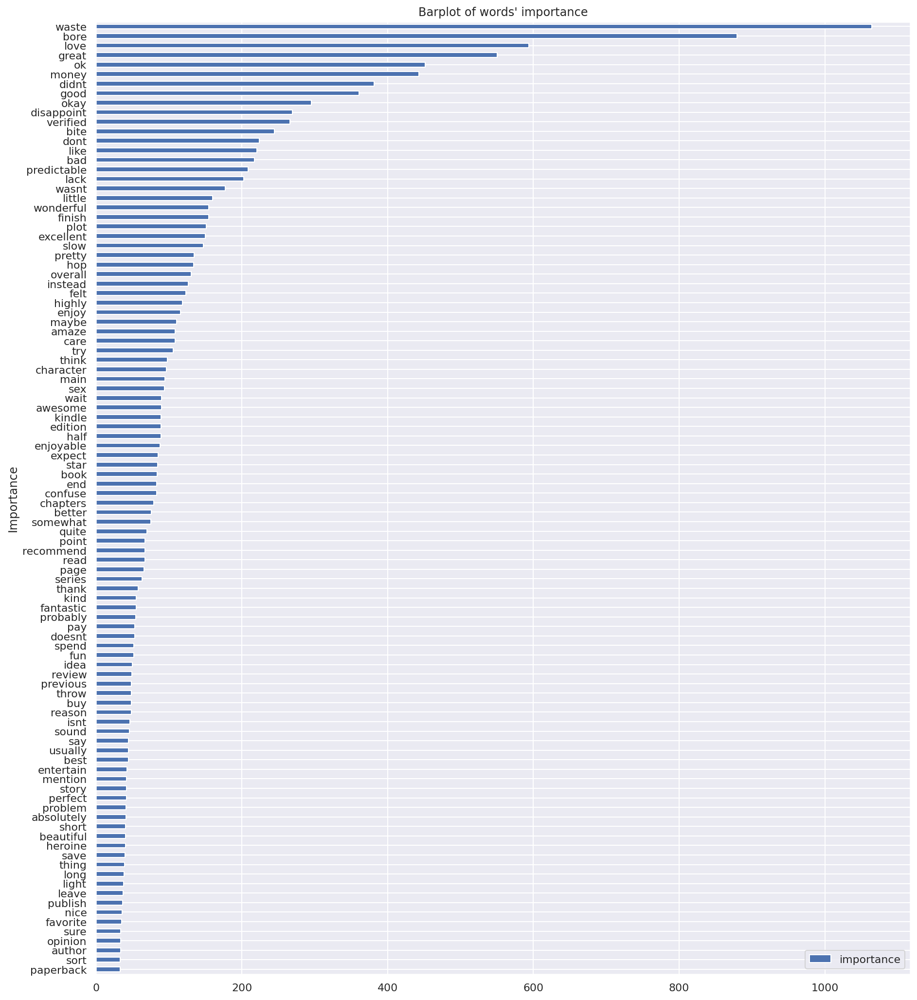

In [ ]:
words_importance_plot(results_df.head(100),fig_size=(15,18))

250 words:

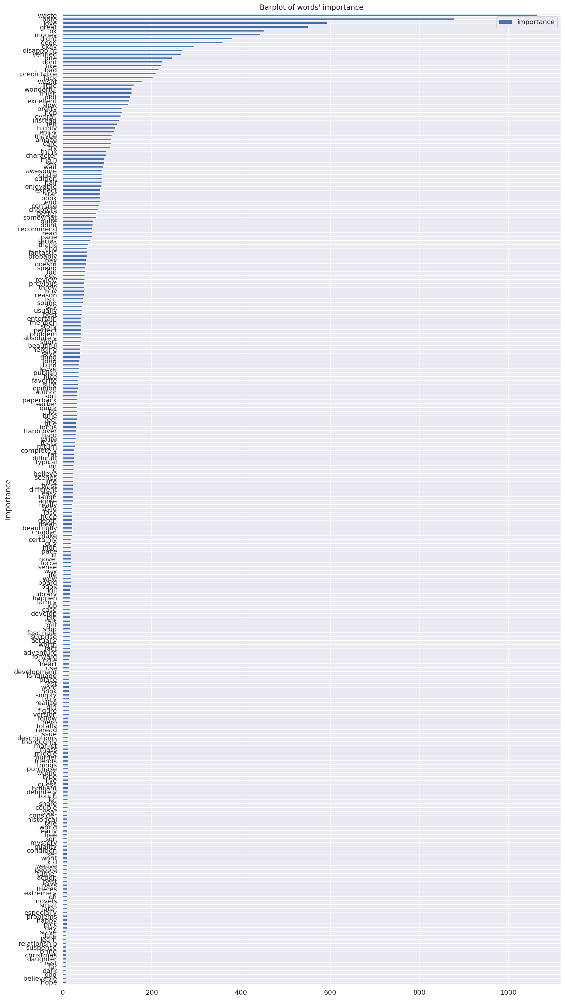

In [ ]:
words_importance_plot(results_df.head(250),  fig_size = (15,30))

Now, we can see that after a certain number of words, the importances of all words after that are not that important anymore.

Now we plot the boxplot of the result dataframe.

In [ ]:
#---------words_importance_plot---------------------
def words_importance_barplot(results, fig_size = (8,8)):
  fig, ax = plt.subplots(figsize = fig_size)
  results.boxplot(ax=ax)
  ax.set_ylabel('Importance')
  ax.set_title("Barplot of words' importance")

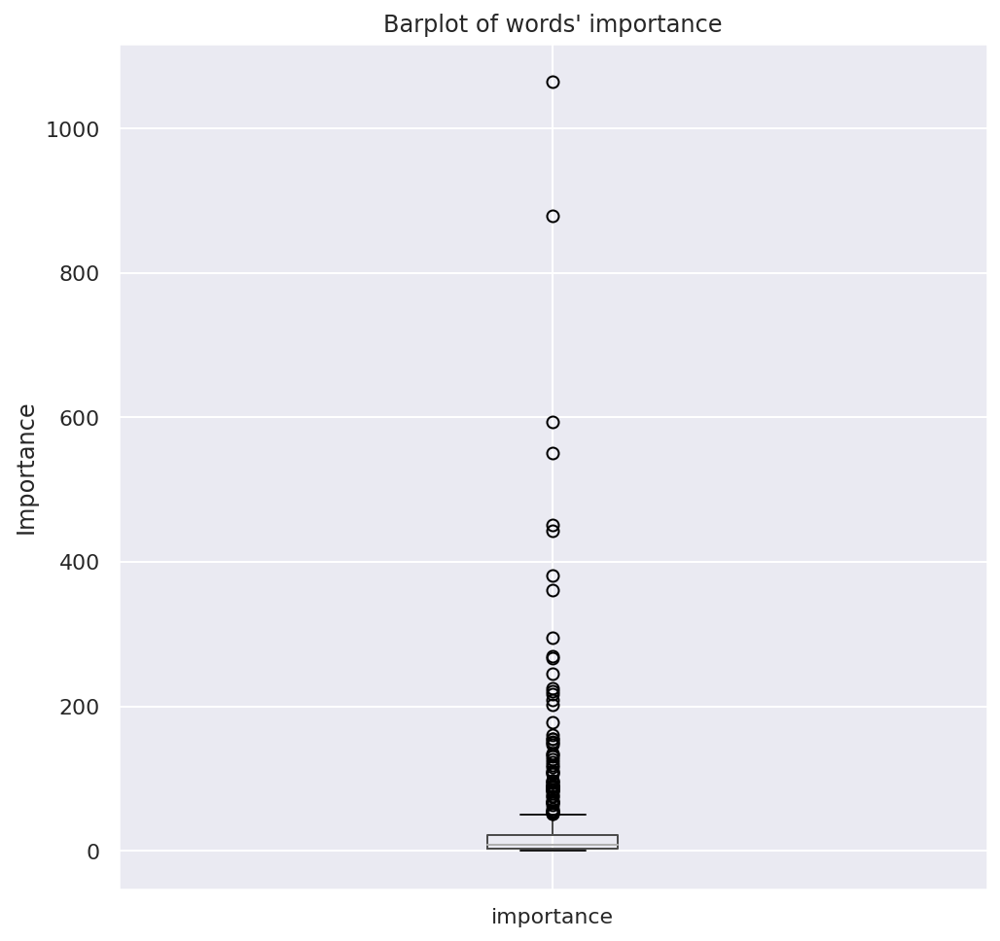

In [ ]:
words_importance_barplot(results_df)

In [ ]:
build_continuous_features_report(results_df)

,Count,Miss %,Card.,Min,1st Qrt.,Mean,Median,3rd Qrt,Max,Std. Dev.
importance,509,0.0,507,0.130014,3.042883,32.234327,7.908459,22.359549,1064.176453,87.110186


We can see that the mean importance is only 32.23, and max is 1064. 
We don't want those features with low importance. 

In [ ]:
find_outliers(results_df,'importance')

IQR = 22.35954918165135 - 3.042883322689099 = 19.31666585896225
MAX = 51.33454797009472
Min is 0
Num of min outliers:  0
Num of max outliers:  67
Num of negative outliers:  0
Num of the original data set's whole instance 509
Rate of purged data/total data 0.13163064833005894


Index(['waste', 'bore', 'love', 'great', 'ok', 'money', 'didnt', 'good',
       'okay', 'disappoint', 'verified', 'bite', 'dont', 'like', 'bad',
       'predictable', 'lack', 'wasnt', 'little', 'wonderful', 'finish', 'plot',
       'excellent', 'slow', 'pretty', 'hop', 'overall', 'instead', 'felt',
       'highly', 'enjoy', 'maybe', 'amaze', 'care', 'try', 'think',
       'character', 'main', 'sex', 'wait', 'awesome', 'kindle', 'edition',
       'half', 'enjoyable', 'expect', 'star', 'book', 'end', 'confuse',
       'chapters', 'better', 'somewhat', 'quite', 'point', 'recommend', 'read',
       'page', 'series', 'thank', 'kind', 'fantastic', 'probably', 'pay',
       'doesnt', 'spend', 'fun'],
      dtype='object')

Let's redraw the plot with any importance value larger than 51. By our find outliers function we defined before.

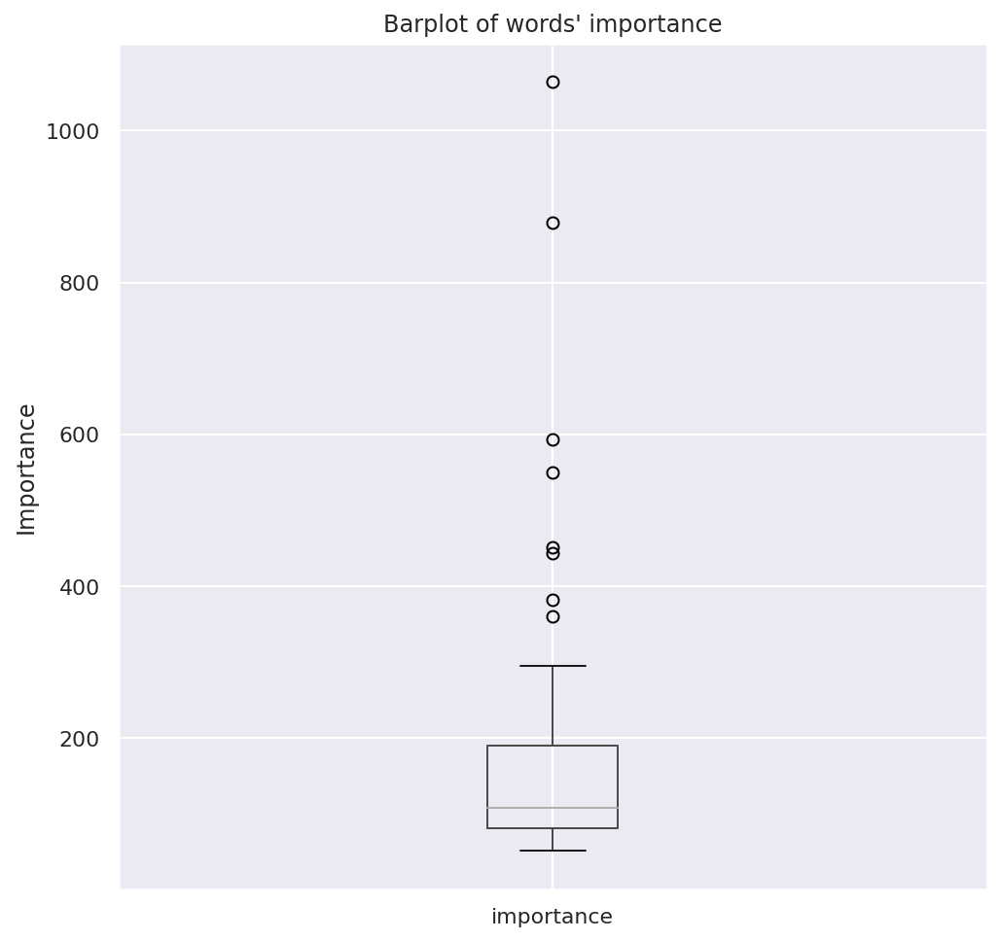

In [ ]:
words_importance_barplot(results_df[results_df['importance'] > 51])

Let's see how many of those words that importance > 51.

In [ ]:
len(results_df[results_df['importance'] > 51])

67

Only 67 features. Let's redraw the bar plot.

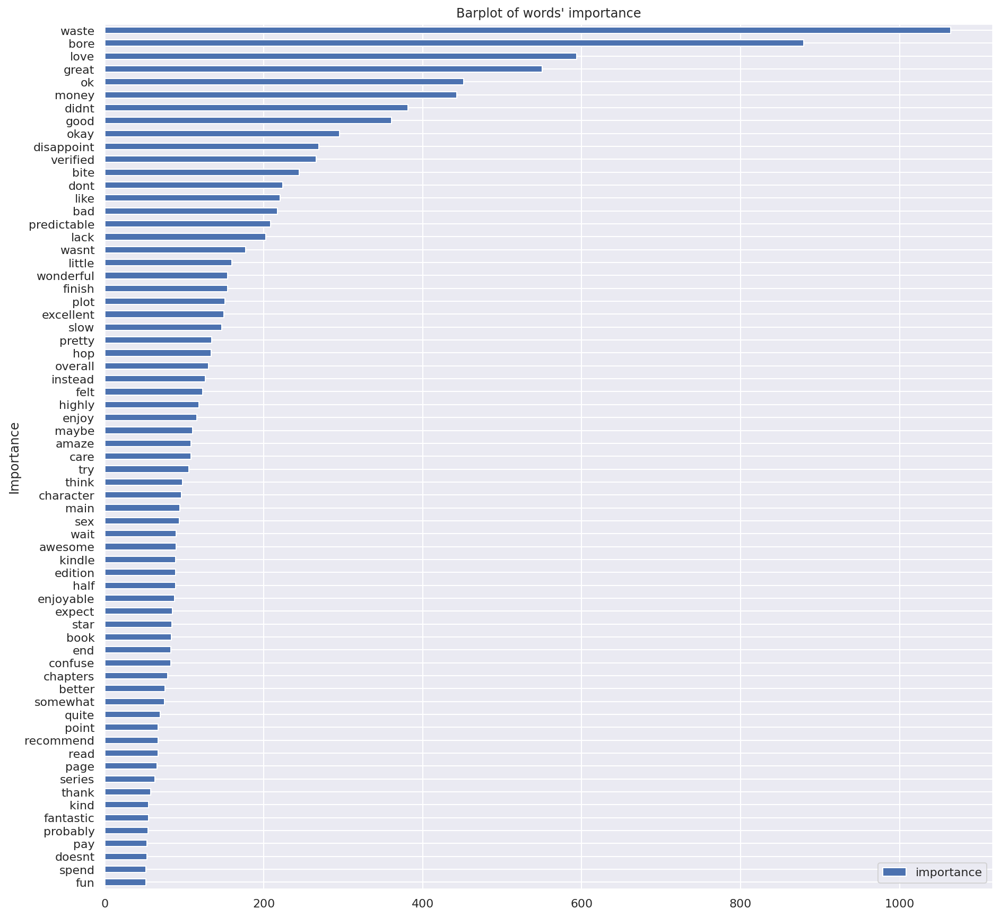

In [ ]:
words_importance_plot((results_df[results_df['importance'] > 51]),fig_size=(15,15))

Intuitively, we can see that only a few words at front is important.

However, it doesn't mean everyone would use these words in their reviewText.
If they didn't use any of words at top 10 or top 15, we have no clue what their attitude of the product is.

Hence, we must leave the most important features with some redundancy。

In the end, we will take those 67 features all, then create a new dataset.

In [ ]:
results_df[results_df['importance'] > 51].index

Index(['waste', 'bore', 'love', 'great', 'ok', 'money', 'didnt', 'good',
       'okay', 'disappoint', 'verified', 'bite', 'dont', 'like', 'bad',
       'predictable', 'lack', 'wasnt', 'little', 'wonderful', 'finish', 'plot',
       'excellent', 'slow', 'pretty', 'hop', 'overall', 'instead', 'felt',
       'highly', 'enjoy', 'maybe', 'amaze', 'care', 'try', 'think',
       'character', 'main', 'sex', 'wait', 'awesome', 'kindle', 'edition',
       'half', 'enjoyable', 'expect', 'star', 'book', 'end', 'confuse',
       'chapters', 'better', 'somewhat', 'quite', 'point', 'recommend', 'read',
       'page', 'series', 'thank', 'kind', 'fantastic', 'probably', 'pay',
       'doesnt', 'spend', 'fun'],
      dtype='object')

In [ ]:
model_data.head()

,able,absolutely,account,action,actually,add,addition,adult,adventure,age,...,board,book,edition,hardcover,kindle,market,mass,paperback,verified,score
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.707107,0.0,0.707107,0.0,0.0,0.0,1,1
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.707107,0.0,0.707107,0.0,0.0,0.0,1,5
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,1.0,0,5
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,1.0,0.000000,0.0,0.0,0.0,0,4
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,1.0,0.000000,0.0,0.0,0.0,0,5


Now, we extract all those 67 features with our target label : score.

In [ ]:
reduced_model_data = model_data.loc[:,  results_df[results_df['importance'] > 51].index]
reduced_model_data['score'] = model_data['score']
reduced_model_data.head(5)

,waste,bore,love,great,ok,money,didnt,good,okay,disappoint,...,series,thank,kind,fantastic,probably,pay,doesnt,spend,fun,score
0,0.348458,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.252675,...,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,1
1,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,...,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,5
2,0.000000,0.0,0.117233,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,...,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,5
3,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,...,0.159826,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,4
4,0.000000,0.0,0.270999,0.139326,0.0,0.0,0.0,0.0,0.0,0.000000,...,0.000000,0.0,0.0,0.295925,0.0,0.0,0.0,0.0,0.0,5


That's what we need for our training process.

And let's save it to a new csv file. We will use this file since now.

In [ ]:
reduced_model_data.to_csv('reduced_model_data.csv')

In [ ]:
reduced_model_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100004 entries, 0 to 100003
Data columns (total 70 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   waste        100004 non-null  float64
 1   bore         100004 non-null  float64
 2   love         100004 non-null  float64
 3   great        100004 non-null  float64
 4   ok           100004 non-null  float64
 5   money        100004 non-null  float64
 6   didnt        100004 non-null  float64
 7   good         100004 non-null  float64
 8   okay         100004 non-null  float64
 9   disappoint   100004 non-null  float64
 10  verified     100004 non-null  Int64  
 11  bite         100004 non-null  float64
 12  dont         100004 non-null  float64
 13  like         100004 non-null  float64
 14  bad          100004 non-null  float64
 15  predictable  100004 non-null  float64
 16  lack         100004 non-null  float64
 17  wasnt        100004 non-null  float64
 18  little       100004 non-

In [ ]:
reduced_model_data = pd.read_csv('/content/drive/MyDrive/A3/reduced_model_data.csv')
reduced_model_data = reduced_model_data.drop('Unnamed: 0', axis=1) # old index is useless now. drop it
reduced_model_data = reduced_model_data.convert_dtypes()
reduced_model_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100004 entries, 0 to 100003
Data columns (total 70 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   waste        100004 non-null  Float64
 1   bore         100004 non-null  Float64
 2   love         100004 non-null  Float64
 3   great        100004 non-null  Float64
 4   ok           100004 non-null  Float64
 5   money        100004 non-null  Float64
 6   didnt        100004 non-null  Float64
 7   good         100004 non-null  Float64
 8   okay         100004 non-null  Float64
 9   disappoint   100004 non-null  Float64
 10  verified     100004 non-null  Int64  
 11  bite         100004 non-null  Float64
 12  dont         100004 non-null  Float64
 13  like         100004 non-null  Float64
 14  bad          100004 non-null  Float64
 15  predictable  100004 non-null  Float64
 16  lack         100004 non-null  Float64
 17  wasnt        100004 non-null  Float64
 18  little       100004 non-

We can see that our csv can remaint the same type of our data.

Then that's the end of our feature selection.

## 3.3. Select the evaluation metric/metrics. Justify your choice.

In this assignment, we will still mainly use accuracy as our main metric.
Since we have a classification task to solve.

And instead of just using accuracy, we will still save the prediction and use sklearn's classification_report to show all the details about each feature's percision score, recall score and f1 score at the end.

But we will not plot those scores in section 3.

## 3.4. Perform hyperparameter tuning if applicable.

Now we start to split the train and test set from our new feature selected dataset.

In [ ]:
reduced_model_data = pd.read_csv('/content/drive/MyDrive/A3/reduced_model_data.csv')
reduced_model_data = reduced_model_data.drop('Unnamed: 0', axis=1) # old index is useless now. drop it
reduced_model_data = reduced_model_data.convert_dtypes()

In [ ]:
reduced_model_data.head()

,waste,bore,love,great,ok,money,didnt,good,okay,disappoint,...,series,thank,kind,fantastic,probably,pay,doesnt,spend,fun,score
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.18136,0.0,0.0,...,0.0,0.0,0.35844,0.0,0.0,0.0,0.0,0.0,0.0,3
1,0.0,0.0,0.0,0.0,0.157539,0.0,0.0,0.0,0.0,0.0,...,0.088223,0.0,0.0,0.0,0.0,0.0,0.139076,0.0,0.0,3
2,0.0,0.0,0.217624,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5
3,0.0,0.0,0.174643,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.218499,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5
4,0.0,0.0,0.181436,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5


Now we separate our dataset as training set, validation set and test set.

In [ ]:
#-----------get_model_set-------------
def get_model_set(data):
  # get our data set into features and labels
  X = data.iloc[:,:-1]
  y = data.iloc[:,-1:].values.ravel()
  y = y.astype(int)
  return X, y

We get our data as X and y as label.

We will use stratified sampling later.

In [ ]:
X_raw, y_raw = get_model_set(reduced_model_data)

In [ ]:
y_raw

array([3, 3, 5, ..., 3, 5, 5])

Split our data by stratified sampling by using stratify = y

And we split our set into training, validation and test set.

In [ ]:
X_train,X_test, y_train, y_test = train_test_split(X_raw, y_raw, test_size=0.2, random_state=42, stratify=y_raw)
X_train,X_valid, y_train, y_valid = train_test_split(X_train, y_train, test_size=0.2, random_state=42, stratify=y_train)

Test train for once

In [ ]:
from sklearn.ensemble import RandomForestClassifier
forest_cls = RandomForestClassifier(n_estimators = 50, random_state=42,verbose=1)
forest_cls.fit(X_train, y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed:   11.0s finished


RandomForestClassifier(n_estimators=50, random_state=42, verbose=1)

Now we predict our values on validation set.

In [ ]:
from sklearn.metrics import f1_score
churn_prediction = forest_cls.predict(X_valid)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed:    0.5s finished


In [ ]:
from sklearn.metrics import classification_report

target_names = ['1', '2','3','4','5']

print("Classification report of the first classifier:\n\n",
      classification_report(y_valid, churn_prediction, target_names=target_names))

Classification report of the first classifier:

               precision    recall  f1-score   support

           1       0.34      0.15      0.21       467
           2       0.25      0.08      0.12       579
           3       0.34      0.18      0.24      1304
           4       0.35      0.25      0.29      3024
           5       0.70      0.88      0.78      8780

    accuracy                           0.62     14154
   macro avg       0.40      0.31      0.33     14154
weighted avg       0.57      0.62      0.58     14154



Results are not quite good.

Let's use random Search directly this time.

### 3.4.1 Random Search

1. we know that the default max_features of random foreset is $\sqrt{q}$ and q as the number of total features. (Dalhousie STAT 3450)

So we make our max_feature in random search = $\sqrt{67} = 8.18 $.
But we will truncate 8.18 to 8, since this is what R will do by default.

In [ ]:
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint

param_distribs = {
        'n_estimators': randint(low=1, high = 100),
        'max_features': randint(low=1, high = 8),
    }

forest_cls_rs = RandomForestClassifier(random_state=42, verbose = 1)
rnd_search = RandomizedSearchCV(forest_cls_rs, param_distributions=param_distribs,
                                n_iter=10, cv=5, random_state=42)
rnd_search.fit(X_train, y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  52 out of  52 | elapsed:   10.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  52 out of  52 | elapsed:    1.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  52 out of  52 | elapsed:    9.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  52 out of  52 | elapsed:    0.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  52 out of  52 | elapsed:    6.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  52 out of  52 | elapsed:    0.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_j

RandomizedSearchCV(cv=5,
                   estimator=RandomForestClassifier(random_state=42, verbose=1),
                   param_distributions={'max_features': <scipy.stats._distn_infrastructure.rv_frozen object at 0x7fa9bb936090>,
                                        'n_estimators': <scipy.stats._distn_infrastructure.rv_frozen object at 0x7fa9bb965fd0>},
                   random_state=42)

In [ ]:
rnd_search.best_params_

{'max_features': 3, 'n_estimators': 72}

In [ ]:
joblib.dump(rnd_search, 'rnd_search.pkl')

['rnd_search.pkl']

Best estimator of our random search is:

In [ ]:
rnd_search.best_estimator_

RandomForestClassifier(max_features=3, n_estimators=72, random_state=42,
                       verbose=1)

Print the list of we tried and sorted the order

In [ ]:
cvres_rnd = rnd_search.cv_results_
for mean_score, params in sorted(zip(cvres_rnd["mean_test_score"], cvres_rnd["params"]), reverse=True):
    print(mean_score, params)

0.6268590725266622 {'max_features': 3, 'n_estimators': 72}
0.6262231533994889 {'max_features': 7, 'n_estimators': 83}
0.6259759065526608 {'max_features': 3, 'n_estimators': 88}
0.6256932428945665 {'max_features': 7, 'n_estimators': 75}
0.6241565149108879 {'max_features': 7, 'n_estimators': 52}
0.618928121798386 {'max_features': 5, 'n_estimators': 24}
0.6181156193987963 {'max_features': 3, 'n_estimators': 22}
0.6172677579106971 {'max_features': 5, 'n_estimators': 21}
0.613063870401616 {'max_features': 5, 'n_estimators': 15}
0.46968946545498175 {'max_features': 5, 'n_estimators': 2}


We can see that our best estimator is using RSV: bootstrap with 3 random features among all trees and use totally 72 trees.

## 3.5. Train and evaluate your model.

The work is not done by one day, so we reload our dataset and divide into train,val and test set.

In [ ]:
reduced_model_data = pd.read_csv('/content/drive/MyDrive/A3/reduced_model_data.csv')
reduced_model_data = reduced_model_data.drop('Unnamed: 0', axis=1) # old index is useless now. drop it
reduced_model_data = reduced_model_data.convert_dtypes()

In [ ]:
X_raw, y_raw = get_model_set(reduced_model_data)
X_train,X_test, y_train, y_test = train_test_split(X_raw, y_raw, test_size=0.2, random_state=42, stratify=y_raw)
X_train,X_valid, y_train, y_valid = train_test_split(X_train, y_train, test_size=0.2, random_state=42, stratify=y_train)

Now we can train our model with above hyperparamters and test it on validation set.

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report

# Train our model
forest_cls_final = RandomForestClassifier(max_features=3, n_estimators=72, random_state=42)
# train our model
forest_cls_final.fit(X_train, y_train)
pred_final_valid = forest_cls_final.predict(X_valid)

target_names = ['1', '2','3','4','5']

print("Classification report of the final classifier on validation set:\n\n",
      classification_report(y_valid, pred_final_valid, target_names=target_names))


Classification report of the final classifier on validation set:

               precision    recall  f1-score   support

           1       0.39      0.15      0.22       526
           2       0.23      0.06      0.09       656
           3       0.33      0.17      0.22      1467
           4       0.37      0.22      0.28      3414
           5       0.69      0.90      0.78      9938

    accuracy                           0.63     16001
   macro avg       0.40      0.30      0.32     16001
weighted avg       0.56      0.63      0.58     16001



Cross validation on the training set.

In [ ]:
from sklearn.model_selection import cross_val_score
original_result = cross_val_score(forest_cls_final, X_train, y_train, cv=10)
original_result

array([0.62990158, 0.63162006, 0.623125  , 0.62140625, 0.62265625,
       0.61984375, 0.6246875 , 0.61671875, 0.62640625, 0.62375   ])

We will use this result in Q4 for comparing with Q4's result.

Test it on test set.

In [ ]:
# test it on test set
prediction_final_test = forest_cls_final.predict(X_test)

In [ ]:
print("Classification report of the final classifier on validation set:\n\n",
      classification_report(y_test, prediction_final_test, target_names=target_names))

Classification report of the final classifier on validation set:

               precision    recall  f1-score   support

           1       0.37      0.16      0.22       658
           2       0.24      0.07      0.11       819
           3       0.36      0.16      0.22      1834
           4       0.37      0.23      0.28      4267
           5       0.69      0.89      0.78     12423

    accuracy                           0.62     20001
   macro avg       0.41      0.30      0.32     20001
weighted avg       0.56      0.62      0.58     20001



The best accuracy that I can get with this dataset is 0.62.

## 3.6. How do you make sure not to overfit?

We can keep increasing the number of features we have. But we will not do that yet.
Since we will do part of speech tagging in section 4.

We will keep going from there.

And We can draw the learning curve and validation curve of our model to see whether the training score and validation score has departed.

For learning curve:

Since we are using the accuracy evaluation metrics, hence, if the valiation score become very larger and training score still small, then we know our model is overfitted.

We can based on our results to choose our train set size or number of trees in our model.

For validation curve:
Although randomforest algroithm is not very easy to overfitted.
We still can tune the hyperparameters to make sure it will not overfit.
By looking into the validation curve, if along with the grow of number of trees, the train/loss curve has departed from each other. We know that our model become overfitted at that number of trees.


Use these two tools, we can make sure our model will not overfit our data.

## 3.7. Plot a visualization of the learning process or the learned information of the model.

#### 3.7.1 Learning curve

> A learning curve is a graphical representation of the relationship between how proficient people are at a task and the amount of experience they have. Proficiency (measured on the vertical axis) usually increases with increased experience (the horizontal axis), that is to say, the more someone, groups, companies or industries perform a task, the better their performance at the task.[Wikipedia](https://en.wikipedia.org/wiki/Learning_curve)

We can find out from the LR curve that whether our model is overfitting/underfitting or whether our model could still imporve by more training epoches.
It will help identify our model is good or bad. 


set the model as our best estimator and finding the learning curve with scoring = accuracy. [Sklearn document](https://scikit-learn.org/stable/modules/generated/sklearn.svm.SVC.html)

In [ ]:
from sklearn.model_selection import learning_curve
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import validation_curve

# set the model as our best estimator and finding the learning curve with scoring = accuracy
N, train_lc, val_lc = learning_curve(RandomForestClassifier(max_features=3, n_estimators=72, random_state=42),
                                     X_train, y_train, cv=5,scoring='accuracy',
                                      train_sizes=np.linspace(0.05, 1, 20)) # separate our training size by np.linspace, to 20 pieces

In [ ]:
joblib.dump(N,'N.pkl')
joblib.dump(train_lc,'train_lc.pkl')
joblib.dump(val_lc,'val_lc.pkl')

['val_lc.pkl']

In [ ]:
N = joblib.load('/content/drive/MyDrive/A3/pkls/N.pkl')
train_lc = joblib.load('/content/drive/MyDrive/A3/pkls/train_lc.pkl')
val_lc = joblib.load('/content/drive/MyDrive/A3/pkls/val_lc.pkl')

Now we define a function to plot the learning curve.

In [ ]:
#------------------------learning_curve------------------
def learning_curve(N, train_lc, val_lc):
  # set the figure size
  fig, ax = plt.subplots(figsize=(16, 6))
  # get the training score
  ax.plot(N, np.mean(train_lc, 1), color='blue', label='training score')
  # get the validation score
  ax.plot(N, np.mean(val_lc, 1), color='red', label='validation score')
  # draw the grid line
  ax.hlines(np.mean([train_lc[-1], val_lc[-1]]), N[0], N[-1],
                color='gray', linestyle='dashed')
  # graph setting up
  ax.set_ylim(0.5, 1.2)
  ax.set_xlim(N[0], N[-1])
  ax.set_xlabel('training size')
  ax.set_ylabel('Accuracy')
  ax.set_title("Random forest Accuracy Train/Valid of our final model")
  ax.legend(loc='best')
  fig.show()

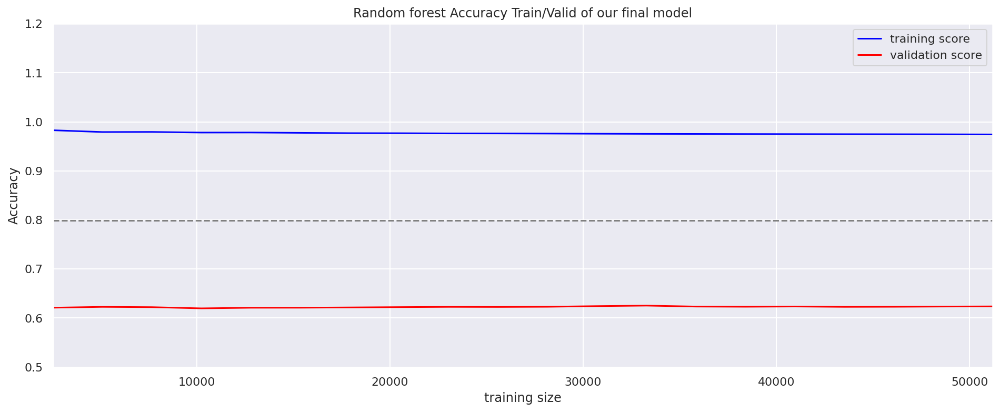

In [ ]:
learning_curve(N, train_lc, val_lc)

#### 3.7.2 Validation curve on different trees:

Although we used random search and grid search for finding the most proper hyperparameters, we still want to know that how many trees is good enough and how our model is influnenced by the different number of trees.
Like what we did in polynomial regression with different degrees.

In this kind of visualization, we can give a intuitive way of showing the chaning of train/valid score by trees number.

This can help up to use a relatively good enough number of trees when we test our model on different dataset. 
Since if we best estimator only has 22 trees, we set our limit to 50 trees in this plot.

In [ ]:
from sklearn.model_selection import validation_curve
from sklearn.pipeline import make_pipeline
import matplotlib.pyplot as plt
import numpy as np

    
n_estimators = np.arange(1, 50) # limit of number of estimators
train_score, val_score = validation_curve(forest_cls_final, X_train, y_train,
                                          param_name='n_estimators', param_range=n_estimators, cv=2
                                          , scoring = 'accuracy')

In [ ]:
joblib.dump(train_score,'est_train_score.pkl')
joblib.dump(val_score,'est_val_score.pkl')

['est_val_score.pkl']

In [ ]:
train_score = joblib.load('/content/drive/MyDrive/A3/pkls/est_train_score.pkl')
val_score = joblib.load('/content/drive/MyDrive/A3/pkls/est_val_score.pkl')

In [ ]:
#------------------------valid_score_curve------------------
def valid_score_curve(train_score, val_score, n_estimators = np.arange(1, 50)):
  fig, ax = plt.subplots(figsize=(16, 6))
  # get mean of 5 cv of values
  ax.plot(n_estimators, np.median(train_score, 1), color='blue', label='training score')
  ax.plot(n_estimators, np.median(val_score, 1), color='red', label='validation score')
  # matplot setting
  ax.legend(loc='best')
  ax.set_ylim(0.1, 1.2)
  ax.set_xlim(0, 50)
  ax.set_title("Train/Valid ACCURACY loss of different random forest models")
  ax.set_xlabel('number of trees')
  ax.set_ylabel('ACCURACY');
  plt.show()

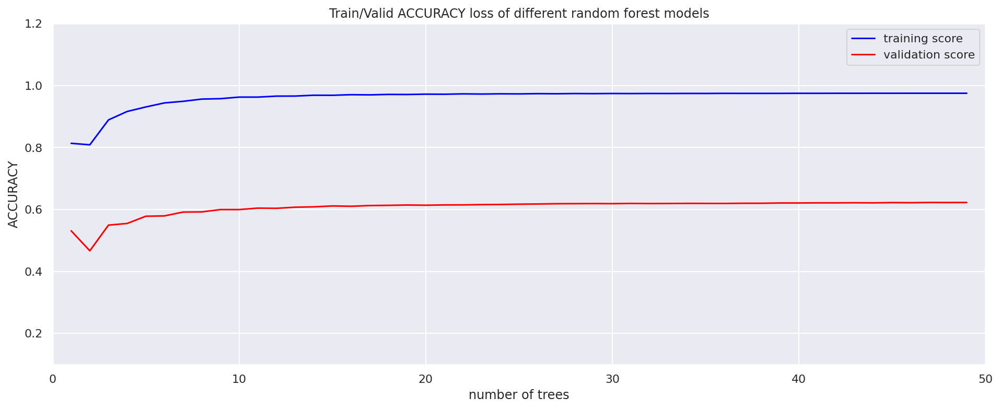

In [ ]:
# draw the validation curve
valid_score_curve(train_score, val_score, n_estimators = np.arange(1, 50))

### 3.7.3 ROC curve and percision recall curve.

1. AUC-ROC curve is reall good on analyzing classification problem in machine learning. AUC stands for area under the curve and ROC stands for receiver operating characteristics curve.
The more AUC area or value is, the better the model we have in classification problem.
2. And precision - recall curve sepecially good at when we have a unbalanced dataset. 

>Precision-Recall is a useful measure of success of prediction when the classes are very imbalanced. In information retrieval, precision is a measure of result relevancy, while recall is a measure of how many truly relevant results are returned.

> The precision-recall curve shows the tradeoff between precision and recall for different threshold. A high area under the curve represents both high recall and high precision, where high precision relates to a low false positive rate, and high recall relates to a low false negative rate. High scores for both show that the classifier is returning accurate results (high precision), as well as returning a majority of all positive results (high recall). [sklearn](https://scikit-learn.org/stable/auto_examples/model_selection/plot_precision_recall.html)


The function is coming from [scikitplot pacakge](https://scikit-plot.readthedocs.io/en/stable/metrics.html)

This function will draw ROC and percision recall curve

In [ ]:
import matplotlib.pyplot as plt
import scikitplot as skplt
#------------draw_roc_curve--------
# this function will draw ROC and percision recall curve
def draw_roc_or_percision_recall_curve(model,y_test, X_test, type = 'roc'):
  predicted_probas = model.predict_proba(X_test) # get results
  fig, ax = plt.subplots(figsize = (10,10))
  if type == 'roc':
    skplt.metrics.plot_roc(y_test, predicted_probas, ax= ax)  # draw ROC curve
  else: # draw precision_recall curve
    skplt.metrics.plot_precision_recall_curve(y_test, predicted_probas,ax=ax)
  plt.show()
  return 

***ROC Curve***

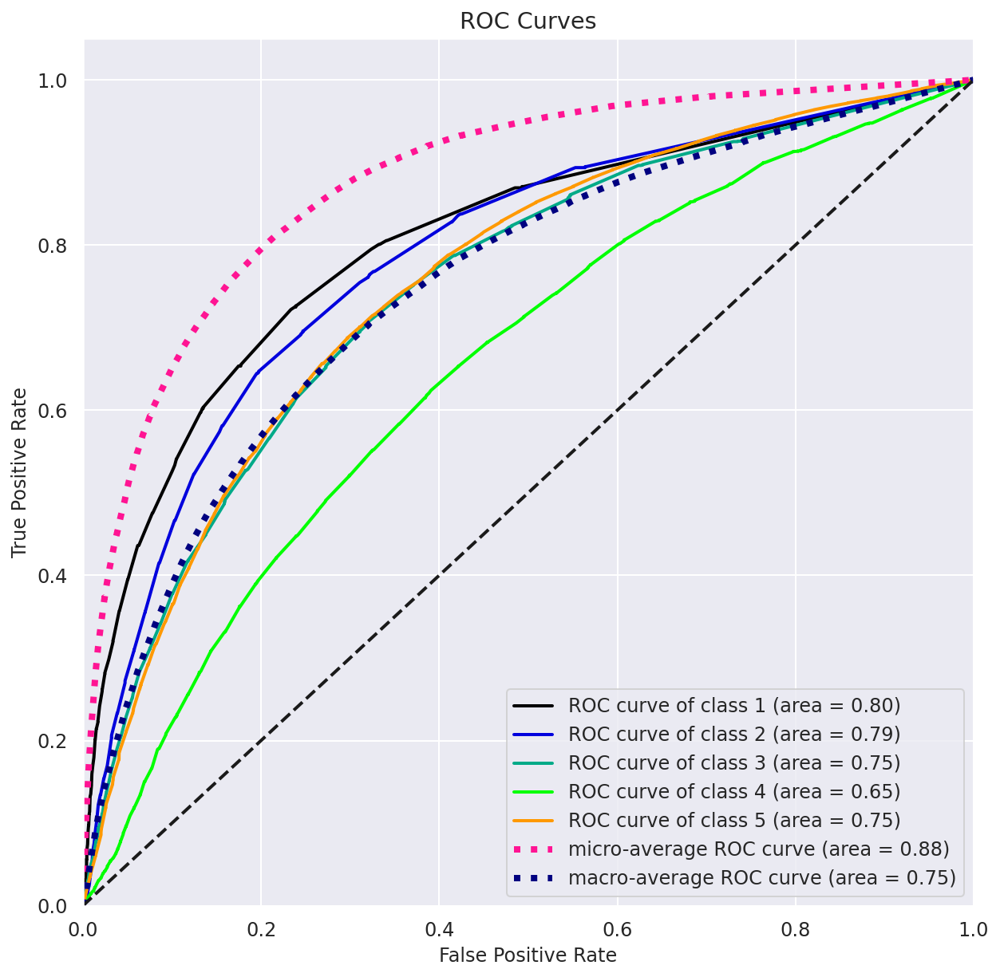

In [ ]:
# draw ROC curve
draw_roc_or_percision_recall_curve(forest_cls_final, y_test, X_test, type='roc')

***Percision Recall curve***

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_precision_recall_curve is deprecated; This will be removed in v0.5.0. Please use scikitplot.metrics.plot_precision_recall instead.
  warnings.warn(msg, category=FutureWarning)


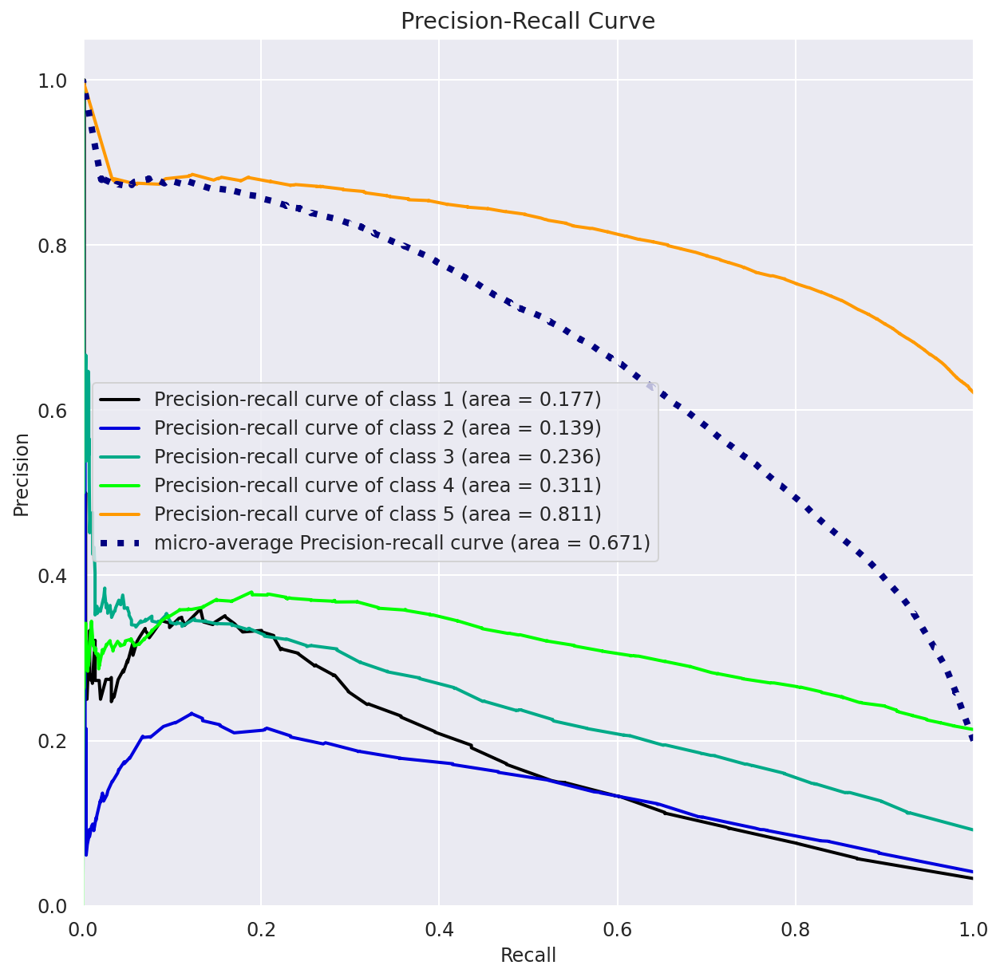

In [ ]:
# draw Percision Recall curve
draw_roc_or_percision_recall_curve(forest_cls_final, y_test, X_test, type='pr_c')

## 3.8. Analyze the results.

### 3.8.1 Learning Curve and validation curve.

This time, we first we take a look at our validation curve.
Since our accuracy is too low, we would like to know if there is a overfitting by using too many trees.




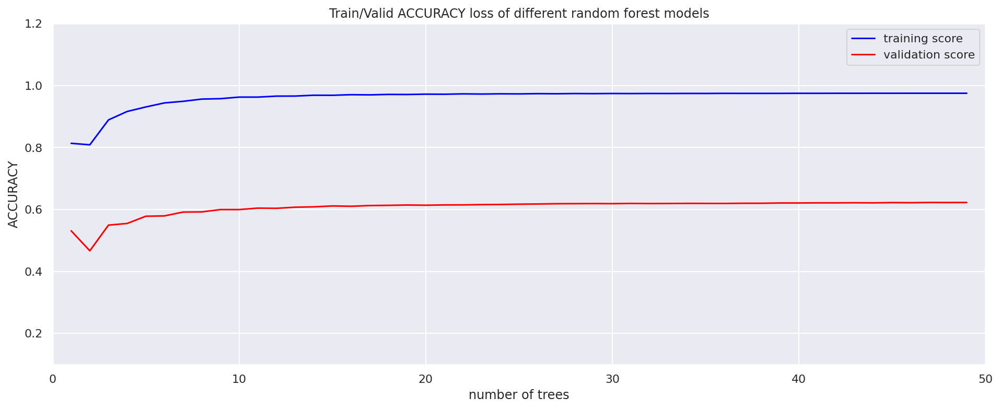

In [ ]:
# draw the validation curve
valid_score_curve(train_score, val_score, n_estimators = np.arange(1, 50))

However, in the validation curve, we can see that our model won't improve after more than 5 trees. Hence the choice of our best estimators won't be a problem of overfitting by large estimators' number. And random forest is famous by not easy to get overfitting by increasing estimators.

However, if our model can fit this data with those few trees. It means our data set has too few variability. We are impossible to find more patterns in the dataset. That is a bad sign.

2. Then learning curve

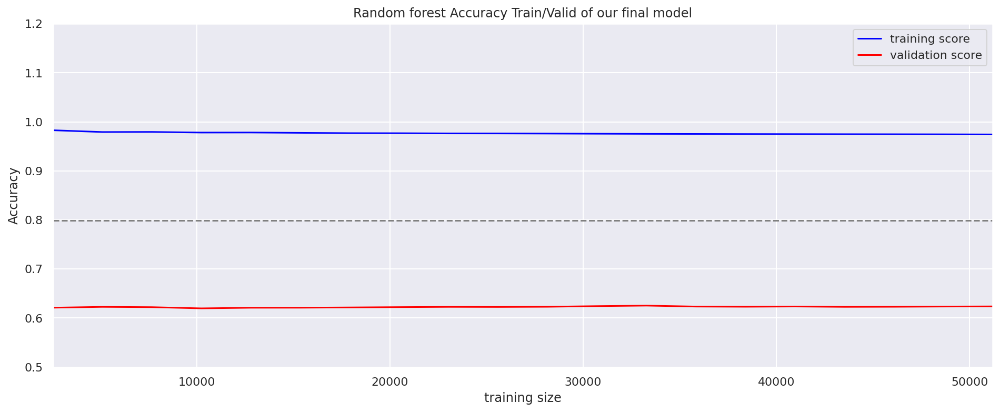

In [ ]:
learning_curve(N, train_lc, val_lc)

And the learning curve confirmed our guessing.

We can see that our model is extremely easy to get overfitted in training model.
And it gets near 100% with a very small training size.

That means the words used in validation set doesn't appear in training set.
I tried to use all 500 words or 5000 words to train the model, but the result is similar. Since most of words doesn't appear in most of reviewText, it's impossible for our model to asign a correct coef to each parameteres.

Hence, we need to get our words feature as a small group and most importantly they must be important words.


### 3.8.2 ROC curve

Let's redraw the graph.

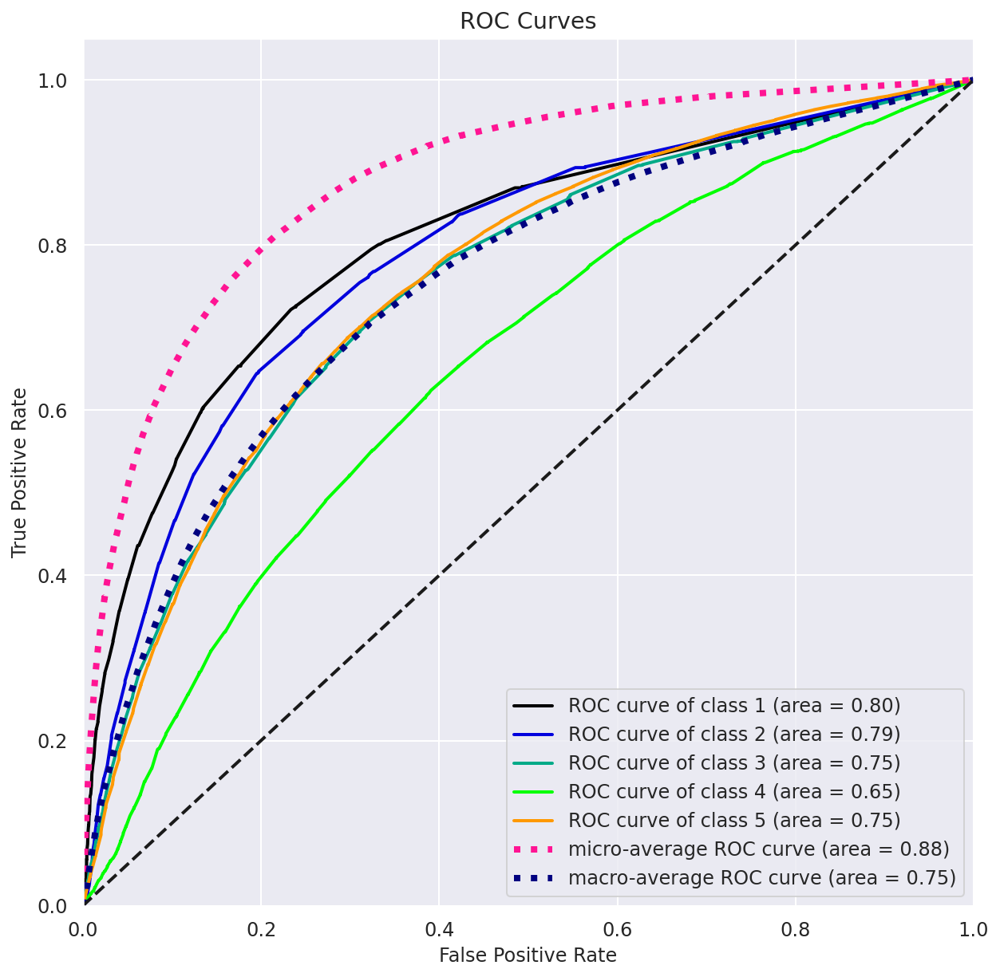

In [ ]:
# draw ROC curve
draw_roc_or_percision_recall_curve(forest_cls_final, y_test, X_test, type='roc')

We can see the Area under curve as AUC in our dataset is similar. But class 4 has lowest AUC in our ROC graph. 

We would say that class 4 has the worst performance in our prediciton by ROC curve.

### 3.8.3 Percision-Recall graph

In [ ]:
print("Classification report of the final classifier on validation set:\n\n",
      classification_report(y_test, prediction_final_test, target_names=target_names))

Classification report of the final classifier on validation set:

               precision    recall  f1-score   support

           1       0.37      0.16      0.22       658
           2       0.24      0.07      0.11       819
           3       0.36      0.16      0.22      1834
           4       0.37      0.23      0.28      4267
           5       0.69      0.89      0.78     12423

    accuracy                           0.62     20001
   macro avg       0.41      0.30      0.32     20001
weighted avg       0.56      0.62      0.58     20001



We use our previous defined function to draw this graph.

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_precision_recall_curve is deprecated; This will be removed in v0.5.0. Please use scikitplot.metrics.plot_precision_recall instead.
  warnings.warn(msg, category=FutureWarning)


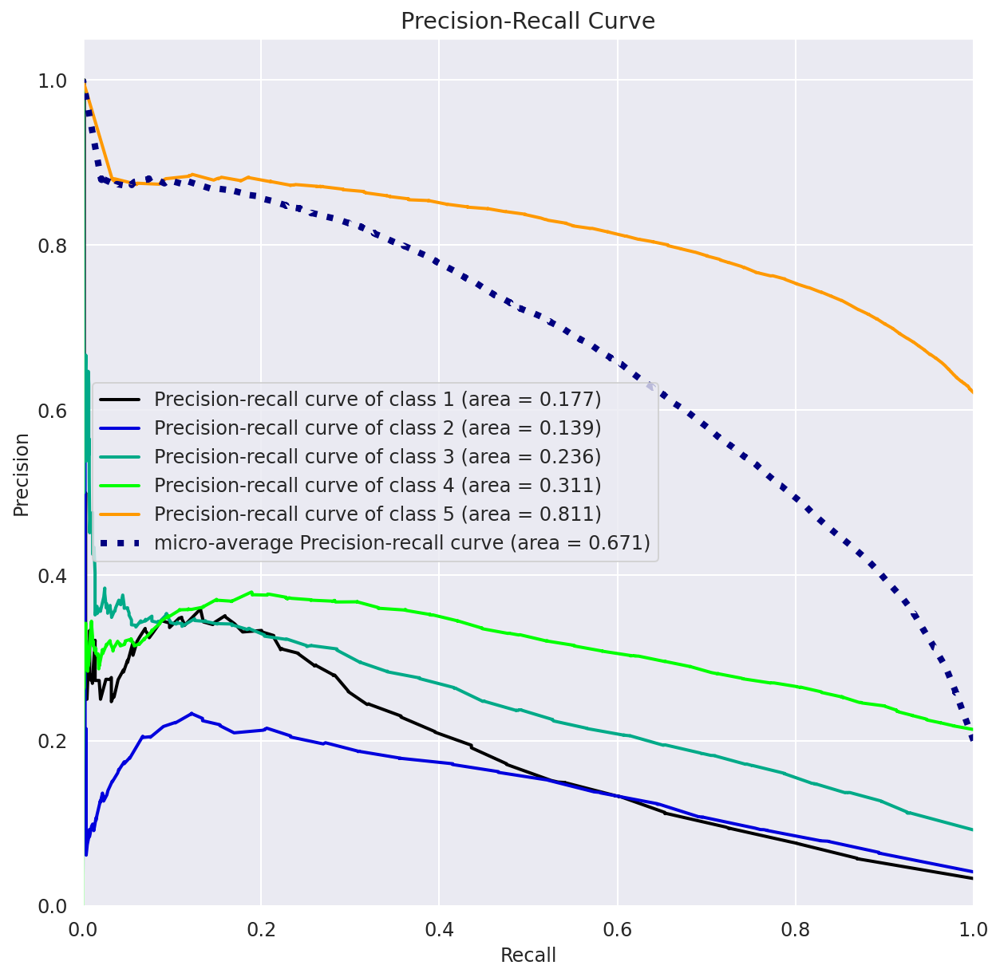

In [ ]:
# draw ROC curve
draw_roc_or_percision_recall_curve(forest_cls_final, y_test, X_test, type='pr_c')

We can see that except class 5 has a high percision score when recall score increases. Other four classes has a siginificant low percision scores.
There is a chance that people who rate the product in lowe scores won't use similar words to express their feelings.

We would see in the original dataset, the prediciton is good on score 5's class. But not good at other classes.

The following is the way of how to calculate all kinds of scores. [Wiki](https://en.wikipedia.org/wiki/Precision_and_recall)

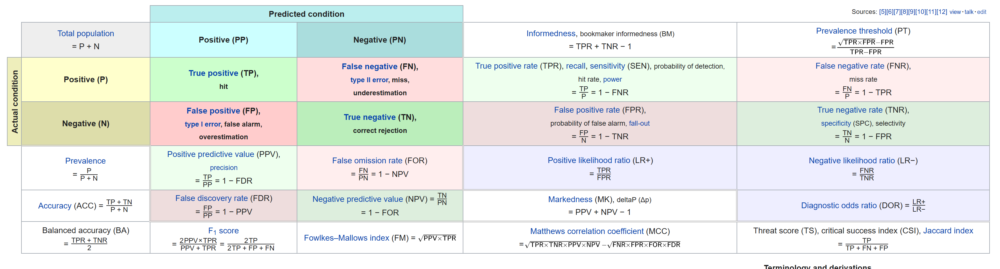

# Task 4. Perform part-of-speech tagging (0.35)

#### Utility Function

In this task, we need to redefine a few things in our transformer and pipelines for more easier to get our dataset separately.
But it's not necessary to write those explictly.

Hence, we put those functions in this Utility Function section for more convenient to use.

In [ ]:

#------------- main transformer ---------------------
# Class for attribute transformer
# import important libray
from sklearn.base import BaseEstimator, TransformerMixin

class combined_attribute_adder_and_cleaner(BaseEstimator, TransformerMixin):
    '''data clean transfomer class'''
    
    def __init__(self, data_cleaner = True, servies_remainer = False, normalization = True): # no *args or **kargs
        # we need to set extra var to ensure do we need to purge the dataset. 
        # In my following experments, sometimes we don't need to do so. 
        self.data_cleaner = data_cleaner
        self.servies_remainer = servies_remainer
        self.normalization = normalization

    def fit(self, X, y=None):
        return self # nothing else to do

    def transform(self, data_df):
        # we first copy the data from our dataset.
        # operate on original data set sometimes is dangerous.
        X = data_df.copy()

        #0. drop NaN values
        # drop vote and image
        X = X.drop(['vote','image'], axis = 1)
        # drop NaN values
        for i in range(len(X.columns)):
          X = X.drop(X[X[str(X.columns[i])].isna()].index)

        # 1. First we change the feature verified with to integer
        X["verified"] = X["verified"].astype(int)

        # 2. purge outliers
        X = purge_outliers(X)

        # 3. drop all useless features and categorical features we alreayd transfered
        X = X.drop(['reviewerID','reviewTime', 'asin', 'unixReviewTime'],axis=1) 

        # 4. delete HTML tag and other useless characters
        X = clean_useless_information(X)

        # 5. clean alphanumeric data
        X['style'] = X['style'].str.replace('Format', '')

        # get text feature
        feature = X.select_dtypes(exclude="number").columns

        for i in range(len(feature)):
            print("Now it's removing number and alphanumberic from ", feature[i])
            # remove stop words
            # first change all character to lower case
            X[feature[i]] = X[feature[i]].str.replace('[^\w\s]+', '')
            X[feature[i]] = X[feature[i]].str.replace('[0-9]+', '')

        # remove stop words
        stop_words = stopwords.words('english')

        for i in range(len(feature)):
          print("Now it's removing stop words from ", feature[i])
          # remove stop words
          # first change all character to lower case
          X[feature[i]] = X[feature[i]].str.lower()
          X[feature[i]] = X[feature[i]].apply(lambda x: ' '.join([word for word in x.split() if word not in (stop_words)]))

        # create new column
        X['text'] = X['summary'] + " " + X['reviewText']

        #6. clean style's space
        X['style'] = X['style'].str.replace(' ', '')
        
        # we put our target value at the end
        target = X.pop('overall')
        X['score'] = target


        return X
#############################PIPE LINE###################################################



# Now we build a transformer to get all the above steps
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler


# convert_pipeline is for create a whole pipeline but remain the dataFrame structure
convert_pipeline = Pipeline([
        ('attribs_adder_cleaner', combined_attribute_adder_and_cleaner(data_cleaner=True)),
    ])



## 4.1 Perform Part-of-Speech tagging.

### 4.1.0. Question classification


By newest classification from our TA. We can use only two datasets for task 4.

Here, I choose to compare dataset, 1 and 3.

Such that, Q3's result: as dataset 1: preprocessed.
And dataset 3, POS tagged after preprocessing.

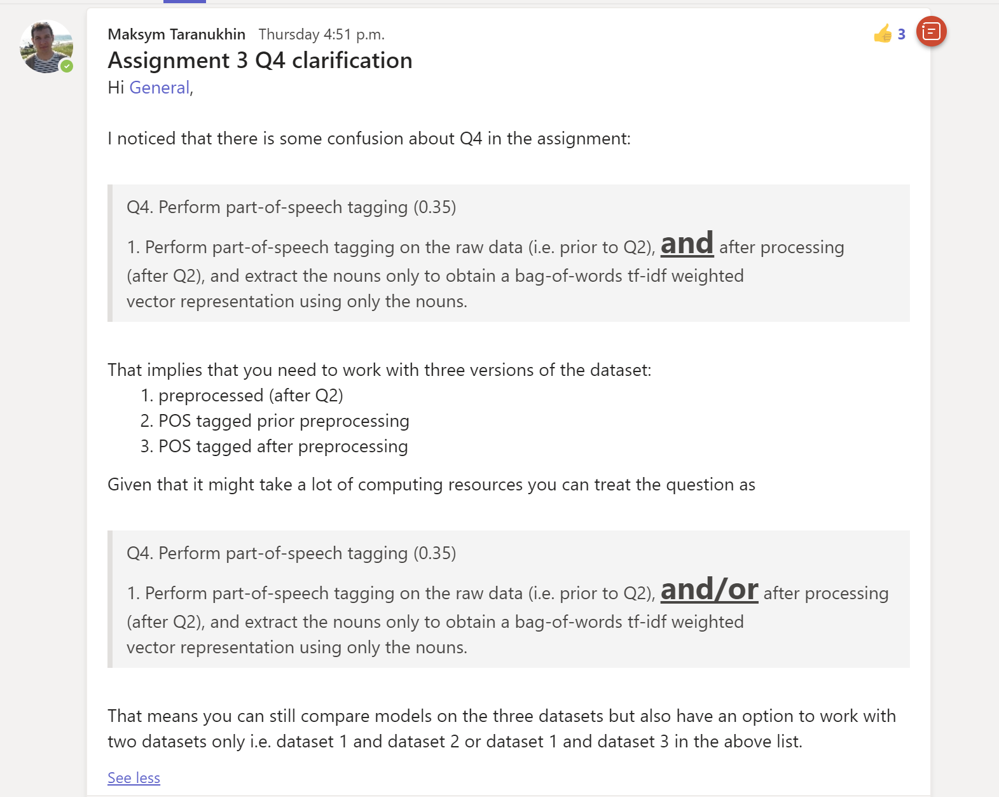

### 4.1.1 Perform part-of-speech on preprocessed dataset after Q2.

Get our already preprocessed data from before.

In [ ]:
lemmatized_text_data = pd.read_csv('/content/drive/MyDrive/A3/lemmatized_text_data.csv')
lemmatized_text_data = lemmatized_text_data.drop('Unnamed: 0', axis=1) # old index is useless now. drop it
lemmatized_text_data = lemmatized_text_data.convert_dtypes()
lemmatized_text_data = lemmatized_text_data.fillna('empty')
lemmatized_text_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 884604 entries, 0 to 884603
Data columns (total 8 columns):
 #   Column        Non-Null Count   Dtype 
---  ------        --------------   ----- 
 0   verified      884604 non-null  Int64 
 1   style         884604 non-null  string
 2   reviewerName  884604 non-null  string
 3   reviewText    884604 non-null  string
 4   summary       884604 non-null  string
 5   score         884604 non-null  Int64 
 6   text          884604 non-null  string
 7   token_text    884604 non-null  string
dtypes: Int64(2), string(6)
memory usage: 55.7 MB


Separate the 880K dataset into 100K dataset.

In [ ]:
from sklearn.model_selection import train_test_split
model_data_raw, _ = train_test_split(lemmatized_text_data, test_size=0.88695, random_state=42)
# we drop reviewText and reivewName, summary and text columns, since we already have token_text and review Name is useless.
model_data_raw = model_data_raw.drop(['reviewerName', 'reviewText', 'summary'], axis = 1)
# rearange the target label feature score to the end
model_data_raw['score'] = model_data_raw.pop('score')

In [ ]:
model_data_raw.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 100004 entries, 744031 to 121958
Data columns (total 5 columns):
 #   Column      Non-Null Count   Dtype 
---  ------      --------------   ----- 
 0   verified    100004 non-null  Int64 
 1   style       100004 non-null  string
 2   text        100004 non-null  string
 3   token_text  100004 non-null  string
 4   score       100004 non-null  Int64 
dtypes: Int64(2), string(3)
memory usage: 4.8 MB


In [ ]:
model_data_raw.head()

,verified,style,text,token_text,score
744031,1,kindle edition,sigh miss claire jamie vague characters wasted...,"['sigh', 'miss', 'claire', 'jamie', 'vague', '...",1
801184,1,kindle edition,remarkable book many levels thoroughly enjoyed...,"['remarkable', 'book', 'many', 'level', 'thoro...",5
341256,0,paperback,buy book laurel hardy fans love book certainly...,"['buy', 'book', 'laurel', 'hardy', 'fan', 'lov...",5
734969,0,hardcover,enthralling suspense readers familiar ms coult...,"['enthral', 'suspense', 'readers', 'familiar',...",4
750145,0,hardcover,great story fantastic illustrations cupidandps...,"['great', 'story', 'fantastic', 'illustrations...",5


Load Part-of_speech packages

In [ ]:
from nltk import word_tokenize, pos_tag, pos_tag_sents

Get all text from the column text

In [ ]:
texts = model_data_raw['text'].tolist()

In [ ]:
texts

['sigh miss claire jamie vague characters wasted minds readers clouded mthis book like overcast summer holiday like dollar store gift wrap like solicitation vs royalty check could reader ore disappointed',
 'remarkable book many levels thoroughly enjoyed book knowing boy title  year old passed away afraid would find depressing even though gone boy catalyst occurs book obsession lists world records motivates ona  year old woman helping chores set goals find meaning life parents equally motivated example especially father never really took time know son alive comes admire find meaning life result discoveries',
 'buy book laurel hardy fans love book certainly warmth affection john mccabe stan ollie comes every page focus laurel hardy comes well chapters devoted himi wish pictures text made dont surprised find whistling cukoo song reading book boys gone laughter created still us unlike current crop comedians',
 'enthralling suspense readers familiar ms coulters fbi couple savich sherlock p

Map our text to word tonkenizer

In [ ]:
map(word_tokenize, texts)

Create a new column called POS_text.

We will save our result into this column.

In [ ]:
model_data_raw['POS_text'] = pos_tag_sents( model_data_raw['text'].apply(word_tokenize).tolist())

Now, we delete all useless columns we aleady know from Q3.

In [ ]:
model_data_raw = model_data_raw.drop(['style', 'token_text'],axis=1)

In [ ]:
model_data_raw.head()

,verified,text,score,POS_text
744031,1,sigh miss claire jamie vague characters wasted...,1,"[(sigh, JJ), (miss, NN), (claire, NN), (jamie,..."
801184,1,remarkable book many levels thoroughly enjoyed...,5,"[(remarkable, JJ), (book, NN), (many, JJ), (le..."
341256,0,buy book laurel hardy fans love book certainly...,5,"[(buy, VB), (book, NN), (laurel, NN), (hardy, ..."
734969,0,enthralling suspense readers familiar ms coult...,4,"[(enthralling, VBG), (suspense, NN), (readers,..."
750145,0,great story fantastic illustrations cupidandps...,5,"[(great, JJ), (story, NN), (fantastic, JJ), (i..."


In [ ]:
model_data_raw.to_csv('Pos_dataset.csv')

In [ ]:
joblib.dump(model_data_raw, 'pos_data_raw.pkl')

['pos_data_raw.pkl']

### 4.1.3 Get TF-IDF weighted vector

Now it's time to extract the nouns only words to obtain a bag-of-words tf-idf weighted vector. 

First, we create a new column called "only_noun". We will get all NN type of words from the column POS_text and save those into our new column.

In [ ]:
# reload the dataset for more easy to access
model_data_raw = pd.read_csv('/content/drive/MyDrive/A3/Pos_dataset.csv')
model_data_raw = model_data_raw.drop('Unnamed: 0', axis=1) # old index is useless now. drop it
model_data_raw = model_data_raw.convert_dtypes()
model_data_raw = model_data_raw.fillna('empty')
model_data_raw.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100004 entries, 0 to 100003
Data columns (total 4 columns):
 #   Column    Non-Null Count   Dtype 
---  ------    --------------   ----- 
 0   verified  100004 non-null  Int64 
 1   text      100004 non-null  string
 2   score     100004 non-null  Int64 
 3   POS_text  100004 non-null  string
dtypes: Int64(2), string(2)
memory usage: 3.2 MB


In [ ]:
# create a new column called only_noun with empty values
model_data_raw['only_noun'] = pd.NA

In [ ]:
model_data_raw.head()

,verified,text,score,POS_text,only_noun
0,1,sigh miss claire jamie vague characters wasted...,1,"[('sigh', 'JJ'), ('miss', 'NN'), ('claire', 'N...",<NA>
1,1,remarkable book many levels thoroughly enjoyed...,5,"[('remarkable', 'JJ'), ('book', 'NN'), ('many'...",<NA>
2,0,buy book laurel hardy fans love book certainly...,5,"[('buy', 'VB'), ('book', 'NN'), ('laurel', 'NN...",<NA>
3,0,enthralling suspense readers familiar ms coult...,4,"[('enthralling', 'VBG'), ('suspense', 'NN'), (...",<NA>
4,0,great story fantastic illustrations cupidandps...,5,"[('great', 'JJ'), ('story', 'NN'), ('fantastic...",<NA>


>Note: 
 We know that feature POS_text has index 3 and only_noun has index 4.
 We will use this information for the next step operation.

Now, we write a for loop to iterate all instances and get the Noun by rows then save it to only_noun feature.

In [ ]:
# use for loop to get all pos_list
from tqdm.notebook import tqdm
for i in tqdm(range(len(model_data_raw))):
  # get one instances from POS_text by iloc with i, 3
  text_list = model_data_raw.iloc[i, 3 ]
  # get a empty set for saving noun words
  nouns = []
  # iterate over the text_list
  for words, wtype in text_list:
    if wtype == 'NN': # if it's a noun
      nouns.append(words) # add words to our noun array
  
  # end for
  # we save our nouns extraction to our new column 
  # first we convert our list to string then save the string back to the dataset.
  str1 = " "
  nouns_str = str1.join(nouns)
  model_data_raw.iloc[i, 4 ] = nouns_str


  0%|          | 0/100004 [00:00<?, ?it/s]

Save our results to a new dataframe

In [ ]:
data_only_noun = model_data_raw.copy()

In [ ]:
data_only_noun.to_csv('data_only_noun_data.csv')

We reset our new dataset's index.

In [ ]:
data_only_noun = data_only_noun.reset_index()
data_only_noun = data_only_noun.drop('index',axis=1)

Print the new dataframe's head

In [ ]:
data_only_noun.head()

,verified,text,score,POS_text,only_noun
0,1,sigh miss claire jamie vague characters wasted...,1,"[(sigh, JJ), (miss, NN), (claire, NN), (jamie,...",miss claire jamie book summer holiday dollar s...
1,1,remarkable book many levels thoroughly enjoyed...,5,"[(remarkable, JJ), (book, NN), (many, JJ), (le...",book book boy title year catalyst book obsessi...
2,0,buy book laurel hardy fans love book certainly...,5,"[(buy, VB), (book, NN), (laurel, NN), (hardy, ...",book laurel book affection john mccabe ollie p...
3,0,enthralling suspense readers familiar ms coult...,4,"[(enthralling, VBG), (suspense, NN), (readers,...",suspense couple sherlock husband wife team rea...
4,0,great story fantastic illustrations cupidandps...,5,"[(great, JJ), (story, NN), (fantastic, JJ), (i...",story story heroine j lynchs watercolor book t...


Now we can see in only_noun column, there indeed only nouns.

***It's time to get the TF-IDF matrix***

In [ ]:
#----------------TDIDF_Data_generator---------------
def TDIDF_Data_generator_pos(data, max_features = 500, feature_name='only_noun'):
  from sklearn.feature_extraction.text import TfidfVectorizer
  from sklearn.feature_extraction.text import TfidfTransformer
  # we set for max_features: as most words we saved for 500 words
  # in order to not exceed our memory
  v_test = TfidfVectorizer(stop_words='english', max_features = max_features)
  # get TDIDF array from token_text
  x_token_text = v_test.fit_transform(data[feature_name])
  # save it into a pandas dataframe
  tdidf_data = pd.DataFrame(x_token_text.toarray(), columns = v_test.get_feature_names() )

  data_copy = data.copy()
  data_copy = data_copy.reset_index() # need to reset index for matching the results

  tdidf_data['verified'] = data_copy['verified']
  tdidf_data['score'] = data_copy['score']
  return tdidf_data

In [ ]:
data_only_noun = pd.read_csv('/content/drive/MyDrive/A3/data_only_noun_data.csv')
data_only_noun = data_only_noun.drop('Unnamed: 0', axis=1) # old index is useless now. drop it
data_only_noun = data_only_noun.convert_dtypes()
data_only_noun = data_only_noun.fillna('0')
data_only_noun.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100004 entries, 0 to 100003
Data columns (total 5 columns):
 #   Column     Non-Null Count   Dtype 
---  ------     --------------   ----- 
 0   verified   100004 non-null  Int64 
 1   text       100004 non-null  string
 2   score      100004 non-null  Int64 
 3   POS_text   100004 non-null  string
 4   only_noun  100004 non-null  string
dtypes: Int64(2), string(3)
memory usage: 4.0 MB


In [ ]:
only_noun_tdidf_data = TDIDF_Data_generator_pos(data_only_noun)

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


In [ ]:
only_noun_tdidf_data.head()

,ability,account,action,addition,admit,adult,adventure,advice,age,air,...,wow,writer,writing,year,york,youll,youre,youve,verified,score
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,1,1
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.499273,0.0,0.0,0.0,0.0,1,5
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0,5
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0,4
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0,5


In [ ]:
only_noun_tdidf_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100004 entries, 0 to 100003
Columns: 502 entries, ability to score
dtypes: Int64(2), float64(500)
memory usage: 383.2 MB


## 4.2. Repeat question Q3

Firse we get our training, validation, and test set

In [ ]:
X_raw, y_raw = get_model_set(only_noun_tdidf_data)
X_train,X_test, y_train, y_test = train_test_split(X_raw, y_raw, test_size=0.2, random_state=42, stratify=y_raw)
X_train,X_valid, y_train, y_valid = train_test_split(X_train, y_train, test_size=0.2, random_state=42, stratify=y_train)

### 4.2.1 Feature selection

Then we reuse our feature selection function from Q3.

Save feature names.

In [ ]:
# save feature names
features_name = X_train.loc[:,:].columns.tolist();
len(features_name)

501

In [ ]:
from sklearn.datasets import make_classification
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_classif

fscores = select_features_prompt(X_train, y_train,X_test, f_classif)

Feature 0  ability: 1.484523353924719
Feature 1  account: 1.0113771497221016
Feature 2  action: 11.783286846512594
Feature 3  addition: 4.746295143419053
Feature 4  admit: 6.854024986883262
Feature 5  adult: 1.110567952059355
Feature 6  adventure: 10.688372847999839
Feature 7  advice: 5.133501014113466
Feature 8  age: 0.1570575401148864
Feature 9  air: 1.6799802266745127
Feature 10  amazon: 5.237110090455931
Feature 11  analysis: 1.120373376362189
Feature 12  approach: 1.82041230004955
Feature 13  area: 2.641287618212717
Feature 14  art: 0.45349177589444506
Feature 15  attention: 4.7586168974236625
Feature 16  audience: 15.40774957570686
Feature 17  author: 20.67817862386069
Feature 18  baby: 0.5375785989191142
Feature 19  background: 5.443685813549299
Feature 20  battle: 3.4514230327406876
Feature 21  beach: 17.901472759527405
Feature 22  beauty: 1.1696797004329305
Feature 23  biography: 1.3217624398142493
Feature 24  bit: 147.58788356965488
Feature 25  blood: 1.8095629306087382
Featu

Draw words importances by our feature selection method.

By frist 150 words.

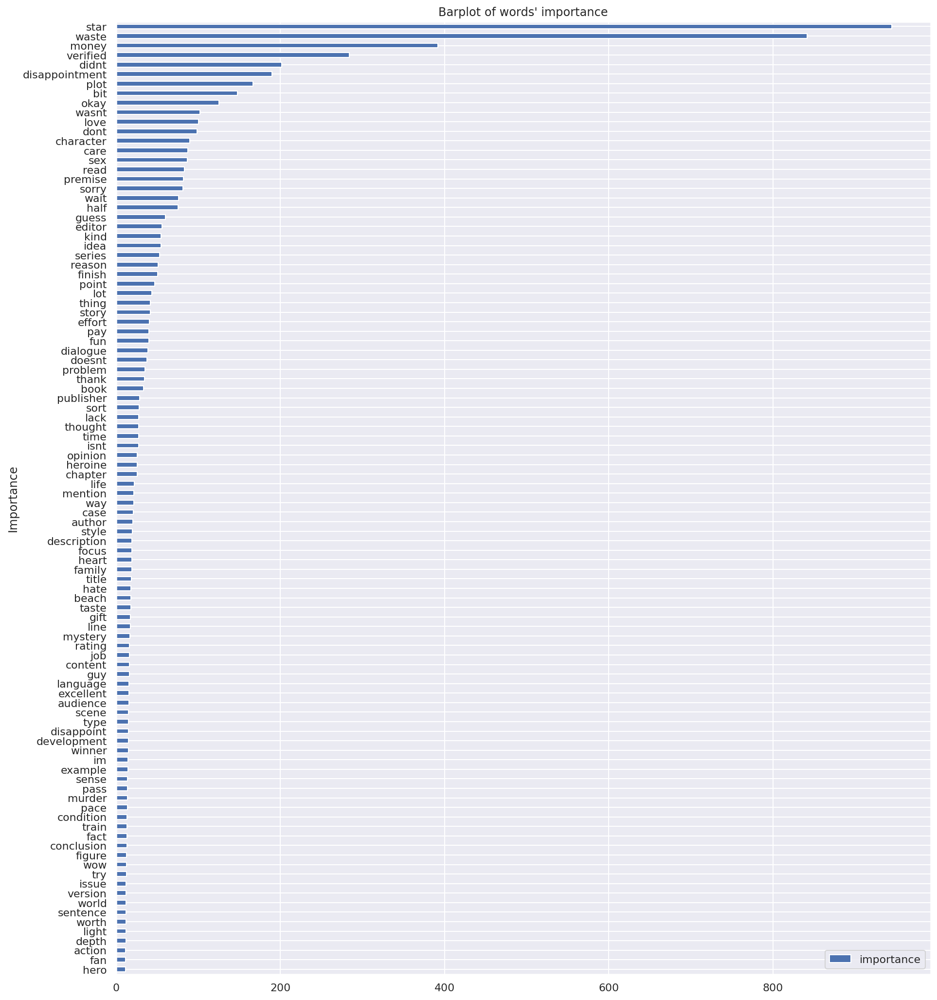

In [ ]:
results_df = pd.DataFrame(fscores, index=features_name , columns = ['importance'])
results_df = results_df.sort_values(by=['importance'],ascending=False)
words_importance_plot(results_df.head(100),fig_size=(15,18))

Now, we draw the boxplot.

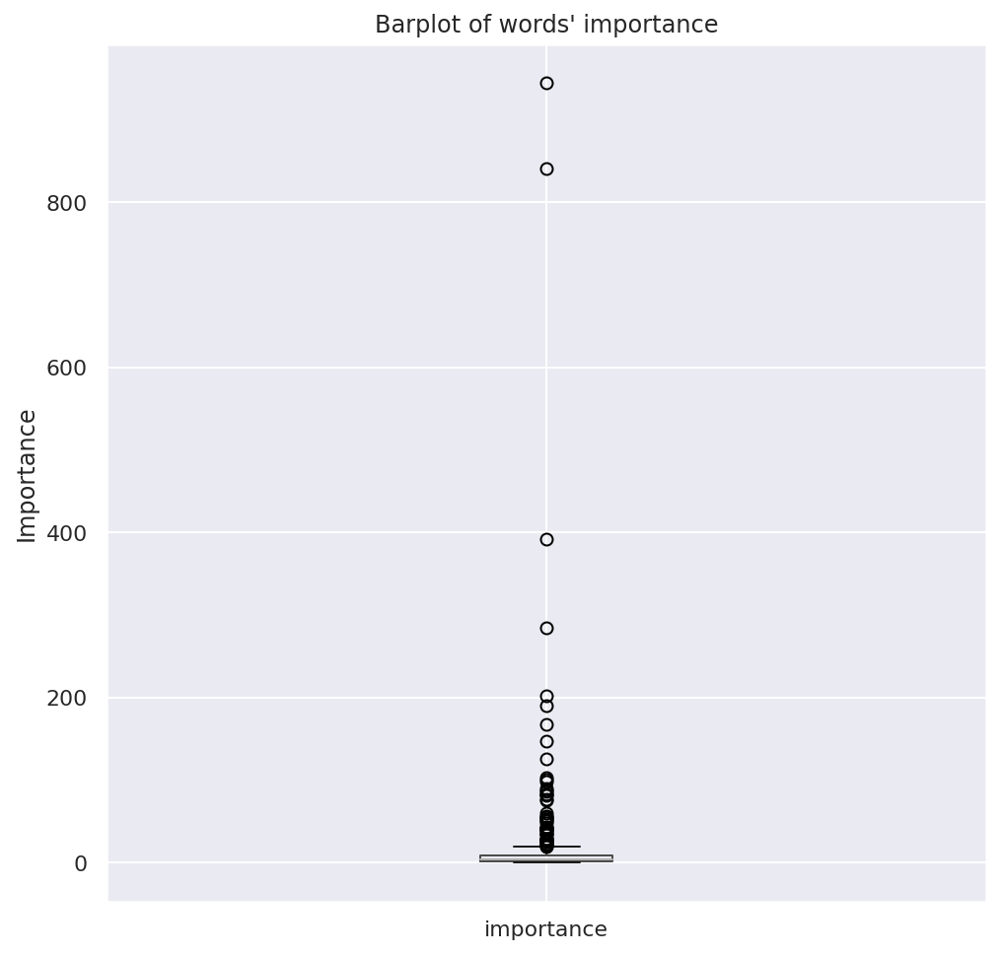

In [ ]:
words_importance_barplot(results_df)

In [ ]:
build_continuous_features_report(results_df)

,Count,Miss %,Card.,Min,1st Qrt.,Mean,Median,3rd Qrt,Max,Std. Dev.
importance,501,0.0,501,0.057356,1.547869,14.972317,3.4782,8.854505,944.367922,63.490062


The mean importances is 14.97, and max is 944.

We would like to select the high importance words.

We can see that in our POS tagged dataset. There are less important words.

Let's run our find outlier function to find the most important words.

In [ ]:
find_outliers(results_df,'importance')

IQR = 8.854504556070866 - 1.547868627149235 = 7.306635928921631
MAX = 19.814458449453312
Min is 0
Num of min outliers:  0
Num of max outliers:  54
Num of negative outliers:  0
Num of the original data set's whole instance 501
Rate of purged data/total data 0.10778443113772455


Index(['star', 'waste', 'money', 'verified', 'didnt', 'disappointment', 'plot',
       'bit', 'okay', 'wasnt', 'love', 'dont', 'character', 'care', 'sex',
       'read', 'premise', 'sorry', 'wait', 'half', 'guess', 'editor', 'kind',
       'idea', 'series', 'reason', 'finish', 'point', 'lot', 'thing', 'story',
       'effort', 'pay', 'fun', 'dialogue', 'doesnt', 'problem', 'thank',
       'book', 'publisher', 'sort', 'lack', 'thought', 'time', 'isnt',
       'opinion', 'heroine', 'chapter', 'life', 'mention', 'way', 'case',
       'author', 'style'],
      dtype='object')

Let's redraw the plot with any importance value larger than 20. By our find outliers function we defined before.

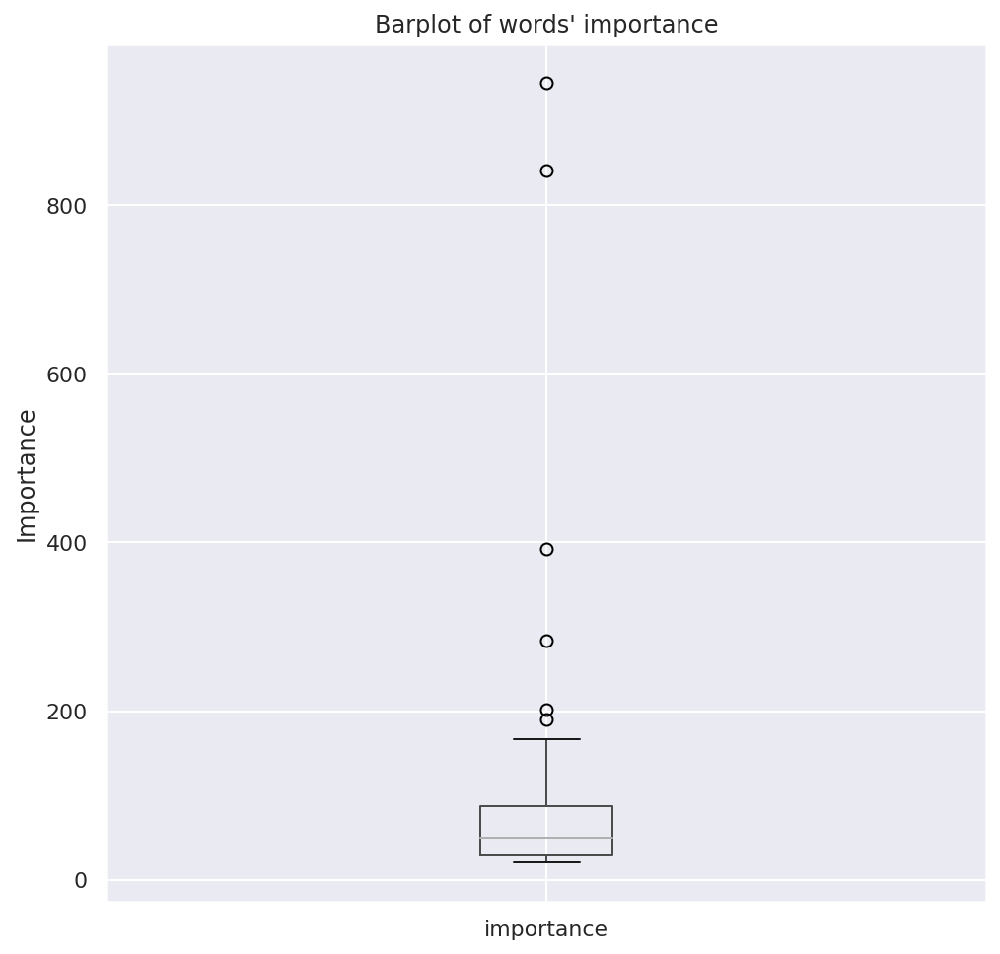

In [ ]:
words_importance_barplot(results_df[results_df['importance'] > 20])

Let's see how many of those words that importance > 20.

In [ ]:
len(results_df[results_df['importance'] > 20])

53

53 is a little bit less than we have in Q3, as 67. Let's see how good it works.

Now, we trim our dataset into this 57 features and our target label, scores.

In [ ]:
reduced_only_noun_tdidf_data = only_noun_tdidf_data.loc[:,  results_df[results_df['importance'] > 20].index]
reduced_only_noun_tdidf_data['score'] = only_noun_tdidf_data['score']
reduced_only_noun_tdidf_data.head(5)

,star,waste,money,verified,didnt,disappointment,plot,bit,okay,wasnt,...,isnt,opinion,heroine,chapter,life,mention,way,case,author,score
0,0.0,0.0,0.0,1,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,1
1,0.0,0.0,0.0,1,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.383175,0.0,0.0,0.0,0.0,5
2,0.0,0.0,0.0,0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,5
3,0.0,0.0,0.0,0,0.0,0.254652,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,4
4,0.0,0.0,0.0,0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.595689,0.0,0.000000,0.0,0.0,0.0,0.0,5


In [ ]:
reduced_only_noun_tdidf_data.to_csv('reduced_only_noun_tdidf_data.csv')

That will be the dataset, we will use in train and evaluate stage.

### 4.2.2 Select Evaluation metrics

We use the same evaluation metric as in Q3. Accuarcy.

There is no need to change metrics in this stage.

### 4.2.3 HyperParameter tuning.

***First, we get our training dataset from our reduced feature dataset by our feature selection method.***

In [ ]:
reduced_only_noun_tdidf_data = pd.read_csv('/content/drive/MyDrive/A3/reduced_only_noun_tdidf_data.csv')
reduced_only_noun_tdidf_data = reduced_only_noun_tdidf_data.drop('Unnamed: 0', axis=1) # old index is useless now. drop it
reduced_only_noun_tdidf_data = reduced_only_noun_tdidf_data.convert_dtypes()
reduced_only_noun_tdidf_data = reduced_only_noun_tdidf_data.fillna('0')
# reduced_only_noun_tdidf_data.info()

In [ ]:
X_raw, y_raw = get_model_set(reduced_only_noun_tdidf_data)
X_train,X_test, y_train, y_test = train_test_split(X_raw, y_raw, test_size=0.2, random_state=42, stratify=y_raw)
X_train,X_valid, y_train, y_valid = train_test_split(X_train, y_train, test_size=0.2, random_state=42, stratify=y_train)

Test train.

In [ ]:
from sklearn.ensemble import RandomForestClassifier
forest_cls = RandomForestClassifier(n_estimators = 50, random_state=42,verbose=1)
forest_cls.fit(X_train, y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed:   19.3s finished


RandomForestClassifier(n_estimators=50, random_state=42, verbose=1)

In [ ]:
from sklearn.metrics import f1_score
churn_prediction = forest_cls.predict(X_valid)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed:    0.8s finished


In [ ]:
from sklearn.metrics import classification_report

target_names = ['1', '2','3','4','5']

print("Classification report of the first classifier:\n\n",
      classification_report(y_valid, churn_prediction, target_names=target_names))

Classification report of the first classifier:

               precision    recall  f1-score   support

           1       0.29      0.18      0.23       526
           2       0.12      0.05      0.07       656
           3       0.16      0.07      0.10      1467
           4       0.25      0.15      0.18      3414
           5       0.65      0.83      0.73      9938

    accuracy                           0.56     16001
   macro avg       0.29      0.26      0.26     16001
weighted avg       0.49      0.56      0.51     16001



Not too surprised. Our accuracy reduced a lot.

The idea of choosing only nouns is not a good one.

People use adjectives to express their feeling of good or bad.

If we only select nouns to predict the scores, we will lack of the biggest benchmark of adjectives. And there will be not too many things left.

Such a bad idea.

But, still we can do hyperparamter for better performance.

#### 4.2.3.1 Random Search

In [ ]:
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint

param_distribs = {
        'n_estimators': randint(low=1, high = 100),
        'max_features': randint(low=1, high = 8),
    }

forest_cls_rs = RandomForestClassifier(random_state=42, verbose = 1)
rnd_search = RandomizedSearchCV(forest_cls_rs, param_distributions=param_distribs,
                                n_iter=10, cv=5, random_state=42)
rnd_search.fit(X_train, y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  52 out of  52 | elapsed:   10.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  52 out of  52 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  52 out of  52 | elapsed:    8.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  52 out of  52 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  52 out of  52 | elapsed:    8.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  52 out of  52 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_j

RandomizedSearchCV(cv=5,
                   estimator=RandomForestClassifier(random_state=42, verbose=1),
                   param_distributions={'max_features': <scipy.stats._distn_infrastructure.rv_frozen object at 0x7fbd0ad3a190>,
                                        'n_estimators': <scipy.stats._distn_infrastructure.rv_frozen object at 0x7fbd0ad126d0>},
                   random_state=42)

Best estimator:

In [ ]:
rnd_search.best_estimator_

RandomForestClassifier(max_features=3, n_estimators=88, random_state=42,
                       verbose=1)

Print the list of we tried and sorted the order

In [ ]:
cvres_rnd = rnd_search.cv_results_
for mean_score, params in sorted(zip(cvres_rnd["mean_test_score"], cvres_rnd["params"]), reverse=True):
    print(mean_score, params)

0.5671541371279588 {'max_features': 3, 'n_estimators': 88}
0.5669510243340363 {'max_features': 3, 'n_estimators': 72}
0.5652791932759159 {'max_features': 7, 'n_estimators': 75}
0.5651229505995625 {'max_features': 7, 'n_estimators': 83}
0.5641229457171315 {'max_features': 7, 'n_estimators': 52}
0.5628886573802829 {'max_features': 3, 'n_estimators': 22}
0.5618887171900633 {'max_features': 5, 'n_estimators': 24}
0.5618731202640419 {'max_features': 5, 'n_estimators': 21}
0.5578732435454261 {'max_features': 5, 'n_estimators': 15}
0.4776570507186939 {'max_features': 5, 'n_estimators': 2}


We can see that our best estimator is using RSV: bootstrap with 3 random features among all trees and use totally 88 trees.

### 4.2.1 Train and evaluate my model.

We will use the same training set and etc in this stage.

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report

# Train our model with the best estimators
forest_cls_final = RandomForestClassifier(max_features=3, n_estimators=88, random_state=42,
                       verbose=1)
# train our model
forest_cls_final.fit(X_train, y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  88 out of  88 | elapsed:   13.4s finished


RandomForestClassifier(max_features=3, n_estimators=88, random_state=42,
                       verbose=1)

In [ ]:
# testing the result on validation set
pred_final_valid = forest_cls_final.predict(X_valid)

target_names = ['1', '2','3','4','5']

print("Classification report of the final classifier on validation set:\n\n",
      classification_report(y_valid, pred_final_valid, target_names=target_names))

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Classification report of the final classifier on validation set:

               precision    recall  f1-score   support

           1       0.30      0.18      0.22       526
           2       0.11      0.05      0.07       656
           3       0.16      0.07      0.10      1467
           4       0.26      0.14      0.18      3414
           5       0.65      0.84      0.73      9938

    accuracy                           0.57     16001
   macro avg       0.30      0.26      0.26     16001
weighted avg       0.49      0.57      0.51     16001



[Parallel(n_jobs=1)]: Done  88 out of  88 | elapsed:    1.2s finished


We can see that our result are actually worse.
We do cross validation again on training set.

We will use this result to compare with the one from Q3.

In [ ]:
from sklearn.model_selection import cross_val_score
only_NN_results = cross_val_score(forest_cls_final, X_train, y_train, cv=10)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  88 out of  88 | elapsed:   14.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  88 out of  88 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  88 out of  88 | elapsed:   14.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  88 out of  88 | elapsed:    0.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  88 out of  88 | elapsed:   16.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  88 out of  88 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_j

array([0.56694267, 0.57006718, 0.5690625 , 0.56484375, 0.5684375 ,
       0.56515625, 0.57203125, 0.56859375, 0.5690625 , 0.5678125 ])

In [ ]:
only_NN_results

array([0.56694267, 0.57006718, 0.5690625 , 0.56484375, 0.5684375 ,
       0.56515625, 0.57203125, 0.56859375, 0.5690625 , 0.5678125 ])

We will use the result later in section 4.3

Test it on test set.

In [ ]:
# test it on test set
prediction_final_test = forest_cls_final.predict(X_test)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  88 out of  88 | elapsed:    1.2s finished


In [ ]:
print("Classification report of the final classifier on validation set:\n\n",
      classification_report(y_test, prediction_final_test, target_names=target_names))


Classification report of the final classifier on validation set:

               precision    recall  f1-score   support

           1       0.35      0.19      0.25       658
           2       0.11      0.04      0.06       819
           3       0.17      0.08      0.10      1834
           4       0.26      0.15      0.19      4267
           5       0.65      0.84      0.73     12423

    accuracy                           0.57     20001
   macro avg       0.31      0.26      0.27     20001
weighted avg       0.49      0.57      0.52     20001



The accuracy on test set is 0.57.

### 4.2.4 Makse sure to not overfit.

The procedure is same as Q3. Since we didn't change our model.
And We can draw the learning curve and validation curve of our model to see whether the training score and validation score has departed.

For learning curve:

Since we are using the accuracy evaluation metrics, hence, if the valiation score become very larger and training score still small, then we know our model is overfitted.

We can based on our results to choose our train set size or number of trees in our model.

For validation curve: Although randomforest algroithm is not very easy to overfitted. We still can tune the hyperparameters to make sure it will not overfit. By looking into the validation curve, if along with the grow of number of trees, the train/loss curve has departed from each other. We know that our model become overfitted at that number of trees.

Use these two tools, we can make sure our model will not overfit our data.


### 4.2.5  Plot a visualization of the learning process or the learned information of the model

#### 4.2.5.1 Learning curve

> A learning curve is a graphical representation of the relationship between how proficient people are at a task and the amount of experience they have. Proficiency (measured on the vertical axis) usually increases with increased experience (the horizontal axis), that is to say, the more someone, groups, companies or industries perform a task, the better their performance at the task.[Wikipedia](https://en.wikipedia.org/wiki/Learning_curve)

We can find out from the LR curve that whether our model is overfitting/underfitting or whether our model could still imporve by more training epoches.
It will help identify our model is good or bad. 


set the model as our best estimator and finding the learning curve with scoring = accuracy. [Sklearn document](https://scikit-learn.org/stable/modules/generated/sklearn.svm.SVC.html)

In [ ]:
from sklearn.model_selection import learning_curve
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import validation_curve

# set the model as our best estimator and finding the learning curve with scoring = accuracy
N, train_lc, val_lc = learning_curve(RandomForestClassifier(max_features=3, n_estimators=88, random_state=42),
                                     X_train, y_train, cv=5,scoring='accuracy',
                                      train_sizes=np.linspace(0.05, 1, 20)) # separate our training size by np.linspace, to 20 pieces

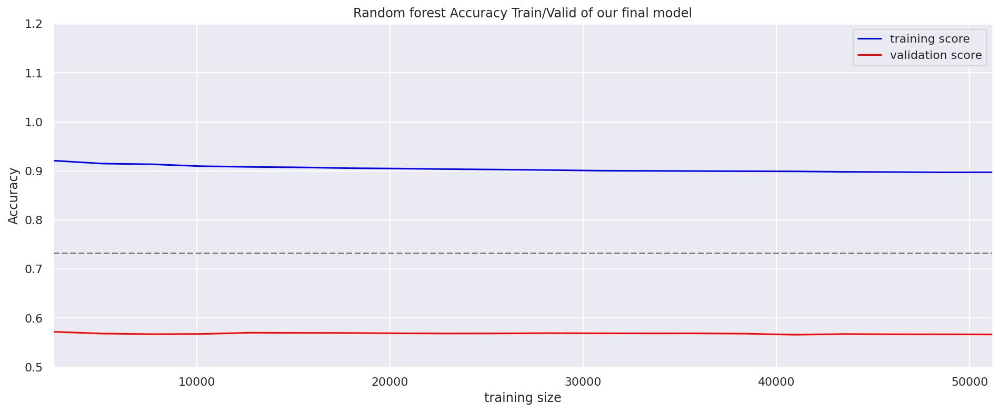

In [ ]:
# learning curve
learning_curve(N, train_lc, val_lc)

#### 4.2.5.2 Validation curve on different trees:

Although we used random search and grid search for finding the most proper hyperparameters, we still want to know that how many trees is good enough and how our model is influnenced by the different number of trees.
Like what we did in polynomial regression with different degrees.

In this kind of visualization, we can give a intuitive way of showing the chaning of train/valid score by trees number.

This can help up to use a relatively good enough number of trees when we test our model on different dataset. 
Since if we best estimator only has 22 trees, we set our limit to 50 trees in this plot.

In [ ]:
from sklearn.model_selection import validation_curve
from sklearn.pipeline import make_pipeline
import matplotlib.pyplot as plt
import numpy as np

    
n_estimators = np.arange(1, 50) # limit of number of estimators
train_score, val_score = validation_curve(RandomForestClassifier(max_features=3, n_estimators=88, random_state=42), X_train, y_train,
                                          param_name='n_estimators', param_range=n_estimators, cv=2
                                          , scoring = 'accuracy')

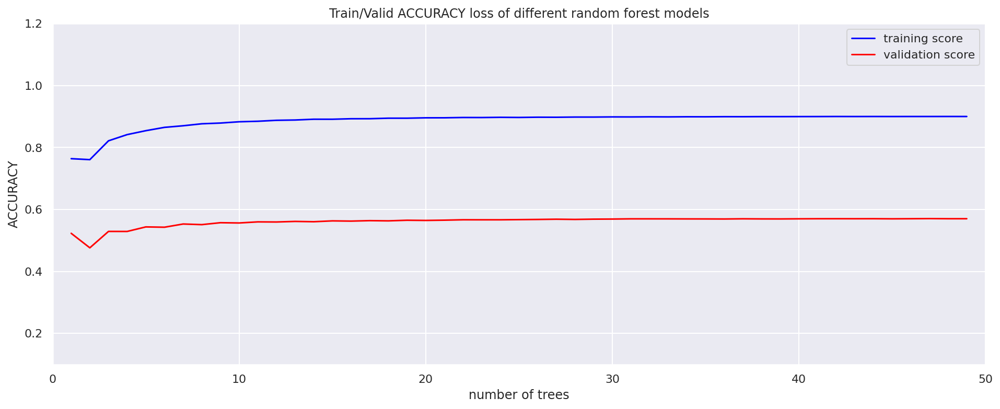

In [ ]:
# draw the validation curve
valid_score_curve(train_score, val_score, n_estimators = np.arange(1, 50))

#### 4.5.2.3 ROC curve and percision recall curve.

1. AUC-ROC curve is reall good on analyzing classification problem in machine learning. AUC stands for area under the curve and ROC stands for receiver operating characteristics curve.
The more AUC area or value is, the better the model we have in classification problem.
2. And precision - recall curve sepecially good at when we have a unbalanced dataset. 


We will reuse the function we defined before in Q3.

***ROC Curve***

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  88 out of  88 | elapsed:    1.2s finished


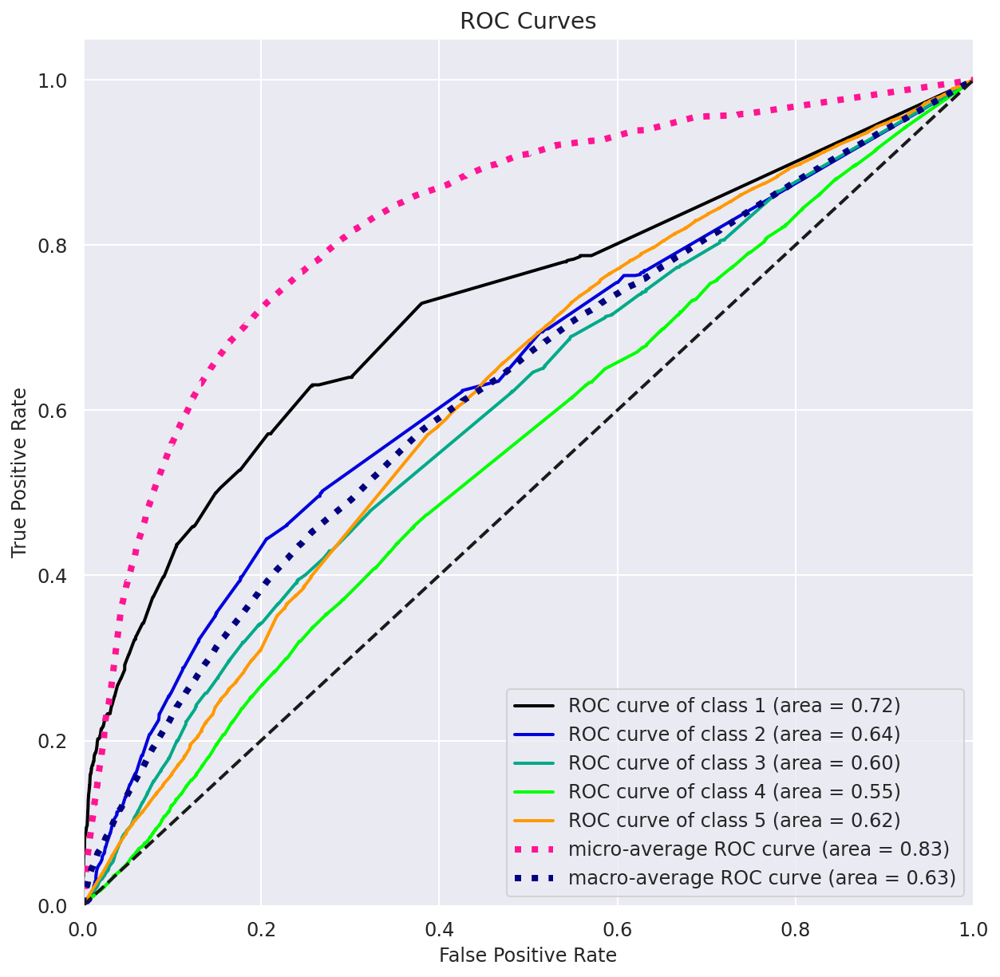

In [ ]:
# draw ROC curve
draw_roc_or_percision_recall_curve(forest_cls_final, y_test, X_test, type='roc')

***Percision Recall curve***

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  88 out of  88 | elapsed:    1.6s finished
/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_precision_recall_curve is deprecated; This will be removed in v0.5.0. Please use scikitplot.metrics.plot_precision_recall instead.
  warnings.warn(msg, category=FutureWarning)


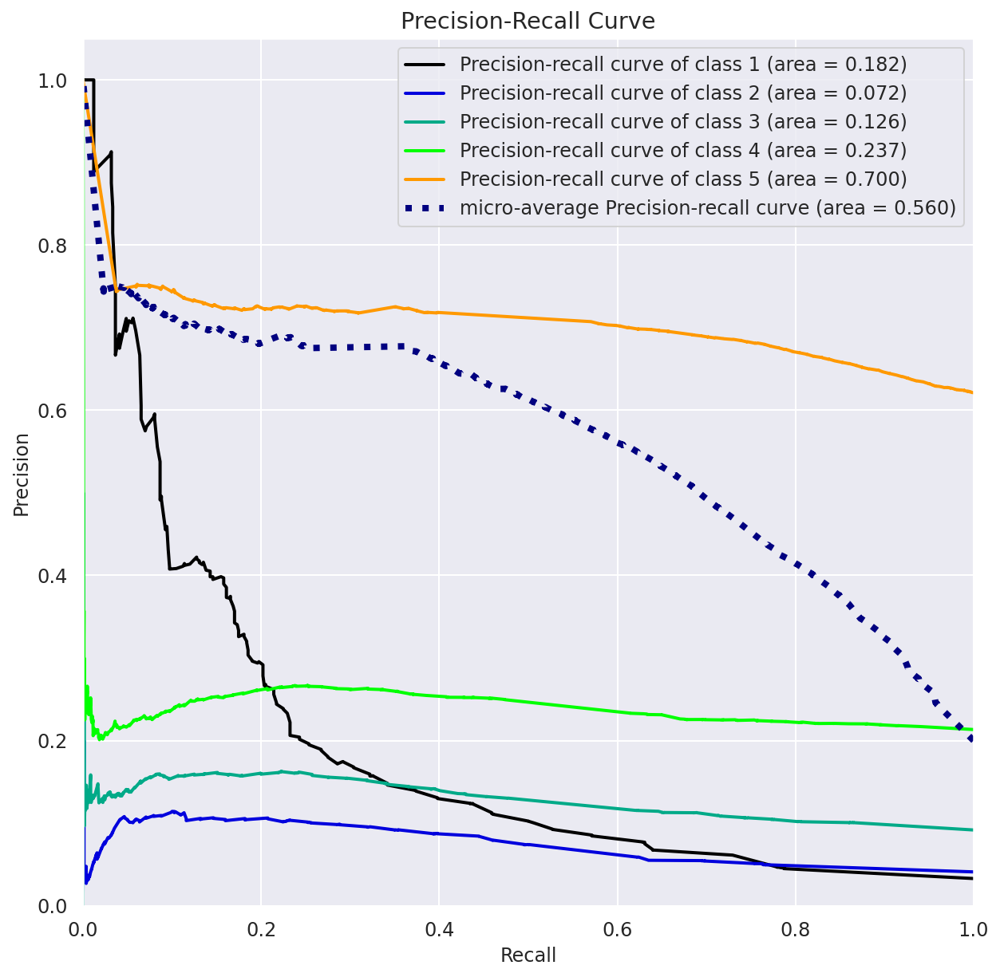

In [ ]:
# draw percision recall curve
draw_roc_or_percision_recall_curve(forest_cls_final, y_test, X_test, type='pr_c')

### 4.2.6. Analyze the results.

#### 4.2.6.1 Learning curve and validation curve

First, we analyze the learning curve.

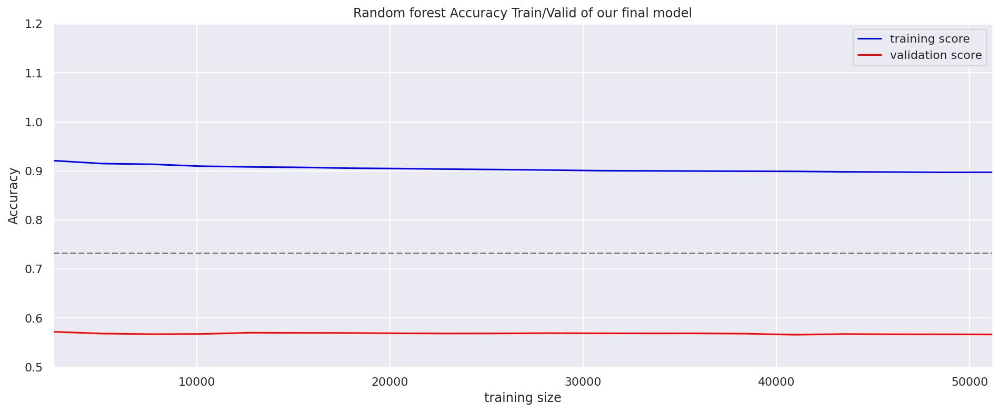

In [ ]:
# learning curve
learning_curve(N, train_lc, val_lc)

We can see that the validation score is not improve by the increasing of training size. Since our dataset is easy to fit, but not easy to separate the prediction between 5 scores.

In [ ]:
print("Classification report of the final classifier on validation set:\n\n",
      classification_report(y_test, prediction_final_test, target_names=target_names))

Classification report of the final classifier on validation set:

               precision    recall  f1-score   support

           1       0.35      0.19      0.25       658
           2       0.11      0.04      0.06       819
           3       0.17      0.08      0.10      1834
           4       0.26      0.15      0.19      4267
           5       0.65      0.84      0.73     12423

    accuracy                           0.57     20001
   macro avg       0.31      0.26      0.27     20001
weighted avg       0.49      0.57      0.52     20001



If we take a look at the classification score again, we would find that the most low scores are from predicted score 1,2,3,4. 

Even if we used the stratified sampling on the original dataset. The thing is scores from 1 to 4 are not predicting by two reasons. Not too many people gave those scores more often. We saw in data understanding part, people more likely to give high scores on product. That make things hard to predict by only their words.

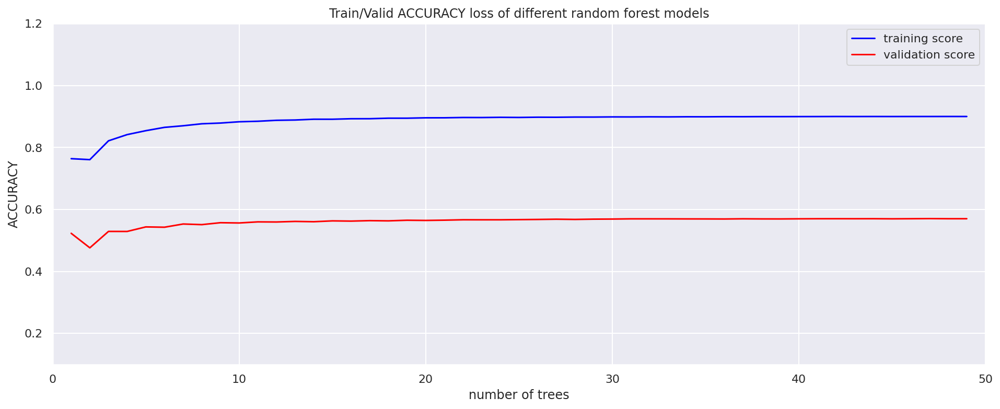

In [ ]:
# draw the validation curve
valid_score_curve(train_score, val_score, n_estimators = np.arange(1, 50))

And the validation curve shows the same pattern with Q3's model. 

We will not spend too much time on this. Because we already analyze the result from Q3.

The model start to get stable after 5 or 6 trees. That means the model is very easy to fit the dataset. But hard to improve. We probably need more words in it.
Like adjectives!


#### 4.2.6.2 ROC curve

We resue the function we defined before.

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  88 out of  88 | elapsed:    1.2s finished


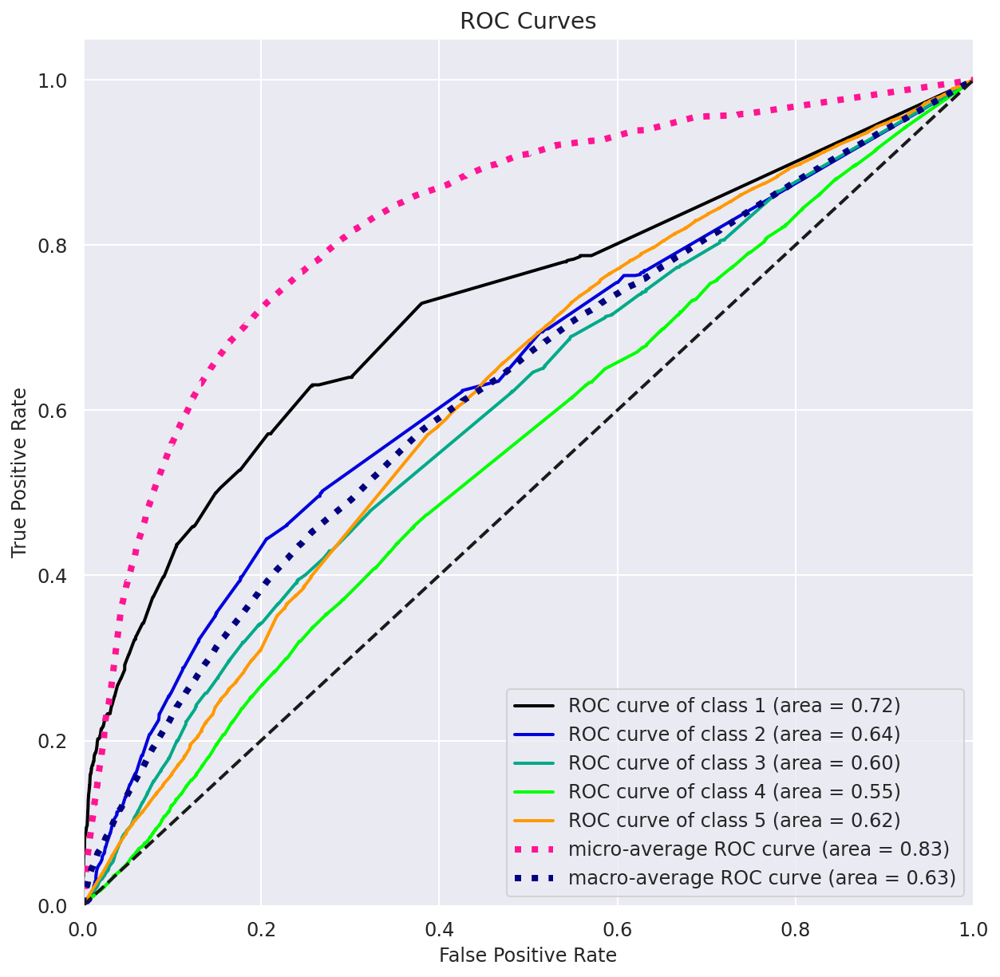

In [ ]:
# draw ROC curve
draw_roc_or_percision_recall_curve(forest_cls_final, y_test, X_test, type='roc')

We can see that class 1 still has the lowest value of AUC. But this time, the more classes' AUC curve are dropping or has lower value than we have from the original dataset. 

We can see that only nouns indeed has worse performance.

#### 4.6.2.3 Percision-Recall graph

In [ ]:
print("Classification report of the final classifier on validation set:\n\n",
      classification_report(y_test, prediction_final_test, target_names=target_names))

Classification report of the final classifier on validation set:

               precision    recall  f1-score   support

           1       0.35      0.19      0.25       658
           2       0.11      0.04      0.06       819
           3       0.17      0.08      0.10      1834
           4       0.26      0.15      0.19      4267
           5       0.65      0.84      0.73     12423

    accuracy                           0.57     20001
   macro avg       0.31      0.26      0.27     20001
weighted avg       0.49      0.57      0.52     20001



We use our previous defined function to draw this graph.

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  88 out of  88 | elapsed:    1.2s finished
/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_precision_recall_curve is deprecated; This will be removed in v0.5.0. Please use scikitplot.metrics.plot_precision_recall instead.
  warnings.warn(msg, category=FutureWarning)


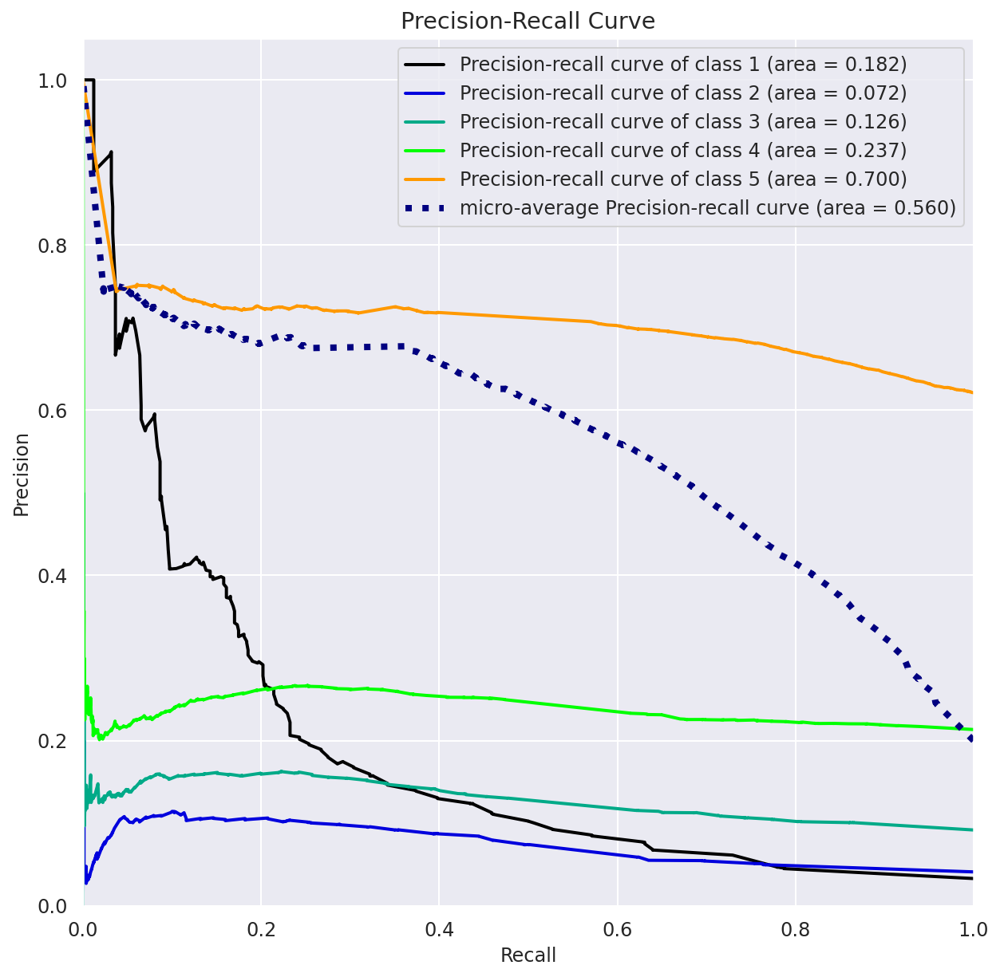

In [ ]:
# draw ROC curve
draw_roc_or_percision_recall_curve(forest_cls_final, y_test, X_test, type='pr_c')

This time, we can see class 5 has lower precision than in the original dataset. And other 4 classes have the similar performance with the orignial dataset.

## 4.3 statistical significance test with Kolmogorov-Smirnov statistic

### 4.3.1 Boxplot between two results.

Now we create a new dataFrame to save the original result and our only nouns results.

We take another look at the original results we get from Q3. Since the random seed are the same. The training data set is exactly the same between our two test.

Hence, there is no need to retrain our model from Q3.

First we retreive our original result from Q3.

In [ ]:
original_result

array([0.62990158, 0.63162006, 0.623125  , 0.62140625, 0.62265625,
       0.61984375, 0.6246875 , 0.61671875, 0.62640625, 0.62375   ])

Then retreive our only nouns results

In [ ]:
only_NN_results 

array([0.56694267, 0.57006718, 0.5690625 , 0.56484375, 0.5684375 ,
       0.56515625, 0.57203125, 0.56859375, 0.5690625 , 0.5678125 ])

Save two results into a new dataframe

In [ ]:
result = pd.DataFrame()
result['original'] = pd.DataFrame(original_result)
result['only_nn']  = pd.DataFrame(only_NN_results)

In [ ]:
result

,original,only_nn
0,0.629902,0.566943
1,0.631620,0.570067
2,0.623125,0.569063
3,0.621406,0.564844
4,0.622656,0.568438
5,0.619844,0.565156
6,0.624687,0.572031
7,0.616719,0.568594
8,0.626406,0.569063
9,0.623750,0.567813


Draw the boxplot.

Text(0.5, 1.0, 'Boxplot of Accuracy between original set and only nouns set')

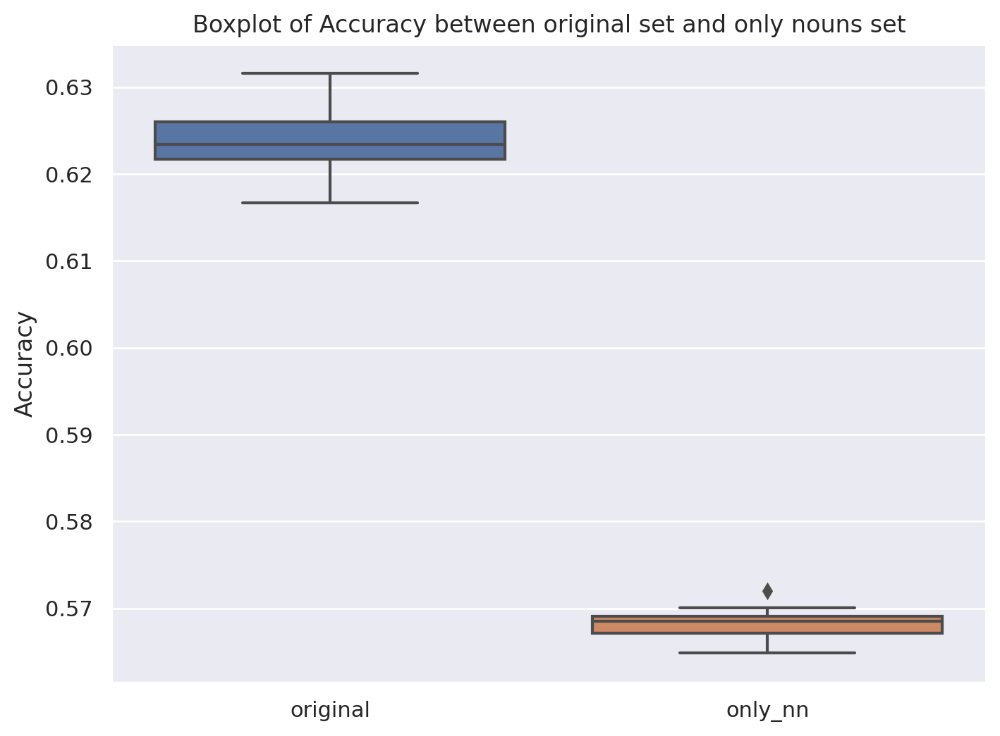

In [ ]:
figure(figsize=(8, 6), dpi=100)
ax = sns.boxplot(data=result)
plt.ylabel('Accuracy')
plt.title('Boxplot of Accuracy between original set and only nouns set')

We can see the only nouns dataset is much worse than the original dataset.

But we need the significance test to prove our hypothesis.

### 4.3.2 Significance test

First, let's what our results' distributions look like.
We would like to find our whether they are normal distributions.

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fc78b2c6c10>,
      dtype=object)

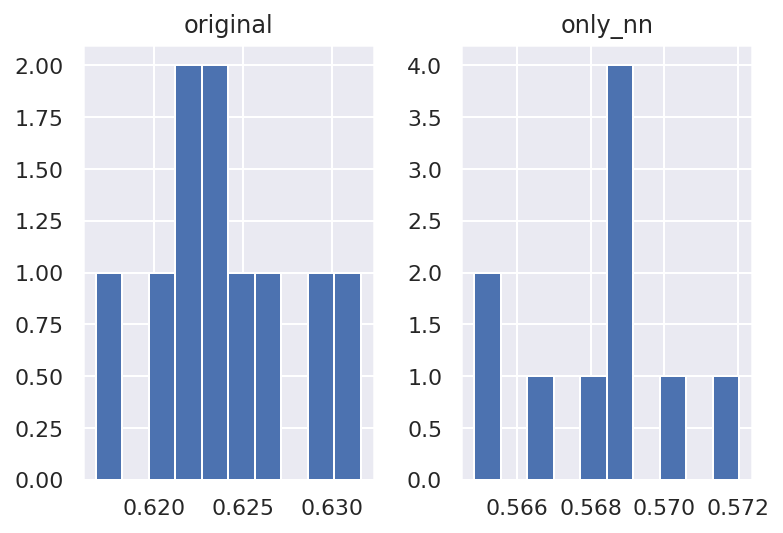

In [ ]:
result.hist()

From the above image, we can clearly see that they are not normal distribution.

Hence We can not use t-test.
For nonparameteric distribution, we use  Kolmogorov-Smirnov statistic test.

In [ ]:
from scipy.stats import ks_2samp
#---------------ks_2samp_test------------------
def ks_2samp_test(data, param1='randomForest', param2='NeuralNetwork'):
	max_print_out(True)
  # get the siginificance test results
	value, pvalue = ks_2samp(data[param1].values,data[param2].values)
	print(value, pvalue)
  # if the pvalue larget than 0.05
	if pvalue > 0.05:
		print('Samples are likely drawn from the same distributions (fail to reject H0)')
	else:
		print(' Samples are likely drawn from different distributions (reject H0)')

In [ ]:
ks_2samp_test(result, 'original', 'only_nn')

1.0 1.0825088224469026e-05
 Samples are likely drawn from different distributions (reject H0)


Now, we can see that those two results are from two different distribution. Since our H0 is rejected.

We take another look at the boxplot again.

Text(0.5, 1.0, 'Boxplot of Accuracy between original set and only_nn set')

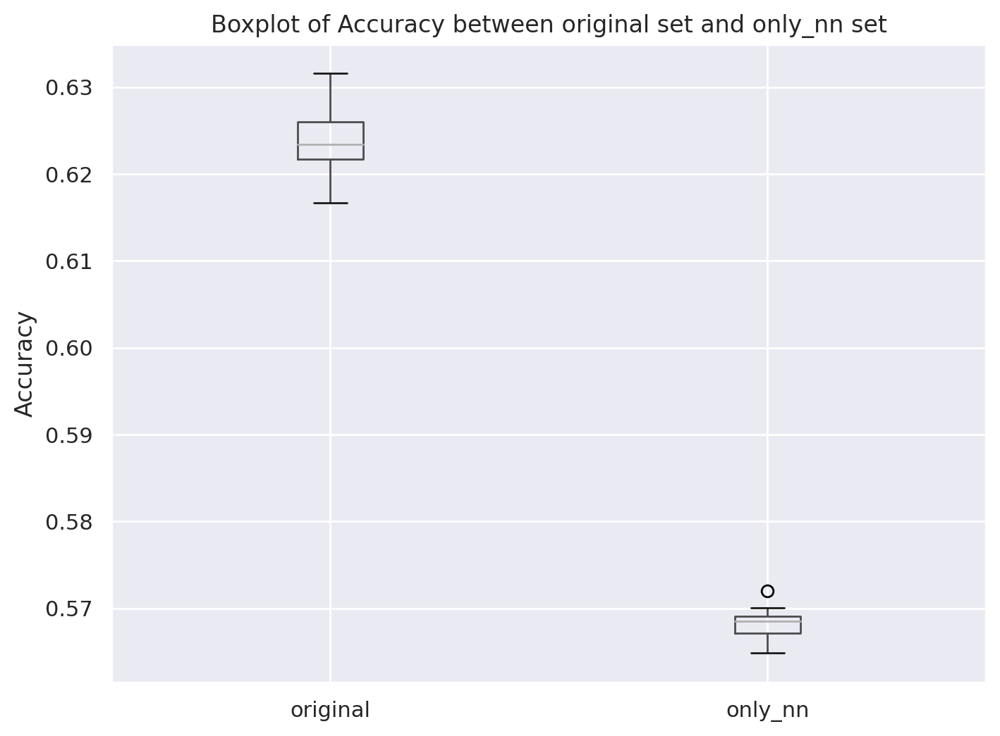

In [ ]:
figure(figsize=(8, 6), dpi=100)
result.boxplot()
plt.ylabel('Accuracy')
plt.title('Boxplot of Accuracy between original set and only_nn set')

***Now, we could say that the original dataset testing accuaracy is much better than the only nouns dataset's result.***

The reason is very clearly actually.

When a person would rate some product and write his/her review. 

He will not use nouns to express his feeling about good or bad.

That's simply impossible.

People often use adjective to express their feeling.

Like GOOD, GREAT, BAD, Remarkable, etc.

When we only extract nouns, it's basically delete all the useful information to predict the score. 

I am superised we can get 61% accuaracy. 

It's really worth to try to save all adjective words, instead of nouns.

## 4.4 Further investigation

Now we create a new dataset with extracting adjectives words.

Which is "JJ" in our case.

### 4.4.1 Get a new dataset with only adjectives

Now we get our dataset with only adjectives.

First we retrive our dataset from pkl

In [ ]:
# first we retrive this dataset
model_data_raw = joblib.load('/content/drive/MyDrive/A3/pkls/pos_data_raw.pkl')

In [ ]:
only_adj_data = model_data_raw.copy()
only_adj_data = only_adj_data.reset_index()
only_adj_data = only_adj_data.drop('index',axis = 1)

In [ ]:
# create a new column called only_noun with empty values
only_adj_data['only_adj'] = pd.NA

In [ ]:
only_adj_data.head()

,verified,text,score,POS_text,only_adj
744031,1,sigh miss claire jamie vague characters wasted...,1,"[(sigh, JJ), (miss, NN), (claire, NN), (jamie,...",<NA>
801184,1,remarkable book many levels thoroughly enjoyed...,5,"[(remarkable, JJ), (book, NN), (many, JJ), (le...",<NA>
341256,0,buy book laurel hardy fans love book certainly...,5,"[(buy, VB), (book, NN), (laurel, NN), (hardy, ...",<NA>
734969,0,enthralling suspense readers familiar ms coult...,4,"[(enthralling, VBG), (suspense, NN), (readers,...",<NA>
750145,0,great story fantastic illustrations cupidandps...,5,"[(great, JJ), (story, NN), (fantastic, JJ), (i...",<NA>


Now we get all words are belong to adjectives.

In [ ]:
# use for loop to get all pos_list
from tqdm.notebook import tqdm
for i in tqdm(range(len(only_adj_data))):
  # get one instances from POS_text by iloc with i, 3
  text_list = only_adj_data.iloc[i, 3]
  # get a empty set for saving adj words
  adj = []
  # iterate over the text_list
  for words, wtype in text_list:
    if wtype == 'JJ': # if it's a noun
      adj.append(words) # add words to our noun array
  
  # end for
  # we save our nouns extraction to our new column 
  # first we convert our list to string then save the string back to the dataset.
  str1 = " "
  adj_str = str1.join(adj)
  only_adj_data.iloc[i, 4 ] = adj_str


  0%|          | 0/100004 [00:00<?, ?it/s]

In [ ]:
only_adj_data['only_adj'] = only_adj_data.pop('only_noun')

Now, we print the new dataset's head

In [ ]:
only_adj_data.head()

,verified,text,score,POS_text,only_adj
0,1,sigh miss claire jamie vague characters wasted...,1,"[(sigh, JJ), (miss, NN), (claire, NN), (jamie,...",sigh vague mthis overcast disappointed
1,1,remarkable book many levels thoroughly enjoyed...,5,"[(remarkable, JJ), (book, NN), (many, JJ), (le...",remarkable many old afraid depressing boy old ...
2,0,buy book laurel hardy fans love book certainly...,5,"[(buy, VB), (book, NN), (laurel, NN), (hardy, ...",hardy warmth stan himi wish surprised current
3,0,enthralling suspense readers familiar ms coult...,4,"[(enthralling, VBG), (suspense, NN), (readers,...",familiar ms savich confessional san francisco ...
4,0,great story fantastic illustrations cupidandps...,5,"[(great, JJ), (story, NN), (fantastic, JJ), (i...",great fantastic faith p incredible little


In [ ]:
joblib.dump(only_adj_data,'only_adj_data.pkl')

['only_adj_tdidf_data.pkl']

***We can see that there is only adjectives left now.***



### 4.4.2 Gets our TFIDF vector

In [ ]:
only_adj_tdidf_data = TDIDF_Data_generator_pos(only_adj_data, max_features= 500,feature_name = 'only_adj')

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


Get our training, validation and testing dataset.

In [ ]:
only_adj_tdidf_data.head()

,able,accurate,actual,adorable,afraid,agree,alex,alive,amazing,amazon,american,ancient,angry,animal,anxious,appreciate,appropriate,arent,audio,authentic,author,available,average,aware,awesome,...,wanted,warm,wasnt,weak,weird,wellwritten,western,white,wide,wild,willing,wish,witty,wonderful,wont,worth,worthy,wouldnt,wow,write,wrong,youll,young,verified,score
0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1,1
1,0.00,0.00,0.00,0.00,0.41,0.00,0.00,0.37,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1,5
2,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.50,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0,5
3,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0,4
4,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0,5


In [ ]:
X_raw, y_raw = get_model_set(only_adj_tdidf_data)
X_train,X_test, y_train, y_test = train_test_split(X_raw, y_raw, test_size=0.2, random_state=42, stratify=y_raw)
X_train,X_valid, y_train, y_valid = train_test_split(X_train, y_train, test_size=0.2, random_state=42, stratify=y_train)

Pretrain our model

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report

# Train our model
forest_cls_final = RandomForestClassifier(max_features=3, n_estimators = 72, random_state=42,verbose=3)
# train our model
forest_cls_final.fit(X_train, y_train)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


building tree 1 of 72


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.9s remaining:    0.0s


building tree 2 of 72


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    1.8s remaining:    0.0s


building tree 3 of 72
building tree 4 of 72
building tree 5 of 72
building tree 6 of 72
building tree 7 of 72
building tree 8 of 72
building tree 9 of 72
building tree 10 of 72
building tree 11 of 72
building tree 12 of 72
building tree 13 of 72
building tree 14 of 72
building tree 15 of 72
building tree 16 of 72
building tree 17 of 72
building tree 18 of 72
building tree 19 of 72
building tree 20 of 72
building tree 21 of 72
building tree 22 of 72
building tree 23 of 72
building tree 24 of 72
building tree 25 of 72
building tree 26 of 72
building tree 27 of 72
building tree 28 of 72
building tree 29 of 72
building tree 30 of 72
building tree 31 of 72
building tree 32 of 72
building tree 33 of 72
building tree 34 of 72
building tree 35 of 72
building tree 36 of 72
building tree 37 of 72
building tree 38 of 72
building tree 39 of 72
building tree 40 of 72
building tree 41 of 72
building tree 42 of 72
building tree 43 of 72
building tree 44 of 72
building tree 45 of 72
building tree 46 o

[Parallel(n_jobs=1)]: Done  72 out of  72 | elapsed:   51.4s finished


RandomForestClassifier(max_features=3, n_estimators=72, random_state=42,
                       verbose=3)

In [ ]:
pred_final_valid = forest_cls_final.predict(X_valid)

target_names = ['1', '2','3','4','5']

print("Classification report of the final classifier on validation set:\n\n",
      classification_report(y_valid, pred_final_valid, target_names=target_names))

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.1s remaining:    0.0s


Classification report of the final classifier on validation set:

               precision    recall  f1-score   support

           1       0.34      0.08      0.12       526
           2       0.22      0.03      0.05       656
           3       0.37      0.11      0.17      1467
           4       0.37      0.13      0.19      3414
           5       0.66      0.94      0.78      9938

    accuracy                           0.63     16001
   macro avg       0.39      0.26      0.26     16001
weighted avg       0.54      0.63      0.54     16001



[Parallel(n_jobs=1)]: Done  72 out of  72 | elapsed:    2.5s finished


Get our cross validation score on training set

In [ ]:
from sklearn.model_selection import cross_val_score
only_adj_results = cross_val_score(forest_cls_final, X_train, y_train, cv=10)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


building tree 1 of 72


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


building tree 2 of 72


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    1.0s remaining:    0.0s


building tree 3 of 72
building tree 4 of 72
building tree 5 of 72
building tree 6 of 72
building tree 7 of 72
building tree 8 of 72
building tree 9 of 72
building tree 10 of 72
building tree 11 of 72
building tree 12 of 72
building tree 13 of 72
building tree 14 of 72
building tree 15 of 72
building tree 16 of 72
building tree 17 of 72
building tree 18 of 72
building tree 19 of 72
building tree 20 of 72
building tree 21 of 72
building tree 22 of 72
building tree 23 of 72
building tree 24 of 72
building tree 25 of 72
building tree 26 of 72
building tree 27 of 72
building tree 28 of 72
building tree 29 of 72
building tree 30 of 72
building tree 31 of 72
building tree 32 of 72
building tree 33 of 72
building tree 34 of 72
building tree 35 of 72
building tree 36 of 72
building tree 37 of 72
building tree 38 of 72
building tree 39 of 72
building tree 40 of 72
building tree 41 of 72
building tree 42 of 72
building tree 43 of 72
building tree 44 of 72
building tree 45 of 72
building tree 46 o

[Parallel(n_jobs=1)]: Done  72 out of  72 | elapsed:   34.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  72 out of  72 | elapsed:    1.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


building tree 1 of 72


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


building tree 2 of 72


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    1.0s remaining:    0.0s


building tree 3 of 72
building tree 4 of 72
building tree 5 of 72
building tree 6 of 72
building tree 7 of 72
building tree 8 of 72
building tree 9 of 72
building tree 10 of 72
building tree 11 of 72
building tree 12 of 72
building tree 13 of 72
building tree 14 of 72
building tree 15 of 72
building tree 16 of 72
building tree 17 of 72
building tree 18 of 72
building tree 19 of 72
building tree 20 of 72
building tree 21 of 72
building tree 22 of 72
building tree 23 of 72
building tree 24 of 72
building tree 25 of 72
building tree 26 of 72
building tree 27 of 72
building tree 28 of 72
building tree 29 of 72
building tree 30 of 72
building tree 31 of 72
building tree 32 of 72
building tree 33 of 72
building tree 34 of 72
building tree 35 of 72
building tree 36 of 72
building tree 37 of 72
building tree 38 of 72
building tree 39 of 72
building tree 40 of 72
building tree 41 of 72
building tree 42 of 72
building tree 43 of 72
building tree 44 of 72
building tree 45 of 72
building tree 46 o

[Parallel(n_jobs=1)]: Done  72 out of  72 | elapsed:   34.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  72 out of  72 | elapsed:    1.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


building tree 1 of 72


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


building tree 2 of 72


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.9s remaining:    0.0s


building tree 3 of 72
building tree 4 of 72
building tree 5 of 72
building tree 6 of 72
building tree 7 of 72
building tree 8 of 72
building tree 9 of 72
building tree 10 of 72
building tree 11 of 72
building tree 12 of 72
building tree 13 of 72
building tree 14 of 72
building tree 15 of 72
building tree 16 of 72
building tree 17 of 72
building tree 18 of 72
building tree 19 of 72
building tree 20 of 72
building tree 21 of 72
building tree 22 of 72
building tree 23 of 72
building tree 24 of 72
building tree 25 of 72
building tree 26 of 72
building tree 27 of 72
building tree 28 of 72
building tree 29 of 72
building tree 30 of 72
building tree 31 of 72
building tree 32 of 72
building tree 33 of 72
building tree 34 of 72
building tree 35 of 72
building tree 36 of 72
building tree 37 of 72
building tree 38 of 72
building tree 39 of 72
building tree 40 of 72
building tree 41 of 72
building tree 42 of 72
building tree 43 of 72
building tree 44 of 72
building tree 45 of 72
building tree 46 o

[Parallel(n_jobs=1)]: Done  72 out of  72 | elapsed:   34.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  72 out of  72 | elapsed:    0.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


building tree 1 of 72


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


building tree 2 of 72


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    1.0s remaining:    0.0s


building tree 3 of 72
building tree 4 of 72
building tree 5 of 72
building tree 6 of 72
building tree 7 of 72
building tree 8 of 72
building tree 9 of 72
building tree 10 of 72
building tree 11 of 72
building tree 12 of 72
building tree 13 of 72
building tree 14 of 72
building tree 15 of 72
building tree 16 of 72
building tree 17 of 72
building tree 18 of 72
building tree 19 of 72
building tree 20 of 72
building tree 21 of 72
building tree 22 of 72
building tree 23 of 72
building tree 24 of 72
building tree 25 of 72
building tree 26 of 72
building tree 27 of 72
building tree 28 of 72
building tree 29 of 72
building tree 30 of 72
building tree 31 of 72
building tree 32 of 72
building tree 33 of 72
building tree 34 of 72
building tree 35 of 72
building tree 36 of 72
building tree 37 of 72
building tree 38 of 72
building tree 39 of 72
building tree 40 of 72
building tree 41 of 72
building tree 42 of 72
building tree 43 of 72
building tree 44 of 72
building tree 45 of 72
building tree 46 o

[Parallel(n_jobs=1)]: Done  72 out of  72 | elapsed:   34.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  72 out of  72 | elapsed:    0.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


building tree 1 of 72


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


building tree 2 of 72


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.9s remaining:    0.0s


building tree 3 of 72
building tree 4 of 72
building tree 5 of 72
building tree 6 of 72
building tree 7 of 72
building tree 8 of 72
building tree 9 of 72
building tree 10 of 72
building tree 11 of 72
building tree 12 of 72
building tree 13 of 72
building tree 14 of 72
building tree 15 of 72
building tree 16 of 72
building tree 17 of 72
building tree 18 of 72
building tree 19 of 72
building tree 20 of 72
building tree 21 of 72
building tree 22 of 72
building tree 23 of 72
building tree 24 of 72
building tree 25 of 72
building tree 26 of 72
building tree 27 of 72
building tree 28 of 72
building tree 29 of 72
building tree 30 of 72
building tree 31 of 72
building tree 32 of 72
building tree 33 of 72
building tree 34 of 72
building tree 35 of 72
building tree 36 of 72
building tree 37 of 72
building tree 38 of 72
building tree 39 of 72
building tree 40 of 72
building tree 41 of 72
building tree 42 of 72
building tree 43 of 72
building tree 44 of 72
building tree 45 of 72
building tree 46 o

[Parallel(n_jobs=1)]: Done  72 out of  72 | elapsed:   34.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  72 out of  72 | elapsed:    0.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


building tree 1 of 72


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


building tree 2 of 72


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    1.0s remaining:    0.0s


building tree 3 of 72
building tree 4 of 72
building tree 5 of 72
building tree 6 of 72
building tree 7 of 72
building tree 8 of 72
building tree 9 of 72
building tree 10 of 72
building tree 11 of 72
building tree 12 of 72
building tree 13 of 72
building tree 14 of 72
building tree 15 of 72
building tree 16 of 72
building tree 17 of 72
building tree 18 of 72
building tree 19 of 72
building tree 20 of 72
building tree 21 of 72
building tree 22 of 72
building tree 23 of 72
building tree 24 of 72
building tree 25 of 72
building tree 26 of 72
building tree 27 of 72
building tree 28 of 72
building tree 29 of 72
building tree 30 of 72
building tree 31 of 72
building tree 32 of 72
building tree 33 of 72
building tree 34 of 72
building tree 35 of 72
building tree 36 of 72
building tree 37 of 72
building tree 38 of 72
building tree 39 of 72
building tree 40 of 72
building tree 41 of 72
building tree 42 of 72
building tree 43 of 72
building tree 44 of 72
building tree 45 of 72
building tree 46 o

[Parallel(n_jobs=1)]: Done  72 out of  72 | elapsed:   35.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  72 out of  72 | elapsed:    0.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


building tree 1 of 72


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


building tree 2 of 72


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    1.0s remaining:    0.0s


building tree 3 of 72
building tree 4 of 72
building tree 5 of 72
building tree 6 of 72
building tree 7 of 72
building tree 8 of 72
building tree 9 of 72
building tree 10 of 72
building tree 11 of 72
building tree 12 of 72
building tree 13 of 72
building tree 14 of 72
building tree 15 of 72
building tree 16 of 72
building tree 17 of 72
building tree 18 of 72
building tree 19 of 72
building tree 20 of 72
building tree 21 of 72
building tree 22 of 72
building tree 23 of 72
building tree 24 of 72
building tree 25 of 72
building tree 26 of 72
building tree 27 of 72
building tree 28 of 72
building tree 29 of 72
building tree 30 of 72
building tree 31 of 72
building tree 32 of 72
building tree 33 of 72
building tree 34 of 72
building tree 35 of 72
building tree 36 of 72
building tree 37 of 72
building tree 38 of 72
building tree 39 of 72
building tree 40 of 72
building tree 41 of 72
building tree 42 of 72
building tree 43 of 72
building tree 44 of 72
building tree 45 of 72
building tree 46 o

[Parallel(n_jobs=1)]: Done  72 out of  72 | elapsed:   35.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  72 out of  72 | elapsed:    0.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


building tree 1 of 72


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


building tree 2 of 72


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.9s remaining:    0.0s


building tree 3 of 72
building tree 4 of 72
building tree 5 of 72
building tree 6 of 72
building tree 7 of 72
building tree 8 of 72
building tree 9 of 72
building tree 10 of 72
building tree 11 of 72
building tree 12 of 72
building tree 13 of 72
building tree 14 of 72
building tree 15 of 72
building tree 16 of 72
building tree 17 of 72
building tree 18 of 72
building tree 19 of 72
building tree 20 of 72
building tree 21 of 72
building tree 22 of 72
building tree 23 of 72
building tree 24 of 72
building tree 25 of 72
building tree 26 of 72
building tree 27 of 72
building tree 28 of 72
building tree 29 of 72
building tree 30 of 72
building tree 31 of 72
building tree 32 of 72
building tree 33 of 72
building tree 34 of 72
building tree 35 of 72
building tree 36 of 72
building tree 37 of 72
building tree 38 of 72
building tree 39 of 72
building tree 40 of 72
building tree 41 of 72
building tree 42 of 72
building tree 43 of 72
building tree 44 of 72
building tree 45 of 72
building tree 46 o

[Parallel(n_jobs=1)]: Done  72 out of  72 | elapsed:   34.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  72 out of  72 | elapsed:    0.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


building tree 1 of 72


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


building tree 2 of 72


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    1.0s remaining:    0.0s


building tree 3 of 72
building tree 4 of 72
building tree 5 of 72
building tree 6 of 72
building tree 7 of 72
building tree 8 of 72
building tree 9 of 72
building tree 10 of 72
building tree 11 of 72
building tree 12 of 72
building tree 13 of 72
building tree 14 of 72
building tree 15 of 72
building tree 16 of 72
building tree 17 of 72
building tree 18 of 72
building tree 19 of 72
building tree 20 of 72
building tree 21 of 72
building tree 22 of 72
building tree 23 of 72
building tree 24 of 72
building tree 25 of 72
building tree 26 of 72
building tree 27 of 72
building tree 28 of 72
building tree 29 of 72
building tree 30 of 72
building tree 31 of 72
building tree 32 of 72
building tree 33 of 72
building tree 34 of 72
building tree 35 of 72
building tree 36 of 72
building tree 37 of 72
building tree 38 of 72
building tree 39 of 72
building tree 40 of 72
building tree 41 of 72
building tree 42 of 72
building tree 43 of 72
building tree 44 of 72
building tree 45 of 72
building tree 46 o

[Parallel(n_jobs=1)]: Done  72 out of  72 | elapsed:   34.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  72 out of  72 | elapsed:    0.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


building tree 1 of 72


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.5s remaining:    0.0s


building tree 2 of 72


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.9s remaining:    0.0s


building tree 3 of 72
building tree 4 of 72
building tree 5 of 72
building tree 6 of 72
building tree 7 of 72
building tree 8 of 72
building tree 9 of 72
building tree 10 of 72
building tree 11 of 72
building tree 12 of 72
building tree 13 of 72
building tree 14 of 72
building tree 15 of 72
building tree 16 of 72
building tree 17 of 72
building tree 18 of 72
building tree 19 of 72
building tree 20 of 72
building tree 21 of 72
building tree 22 of 72
building tree 23 of 72
building tree 24 of 72
building tree 25 of 72
building tree 26 of 72
building tree 27 of 72
building tree 28 of 72
building tree 29 of 72
building tree 30 of 72
building tree 31 of 72
building tree 32 of 72
building tree 33 of 72
building tree 34 of 72
building tree 35 of 72
building tree 36 of 72
building tree 37 of 72
building tree 38 of 72
building tree 39 of 72
building tree 40 of 72
building tree 41 of 72
building tree 42 of 72
building tree 43 of 72
building tree 44 of 72
building tree 45 of 72
building tree 46 o

[Parallel(n_jobs=1)]: Done  72 out of  72 | elapsed:   34.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  72 out of  72 | elapsed:    0.9s finished


In [ ]:
only_adj_results

[0.62568349,
 0.6300578,
 0.624375,
 0.6296875,
 0.62578125,
 0.6253125,
 0.6275,
 0.6265625,
 0.6246875,
 0.62515625]

Save to our result dataFrame

In [ ]:
result['only_adj'] = pd.DataFrame(only_adj_results)

Draw the boxplot

Text(0.5, 1.0, 'Boxplot of Accuracy between original set, only noun and only adjectives set')

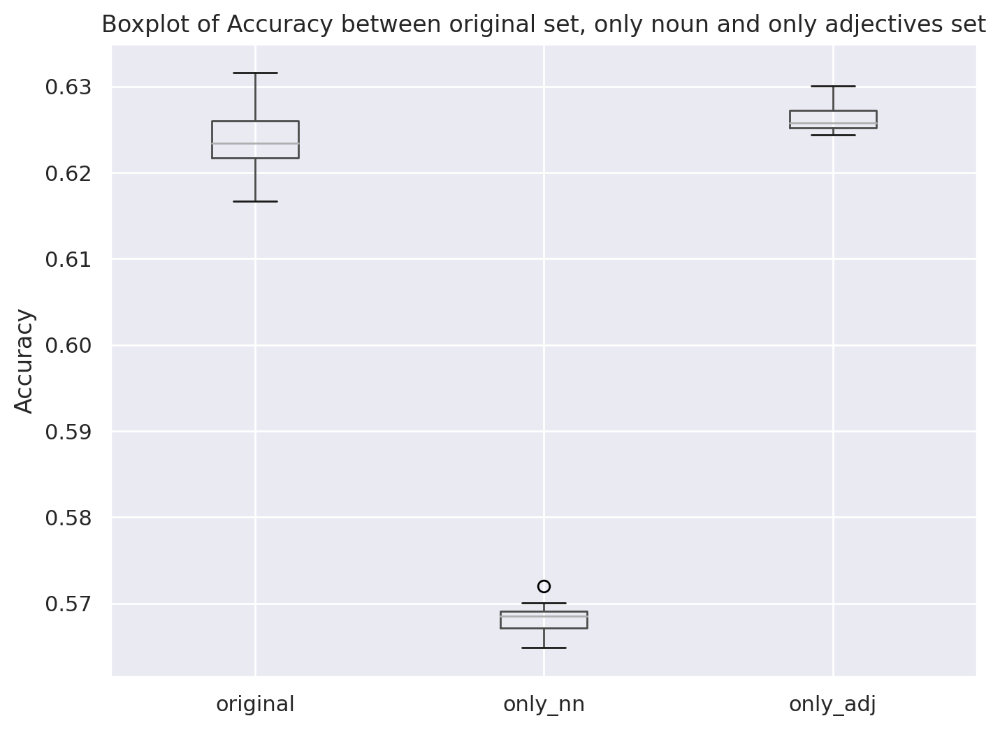

In [ ]:
figure(figsize=(8, 6), dpi=100)
result.boxplot()
plt.ylabel('Accuracy')
plt.title('Boxplot of Accuracy between original set, only noun and only adjectives set')

We can see that our dataset with only adjectives are much better than the other two.
It has higher average scores and small range of minimun and maximum.

In [ ]:
ks_2samp_test(result, 'original', 'only_adj')

0.6 0.05244755244755244
Samples are likely drawn from the same distributions (fail to reject H0)


Although we can't pass the significance test.
But if we have more data, I would say only adjective words are our best choice.
Since, we use less data, but we got a very similar results with the original data. And we have higher minimun accuracy value than the original data's result.

It means our adjectives model is more stable.

# Reference

1. Stack Overflow. (n.d.). Removing html tags in pandas. https://stackoverflow.com/questions/45999415/removing-html-tags-in-pandas 

2. Stack Overflow. (n.d.). Python remove stop words from pandas dataframe.  https://stackoverflow.com/questions/29523254/python-remove-stop-words-from-pandas-dataframe

3. MasterClass staff. (2022, February 25). Mass Market Paperbacks: 5 Parts of a Mass Market Paperback. MasterClass. https://www.masterclass.com/articles/mass-market-paperback

4. Spark by Examples. (n.d.). Pandas Combine Two Columns of Text in DataFrame. https://sparkbyexamples.com/pandas/pandas-combine-two-columns-of-text-in-dataframe/
1. Python Software Foundation. (n.d.). Date time - Basic date and time types. Python. https://docs.python.org/3/library/datetime.html#strftime-and-strptime-behavior

2. Hmghaly. (2013, October 7). Sklearn plot confusion matrix with labels. Stackoverflow. https://stackoverflow.com/questions/19233771/sklearn-plot-confusion-matrix-with-labels

3. RDocumentation. (n.d.). Prop.table: Express Table Entries as Fraction of Marginal Table. RDocumentation. https://www.rdocumentation.org/packages/base/versions/3.6.2/topics/prop.table

5. Learning Curve. (n.d.). In Wikipedia. Retrieved July 3, 2022, from https://en.wikipedia.org/wiki/Learning_curve 

6. Scikit learn. (n.d.). Sklearn.svm.SVC. Scikit learn. https://scikit-learn.org/stable/modules/generated/sklearn.svm.SVC.html

7. Early stopping. (n.d.). In Wikipedia. Retrieved July 3, 2022, from https://en.wikipedia.org/wiki/Early_stopping 

8. Kassambara, A. (2018). Machine Learning Essentials: Practical Guide in R. CreateSpace Independent Publishing Platform. https://www.datanovia.com/en/product/machine-learning-essentials-practical-guide-in-r/?url=/5-bookadvisor/54-machine-learning-essentials/

10. Learning Curve. (n.d.). In Wikipedia. Retrieved June 22, 2022, from https://en.wikipedia.org/wiki/Learning_curve

12. Early stopping. (n.d.). In Wikipedia. Retrieved June 22, 2022, from https://en.wikipedia.org/wiki/Early_stopping

13. Géron, A. (2019).  Hands-On Machine Learning with Scikit-Learn, Keras, and TensorFlow, 2nd Edition. O'Reilly Media, Inc.
